In [1]:
# authorize google account to use bigquery
from google.colab import auth
auth.authenticate_user()
print('Authenticated')

# authorize drive to pull model
from google.colab import drive
drive.mount('/content/drive')

# pull data for repo from bigquery
project_id = 'uic-capstone-int'
from google.cloud import bigquery

client = bigquery.Client(project=project_id)

Authenticated
Mounted at /content/drive


In [2]:
import pandas as pd
import matplotlib.pyplot as plt

In [3]:
WeeklyTS = pd.read_csv('/content/drive/My Drive/Cloudbakers/Assets/WeeklyTS.csv')

In [ ]:
df = pd.read_csv('/content/drive/My Drive/Cloudbakers/Assets/RFdataset.csv')

In [4]:
WeeklyTS.drop('Unnamed: 0', axis=1, inplace=True)

In [5]:
WeeklyTS = WeeklyTS[WeeklyTS.year > 2014]

In [6]:
WeeklyTS['dateInt']=WeeklyTS['year'].astype(str) + WeeklyTS['month'].astype(str).str.zfill(2)+ WeeklyTS['day'].astype(str).str.zfill(2)
WeeklyTS['Date'] = pd.to_datetime(WeeklyTS['dateInt'], format='%Y%m%d')

In [7]:
WeeklyTS.drop(['year','month','day','dateInt'], axis=1, inplace=True)

In [8]:
WeeklyTS

,repoID,Risk_Score,Date
0,156630873,4.993297,2019-05-26
1,156630873,4.698987,2019-06-02
2,156630873,13.574554,2019-06-09
3,156630873,15.044745,2019-06-16
4,156630873,3.832983,2019-06-23
...,...,...,...
42713,86057409,3.282592,2020-09-13
42714,86057409,0.000000,2020-09-20
42715,86057409,3.282592,2020-09-27
42716,86057409,2.218666,2020-10-04


In [9]:
from datetime import datetime
now=datetime.now()
today = now.strftime("%Y-%m-%d")
today

'2020-11-01'

In [10]:
repo_ids = WeeklyTS['repoID'].unique().tolist()

# Modeling 2

In [17]:
import os
import pandas as pd
import numpy as np
from datetime import datetime

In [18]:
# os.chdir('/content/drive/My Drive/Cloudbakers/Assets/')

## preprocession


In [23]:
import numpy as np
import pandas as pd

from sklearn.preprocessing import MinMaxScaler


def preprocessing(series):
    '''
    MinMax Scaling of the raw time series
    Args:
        series: the raw time series
    Returns:
        scaled_series and scaler object
    '''
    series = np.array(series)
    scaler = MinMaxScaler(feature_range=(0, 1))
    scaled = scaler.fit_transform(series.reshape(-1,1))
    scaled_series = scaled.reshape((len(series),))
    
    return scaled_series, scaler

def inverse_transform(series,scaler):
    '''
    Inverse transform of scales series
    Args:
        series: scaled series
        scaler: scaler object
    Returns:
        unscaled series
    '''
    return scaler.inverse_transform(series.reshape(-1,1))

def getSeries(data,p):
    '''
    Splits a given time series proportionally
    for training and testing purposes
    
    Args:
        data: numpy array or pandas series 
              containing the time series.
        p: float value that defines the 
           proportion of the series used
           for training.
    Returns:
        series: time series for training
        y_test: time series for testing
        n_test: number of timesteps 
                in the test series
    
    '''
    n = data.shape[0]
    n_train = int(n * p) 
    n_test = n - n_train

    x = np.arange(n)
        
    index_train = x[:n_train]
    index_test = x[n_train:]
    
    series = data[index_train]

    y_test = data[index_test]
    return series, y_test, n_test

def getInputOutput(series, input_size):
    '''
    Transforms the time series into desired 
    shape to be able to pass to the network
    
    Args:
        series: the time series.
        input_size: int that defines the length 
                    of the input sequence to be 
                    fed to the network
    Returns:
        X_train: input dataset
        y_train: output values
        X_test: the last available sequence
    
    '''
    
    series = np.array(series)
    xlen = len(series)
    xrows = xlen - input_size
    
    X_train, y_train = [], []
    
    for i in range(xrows):
        j = i + input_size
        a = series[i:j, np.newaxis]
        X_train.append(a)
        y_train.append(series[j])
    
    X_train,y_train = np.array(X_train), np.array(y_train)
    X_test = series[xrows:].reshape(1,input_size,1)
    
    
    return X_train, y_train, X_test

## Model

In [24]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import keras
import itertools

from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import MinMaxScaler
from keras.models import Sequential
from keras.layers import Dense, LSTM, Dropout




def build_LSTM(input_size, hidden_units, dropout, learning_rate):
    '''
    Builds the Network with LSTM hidden layers
    
    Args:
        input_size: int that defines the length 
                    of the input sequence to be 
                    fed to the network
        hidden_units: int/list specifying the number 
                      of hidden units in the hidden 
                      layer/layers
        dropout: boolean specifing whether to add dropout
                 with 0.5 rate per layer
        learning_rate: learning rate of the Adam 
                       optimization algorithm
    Returns:
        model: keras sequential model
        
    '''
    h = hidden_units
    

    model = Sequential()
    
    if isinstance(h,list):
    
        model.add(LSTM(h[0], 
                   batch_input_shape=(1,input_size, 1), 
                   return_sequences=True, 
                   stateful=True))
                  
        if dropout:
            model.add(Dropout(rate=0.5))

        if len(h) > 2:
            #removing 1st and last units
            for index, units in enumerate(h[1:-1]):  
                model.add(LSTM(units, 
                               batch_input_shape=(1,h[index], 1), 
                               return_sequences=True, 
                               stateful=True)) 
                if dropout:
                    model.add(Dropout(rate=0.5))

        model.add(LSTM(h[-1], 
                       batch_input_shape=(1,h[-2], 1), 
                       return_sequences=False, 
                       stateful=True))
        if dropout:
            model.add(Dropout(rate=0.5))
    else:
        model.add(LSTM(h, 
                   batch_input_shape=(1,input_size, 1), 
                   return_sequences=False, 
                   stateful=True)) 
        if dropout:
            model.add(Dropout(rate=0.5))
        
    
    model.add(Dense(1))
    adam = keras.optimizers.Adam(lr=learning_rate)
    model.compile(loss='mse', optimizer=adam)
    return model

def predict_ahead(model,X_test,n_ahead):
    '''
    Makes predictions based on the last available sequence
    
    Args:
        model: keras sequential model
        X_test: the last available sequence
        n_ahead: number of predictions to make 
        
    Returns:
        predictions: numpy array containing the predicted values
        
    '''    
    predictions = np.zeros(n_ahead)
    predictions[0] = model.predict(X_test,batch_size = 1)
    
    if n_ahead > 1:
        for i in range(1,n_ahead):
            x_new = np.append(X_test[0][1:],predictions[i-1])
            X_test = x_new.reshape(1,x_new.shape[0],1)
            predictions[i] = model.predict(X_test,batch_size = 1)
    return predictions

def FitForecast(X_train, y_train, X_test, n_ahead, input_size,
                hidden_units, dropout, val_split, learning_rate, 
                epochs, trained_model):
    
    '''
    Fits a model and returns the predicted values. 
    Optionally weights from another network can be passed 
    
    Args:
        X_train: input dataset for training
        y_train: output dataset for training
        X_test: the last available sequence
        n_ahead: number of predictions to make 
        time_series: the time series of interest
        input_size: int that defines the length 
                    of the input sequence to be 
                    fed to the network
        hidden_units: int/list specifying the number 
                      of hidden units in the hidden 
                      layer/layers
        dropout: boolean specifing whether to add dropout
                 with 0.5 rate per layer
        learning_rate: learning rate of the Adam 
                       optimization algorithm
        epochs: int that defines the number of 
                training phases through the
                training dataset
        trained_model: already trained keras sequential 
                       model
        
    Returns:
        model: keras sequential model
        predictions: numpy array containing the predicted values
        history: training and validation loss history
        
    '''
    model = build_LSTM(input_size,hidden_units,dropout, learning_rate)
    
    if trained_model is not None:
        model.set_weights(weights = trained_model.get_weights())        
    
    
    history = model.fit(x=X_train, y=y_train, 
                batch_size=1, epochs=epochs, 
                verbose=1, validation_split=val_split,
                shuffle=False)

    predictions = predict_ahead(model,X_test,n_ahead)
    return model, predictions, history

def FitEvaluate(time_series,params):
    '''
    Calls the pipeline to fit an LSTM model to the 
    given time series
    
    Args:
        time_series: the time series of interest
        params: a dictionary specifying parameters
                {input_size, hidden_units, dropout,
                learning_rate, n_ahead, val_split, 
                epochs, verbose, plot}
    Returns:
        model: keras sequential model      
        mse: mean squared error of the prediction
        history: training and validation loss history
        
    '''   
    
    for k in params.keys():
        globals()[k] = params[k]
    
    
    scaled_series, scaler = preprocessing(time_series)
    series, y_test, n_test = getSeries(scaled_series,0.8)
    X_train,y_train,X_test = getInputOutput(series,input_size)
    
    # show only n_ahead number of actual values
    y_test = y_test[np.arange(n_ahead)]

    new_model, predictions, history = FitForecast(X_train,y_train,X_test,n_ahead,
                                        input_size,hidden_units,dropout, val_split,
                                        learning_rate,epochs,trained_model=None)
    
    # rescaling
    series = inverse_transform(series, scaler)
    y_test = inverse_transform(y_test, scaler)
    predictions = inverse_transform(predictions, scaler)
    
    mse = mean_squared_error(y_true=y_test,y_pred=predictions)
    
    if verbose:
        print('\n')
        print('======== Prediction Evaluation =========')
        print('MSE is {}'.format(round(mse,4)))
        
    if plot:
        ViewLoss(history)
        view_predictions(series,predictions,y_test,'Actual vs Forecast')
    return new_model, mse, history, predictions, y_test

def TransferLearning(time_series,params,model):
    '''
    Calls the pipeline to fit an LSTM model to the 
    given time series with and without knowledge
    transfer
    
    Args:
        time_series: the time series of interest
        params: a dictionary specifying parameters
                {input_size, hidden_units, dropout,
                learning_rate, n_ahead, val_split, 
                epochs, verbose, plot}
        model: already trained keras sequential 
               model
    Returns:
        mean squared errors of the predictions
        and 2 plots         
    '''
    for k in params.keys():
        globals()[k] = params[k]
    
    val_split = 0
    
    scaled_series, scaler = preprocessing(time_series)
    series, y_test, n_test = getSeries(scaled_series,0.8)
    X_train,y_train,X_test = getInputOutput(series,input_size)

    # show only n_ahead number of actual values
    y_test = y_test[np.arange(n_ahead)]

    
    print('*** Fitting a model without knowledge transfer ***')
    model_noTransfer, predictions_noTransfer, _ = FitForecast(X_train,y_train,
                                                             X_test,n_ahead,
                                               input_size,hidden_units,
                                                             dropout,val_split,
                                                             learning_rate,
                                               epochs,
                                                             trained_model=None)
    
    print('\n')
    print('*** Fitting a model with knowledge transfer ***')
    model_withTransfer, predictions_withTransfer, _ = FitForecast(X_train,y_train,
                                                                 X_test,n_ahead,
                                                                 input_size,hidden_units,
                                                                 dropout,val_split,
                                                                 learning_rate,
                                                                 epochs,
                                                                 trained_model=model)
    
    # rescaling
    series = inverse_transform(series, scaler)
    y_test = inverse_transform(y_test, scaler)
    predictions_noTransfer = inverse_transform(predictions_noTransfer, scaler)
    predictions_withTransfer = inverse_transform(predictions_withTransfer, scaler)
    
    mse_noTransfer = mean_squared_error(y_true=y_test,y_pred=predictions_noTransfer)
    mse_withTransfer = mean_squared_error(y_true=y_test,y_pred=predictions_withTransfer)
      
    print('\n')
    print('======== Results for no knowledge transfer =========')
    print('The RMSE is {}'.format(round(np.sqrt(mse_noTransfer),4)))
    print('\n')
    print('======== Results for knowledge transfer =========')
    print('The RMSE is {}'.format(round(np.sqrt(mse_withTransfer),4)))
        
    view_predictions(series,predictions_noTransfer,y_test,title='Without Transfer')
    view_predictions(series,predictions_withTransfer,y_test,title='With Transfer')

    return model_withTransfer

def GridSearch(series,params_grid):
    '''
    Runs a grid search over specified parameter ranges
    Args: 
        series: the time series of interest
        params_grid: a dictionary specifying parameters
                    {input_size, hidden_units, dropout,
                    learning_rate, n_ahead, val_split, 
                    epochs, verbose, plot} and their 
                    possible value ranges
    Returns:
        model: the model with the lowest MSE 
        logs: logs of all combinations        
       
    '''
    param_names = list(params_grid.keys())
    param_values = list(params_grid.values()) 
    combinations = list(itertools.product(*param_values))
    
    logs = pd.DataFrame(combinations,columns=param_names)
    
    mse_prev = 50
    for index, comb in enumerate(combinations):
        
        print('Fitting {}/{} model'.format(index+1,len(combinations)))
        params = dict(zip(param_names,comb))
        model, mse, history, predn, y_test = FitEvaluate(series,params)
        train_loss = history.history['loss']
        val_loss = history.history['val_loss']
        
        
        if mse < mse_prev:
            mse_prev = mse
            best_model = model
            best_predictions = predn
            yt = y_test
        
        logs.at[index,'mse'] = mse
        logs.at[index,'mean_training_loss'] = np.mean(train_loss)
        logs.at[index,'std_training_loss'] = np.std(train_loss)
        logs.at[index,'mean_val_loss'] = np.mean(val_loss)
        logs.at[index,'std_val_loss'] = np.std(val_loss)
    logs.to_csv('results.csv',index=False)
    # view_predictions(series,best_predictions,y_test,'Actual vs Forecast')
    return best_model, logs, best_predictions, yt


def generalTuning(series1, series2, params):
    
    '''
    Fitting 3 models trained on 
    {general domain,general+in-domain,in-domain only}
    and comparing them
    Args: 
        series1: target related time series 
        series2: target time series
        params: a dictionary specifying parameters
                {input_size, hidden_units, dropout,
                learning_rate, n_ahead, val_split, 
                epochs, verbose, plot}
    Returns:
        mean squared errors of the predictions
        and 3 plots 
    
    '''
    
    time_series = np.concatenate([series1,series2])
        
    
    
    for k in params.keys():
        globals()[k] = params[k]
        
    val_split = 0
    
    # preprocessing general series
    scaled_general, scaler_general = preprocessing(time_series)
    series_general, _, __ = getSeries(scaled_general,0.9)
    X_train_general,y_train_general,___ = getInputOutput(series_general,input_size)

    # preprocessing the target series
    scaled_target, scaler_target = preprocessing(series2) 
    series_target, y_test_target, n_test = getSeries(scaled_target,0.8)
    X_train_target,y_train_target,X_test_target = getInputOutput(series_target,input_size)

    # comparing predictions with only n_ahead number of actual values
    y_test_target = y_test_target[np.arange(n_ahead)]

    
    # build and train a model on the general domain (time_series)
    
    print('*** Fitting a model on general domain ***')

    
    model_general, predictions_pre_tuned, hist = FitForecast(X_train_general,y_train_general,
                                                             X_test_target,n_ahead,
                                                             input_size, hidden_units,
                                                             dropout, val_split,
                                                             learning_rate,
                                                             epochs,
                                                             trained_model=None)                                               
                                                             
                                                             
                                                        
 
    # initiallize a model for target
    model_tuned = build_LSTM(input_size, hidden_units, dropout, learning_rate)
        
    # transfer the knowledge from the pre-trained model
    # and tune it only on the target domain (series2)
    model_tuned.set_weights(weights=model_general.get_weights())        
    
    
    print('\n *** Tuning a model on target domain ***')

    model_tuned.fit(x=X_train_target, y=y_train_target, 
                        batch_size=1, epochs=epochs, 
                        verbose=1, validation_data=None,
                        shuffle=False)
    
    predictions_tuned = predict_ahead(model_tuned,X_test_target,n_ahead)
    
    
   
    print('\n *** Fitting a model on target domain only ***')

    model_target, predictions_target,hist2 = FitForecast(X_train_target,y_train_target,
                                                   X_test_target,n_ahead,
                                                   input_size, hidden_units,
                                                   dropout, val_split,
                                                   learning_rate,
                                                   2 * epochs,
                                                   trained_model=None)                                               


    series_target = inverse_transform(series_target,scaler_target)
    y_test_target = inverse_transform(y_test_target,scaler_target)
    
    series_general = inverse_transform(series_general,scaler_general)
    predictions_pre_tuned = inverse_transform(predictions_pre_tuned,scaler_target)
    mse_pre_tuned = mean_squared_error(y_true=y_test_target,y_pred=predictions_pre_tuned)
    
    predictions_tuned = inverse_transform(predictions_tuned,scaler_target)
    mse_tuned = mean_squared_error(y_true=y_test_target,y_pred=predictions_tuned)
    
    predictions_target = inverse_transform(predictions_target,scaler_target)  
    mse_target = mean_squared_error(y_true=y_test_target,y_pred=predictions_target)
    
    print('\n')
    print('======== Results for pre_tuned model =========')
    print('The RMSE is {}'.format(round(np.sqrt(mse_pre_tuned),4)))
    print('\n')
    print('======== Results for tuned model =========')
    print('The RMSE is {}'.format(round(np.sqrt(mse_tuned),4)))
    
    print('\n')
    print('======== Results for target model only =========')
    print('The RMSE is {}'.format(round(np.sqrt(mse_target),4)))
    
        
    view_predictions([series_general,series_target],predictions_pre_tuned,y_test_target,title='Pre-tuned')
    view_predictions([series_general,series_target],predictions_tuned,y_test_target,title='Tuned')
    view_predictions(series_target,predictions_target,y_test_target,title='Target only')


## Visualization

In [25]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from statsmodels.tsa.stattools import acf, pacf
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

def ACF(series,lags):
    '''
    Plots the Autocorrelation graph
    of the series
    Args:
        series: time series of interest
        lags: int specifying number of 
              periods to look back
    Returns: plot
    '''
    plot_acf(series, lags=lags)
    plt.savefig('ACF.png')
    plt.show()

def plotSeries(series_dict):
    '''
    Plots several time series
    Args:
        series_dict: dict with series names as keys
                     and time series as values
    Returns:
        plot
        
    '''
    n_series = len(series_dict) - 1
    names = list(series_dict.keys())
    
    plt.figure(figsize=(10,20))
    
    for i in range(n_series):
        plt.subplot(n_series,1,i+1)
        plt.title(names[i+1])
        plt.plot(series_dict['t'],series_dict[names[i+1]])
        
    plt.show()

def ViewLoss(history):
    '''
    Plots the history of model training
    '''
    plt.plot(history.history['loss'],label='Train')
    plt.plot(history.history['val_loss'],label='Val')
    plt.title('Model loss')
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend()
    plt.savefig('loss-history.png')
    plt.show()

def view_predictions(series,predictions,actual,title):
    '''
    Plots the results of the predictions made by the model
    
    Args:
        series: the time series used for training the network
        predictions: numpy array containing the predicted values
        actual: the actual time series not seen by the network
        title: the title of the plot
        
    Returns:
        plot        
        
    '''  
    
    plt.figure(figsize=(8,4))
    plt.title(title)
    
    if isinstance(series,list):
        train_index = np.arange(len(series[0]))
        test_index = len(series[0]) + np.arange(len(actual))
        
        plt.plot(train_index,series[0], label = 'general')
        
    else:
        train_index = np.arange(len(series))
        test_index = len(series) + np.arange(len(actual))        
        plt.plot(train_index,series,label = 'training')

    if len(predictions) > 4:
        plt.plot(test_index,predictions,label = 'prediction',color='g')
        plt.plot(test_index,actual,label = 'actual',color='orange')
    else:
        plt.scatter(test_index,predictions,label = 'prediction',color='g')
        plt.scatter(test_index,actual,label = 'actual',color='orange')    
    
    plt.xlabel('Index')
    plt.ylabel('Data')
    
    plt.legend(loc='upper left')
    plt.savefig('{}_{}.png'.format(title,len(series)))
    plt.show()

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


## Grid Search

In [32]:
WeeklyTS = pd.read_csv('/content/drive/My Drive/Cloudbakers/Assets/WeeklyTS.csv')
WeeklyTS.drop('Unnamed: 0', axis=1, inplace=True)
WeeklyTS = WeeklyTS[WeeklyTS.year > 2014]
WeeklyTS['dateInt']=WeeklyTS['year'].astype(str) + WeeklyTS['month'].astype(str).str.zfill(2)+ WeeklyTS['day'].astype(str).str.zfill(2)
WeeklyTS['Date'] = pd.to_datetime(WeeklyTS['dateInt'], format='%Y%m%d')
WeeklyTS.drop(['year','month','day','dateInt'], axis=1, inplace=True)

In [33]:
WeeklyTS

,repoID,Risk_Score,Date
0,156630873,4.993297,2019-05-26
1,156630873,4.698987,2019-06-02
2,156630873,13.574554,2019-06-09
3,156630873,15.044745,2019-06-16
4,156630873,3.832983,2019-06-23
...,...,...,...
42713,86057409,3.282592,2020-09-13
42714,86057409,0.000000,2020-09-20
42715,86057409,3.282592,2020-09-27
42716,86057409,2.218666,2020-10-04


In [34]:
now=datetime.now()
today = now.strftime("%Y-%m-%d")
today

'2020-10-31'

In [35]:
repo_ids = WeeklyTS['repoID'].unique().tolist()

In [12]:
Sub_WeeklyTS = WeeklyTS[WeeklyTS['repoID']==156630873].sort_values(by=['Date'])
Sub_WeeklyTS.index=Sub_WeeklyTS['Date']
Sub_WeeklyTS.drop('Date',axis=1,inplace=True)
idx = pd.date_range('2015-01-01', today, freq='W-SUN')
Sub_WeeklyTS.index = pd.DatetimeIndex(Sub_WeeklyTS.index)
Sub_WeeklyTS = Sub_WeeklyTS.reindex(idx, fill_value=0)
Sub_WeeklyTS.drop(['repoID'], axis=1, inplace=True)

In [14]:
# date = Sub_WeeklyTS.index.strftime("%Y-%m-%d").to_numpy()
# # type(date)
Risk_Score = Sub_WeeklyTS.Risk_Score.to_numpy()

In [48]:
# Sub_Weekly_dict = {'t':date,
#               'Risk_Score':Risk_Score}
# plotSeries(Sub_Weekly_dict)

In [68]:
# to perform a grid search over the parameter
params_grid = {'input_size': [3,30,70],
              'hidden_units':[100,[100,50],[100,50,50]],
              'dropout': [True, False],
              'learning_rate':[4e-5],
              'n_ahead':[10],
              'val_split': [0.2],
              'epochs':[10],
              'verbose':[False],
              'plot':[False]}

Risk_Score = Sub_WeeklyTS['Risk_Score'].to_numpy()
model_, logs = GridSearch(Risk_Score,params_grid)

Fitting 1/18 model
Epoch 1/10
192/192 [==============================] - 1s 5ms/step - loss: 0.0000e+00 - val_loss: 0.1141
Epoch 2/10
192/192 [==============================] - 0s 2ms/step - loss: 2.0230e-06 - val_loss: 0.1158
Epoch 3/10
192/192 [==============================] - 0s 2ms/step - loss: 2.0677e-06 - val_loss: 0.1142
Epoch 4/10
192/192 [==============================] - 0s 2ms/step - loss: 3.9613e-07 - val_loss: 0.1147
Epoch 5/10
192/192 [==============================] - 1s 3ms/step - loss: 6.2734e-07 - val_loss: 0.1180
Epoch 6/10
192/192 [==============================] - 0s 2ms/step - loss: 3.9223e-06 - val_loss: 0.1133
Epoch 7/10
192/192 [==============================] - 0s 2ms/step - loss: 1.9866e-06 - val_loss: 0.1158
Epoch 8/10
192/192 [==============================] - 0s 2ms/step - loss: 6.9195e-06 - val_loss: 0.1126
Epoch 9/10
192/192 [==============================] - 0s 2ms/step - loss: 2.8125e-07 - val_loss: 0.1130
Epoch 10/10
192/192 [========================

In [117]:
# model with lowest MSE
params = {'input_size': 70,
          'hidden_units':[100,50],
          'dropout': False,
          'learning_rate':4e-5,
          'n_ahead':10,
          'val_split': 0.2,
          'epochs':10,
          'verbose':False,
          'plot':False}

In [118]:
model_, mse, hist, best_prediction, yt  = FitEvaluate(Risk_Score,params)

Epoch 1/10
138/138 [==============================] - 5s 36ms/step - loss: 0.0021 - val_loss: 0.1454
Epoch 2/10
138/138 [==============================] - 5s 33ms/step - loss: 0.0022 - val_loss: 0.1320
Epoch 3/10
138/138 [==============================] - 4s 31ms/step - loss: 0.0021 - val_loss: 0.1242
Epoch 4/10
138/138 [==============================] - 4s 31ms/step - loss: 0.0021 - val_loss: 0.1180
Epoch 5/10
138/138 [==============================] - 4s 31ms/step - loss: 0.0020 - val_loss: 0.1127
Epoch 6/10
138/138 [==============================] - 5s 34ms/step - loss: 0.0020 - val_loss: 0.1079
Epoch 7/10
138/138 [==============================] - 5s 34ms/step - loss: 0.0020 - val_loss: 0.1038
Epoch 8/10
138/138 [==============================] - 4s 32ms/step - loss: 0.0019 - val_loss: 0.0999
Epoch 9/10
138/138 [==============================] - 5s 33ms/step - loss: 0.0019 - val_loss: 0.0965
Epoch 10/10
138/138 [==============================] - 5s 33ms/step - loss: 0.0019 - val_lo

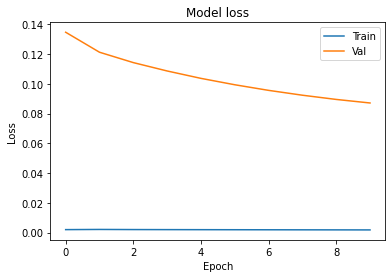

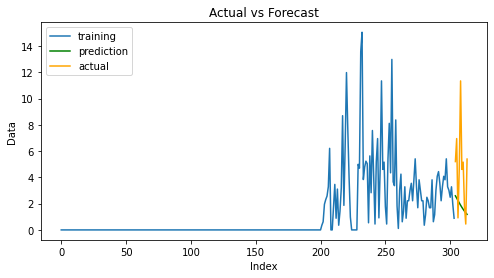

mean-squared-error: 16.521662190310707


In [96]:
ViewLoss(hist)
view_predictions(Risk_Score,best_prediction,yt,'Actual vs Forecast')
print('mean-squared-error: {}'.format(mse))

## Transfer Learning

******Training on Repo ID: 7567432 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0168
Epoch 2/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0151
Epoch 3/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0149
Epoch 4/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0148
Epoch 5/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0147
Epoch 6/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0147
Epoch 7/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0146
Epoch 8/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0145
Epoch 9/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0145
Epoch 10/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0144


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [==============

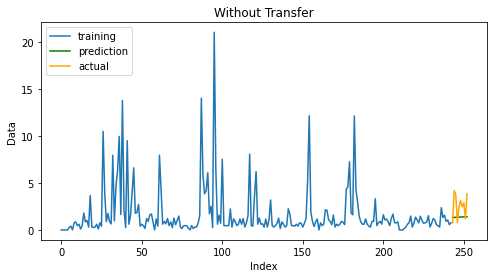

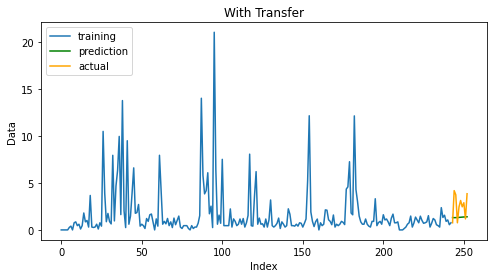

******Training on Repo ID: 82691991 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0011
Epoch 2/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0012
Epoch 3/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0012
Epoch 4/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0012
Epoch 5/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0012
Epoch 6/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0011
Epoch 7/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0011
Epoch 8/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0011
Epoch 9/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0011
Epoch 10/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0011


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [=============

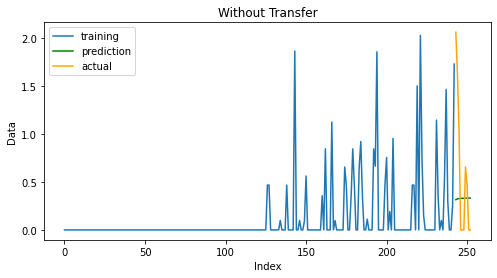

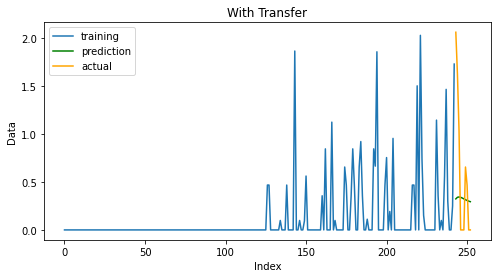

******Training on Repo ID: 172554606 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0152
Epoch 2/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0148
Epoch 3/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0146
Epoch 4/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0145
Epoch 5/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0144
Epoch 6/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0143
Epoch 7/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0142
Epoch 8/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0142
Epoch 9/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0142
Epoch 10/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0141


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [============

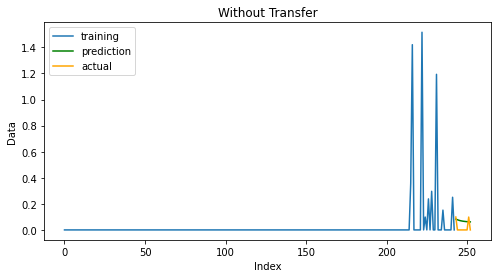

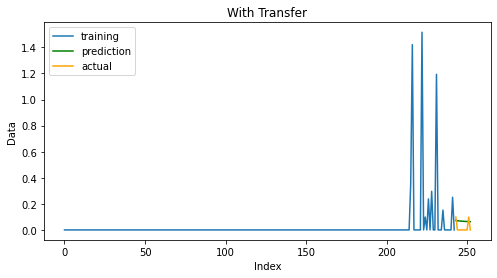

******Training on Repo ID: 183648903 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0149
Epoch 2/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0145
Epoch 3/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0145
Epoch 4/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0144
Epoch 5/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0144
Epoch 6/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0143
Epoch 7/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0143
Epoch 8/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0143
Epoch 9/10
173/173 [==============================] - 5s 29ms/step - loss: 0.0143
Epoch 10/10
173/173 [==============================] - 5s 29ms/step - loss: 0.0142


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [============

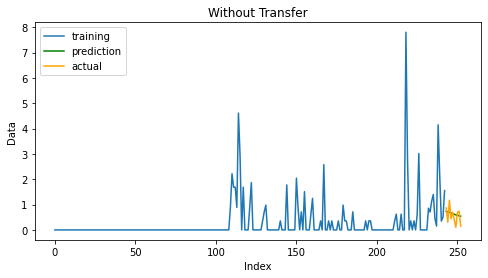

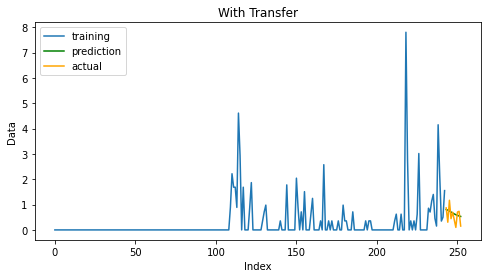

******Training on Repo ID: 93444591 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0205
Epoch 2/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0184
Epoch 3/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0182
Epoch 4/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0181
Epoch 5/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0180
Epoch 6/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0179
Epoch 7/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0178
Epoch 8/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0178
Epoch 9/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0177
Epoch 10/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0176


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [=============

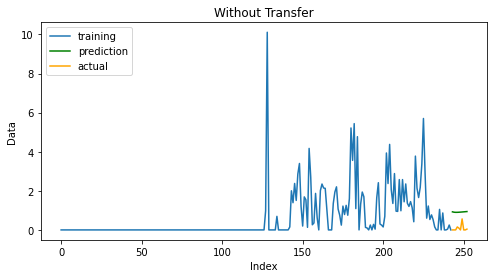

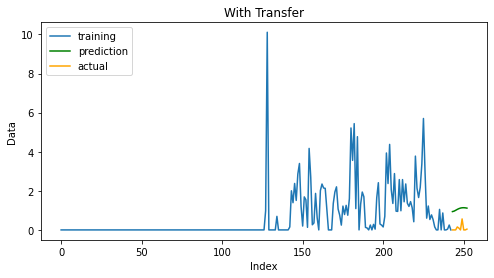

******Training on Repo ID: 37991233 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0163
Epoch 2/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0144
Epoch 3/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0141
Epoch 4/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0140
Epoch 5/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0138
Epoch 6/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0137
Epoch 7/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0136
Epoch 8/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0136
Epoch 9/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0135
Epoch 10/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0134


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [=============

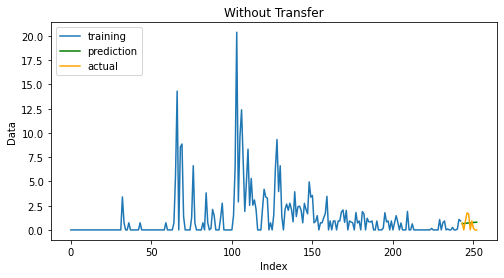

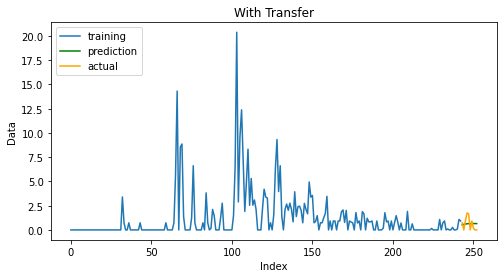

******Training on Repo ID: 197049215 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0064
Epoch 2/10
173/173 [==============================] - 5s 29ms/step - loss: 0.0070
Epoch 3/10
173/173 [==============================] - 5s 29ms/step - loss: 0.0068
Epoch 4/10
173/173 [==============================] - 5s 29ms/step - loss: 0.0067
Epoch 5/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0066
Epoch 6/10
173/173 [==============================] - 5s 29ms/step - loss: 0.0066
Epoch 7/10
173/173 [==============================] - 5s 29ms/step - loss: 0.0065
Epoch 8/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0065
Epoch 9/10
173/173 [==============================] - 5s 29ms/step - loss: 0.0065
Epoch 10/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0065


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [============

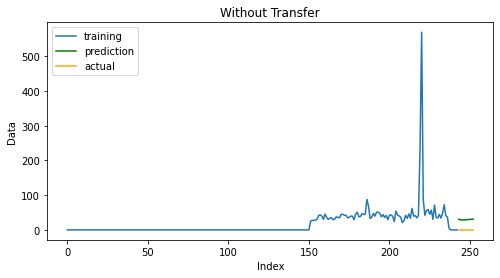

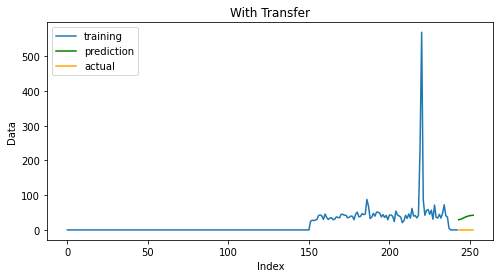

******Training on Repo ID: 194727787 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0124
Epoch 2/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0125
Epoch 3/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0120
Epoch 4/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0117
Epoch 5/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0113
Epoch 6/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0109
Epoch 7/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0105
Epoch 8/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0101
Epoch 9/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0097
Epoch 10/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0092


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [============

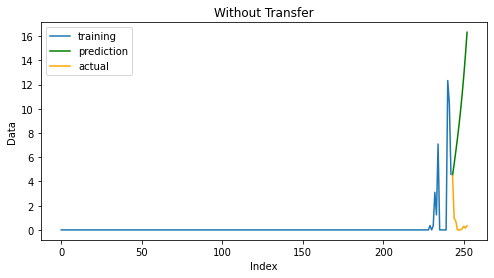

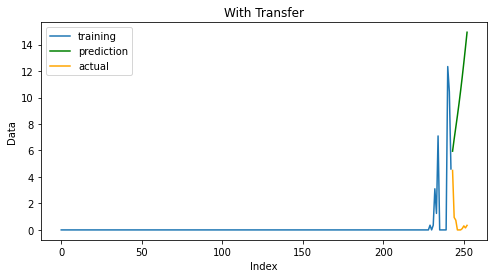

******Training on Repo ID: 194736246 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0108
Epoch 2/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0106
Epoch 3/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0104
Epoch 4/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0102
Epoch 5/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0101
Epoch 6/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0099
Epoch 7/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0098
Epoch 8/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0097
Epoch 9/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0096
Epoch 10/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0095


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [============

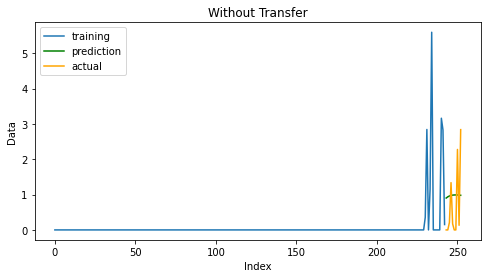

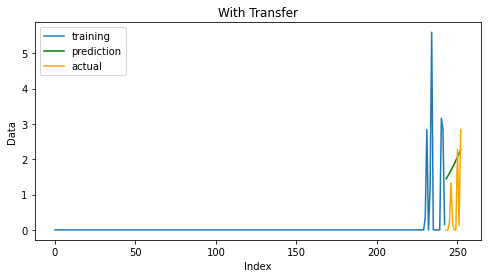

******Training on Repo ID: 58072252 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0412
Epoch 2/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0346
Epoch 3/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0338
Epoch 4/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0335
Epoch 5/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0333
Epoch 6/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0332
Epoch 7/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0330
Epoch 8/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0329
Epoch 9/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0328
Epoch 10/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0327


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [=============

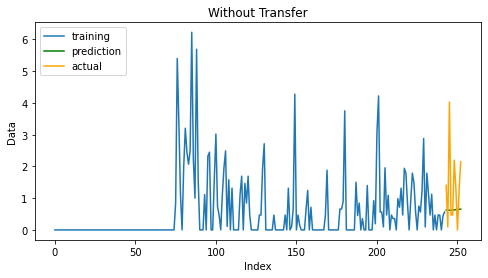

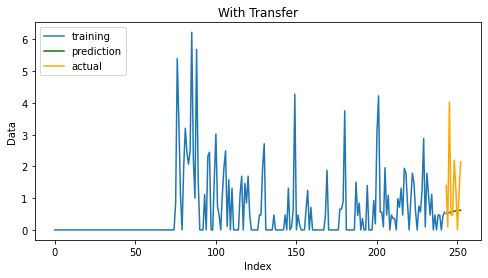

******Training on Repo ID: 121842 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0161
Epoch 2/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0129
Epoch 3/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0128
Epoch 4/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0128
Epoch 5/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0128
Epoch 6/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0127
Epoch 7/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0127
Epoch 8/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0127
Epoch 9/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0127
Epoch 10/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0127


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [===============

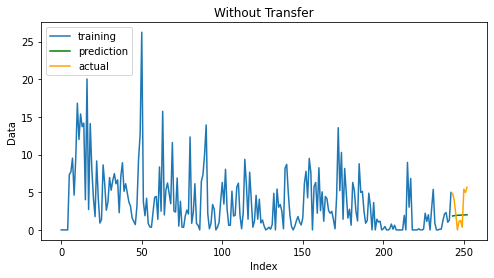

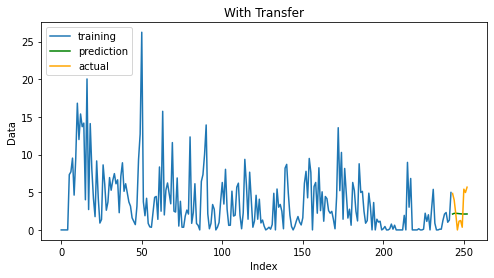

******Training on Repo ID: 462292 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0161
Epoch 2/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0120
Epoch 3/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0119
Epoch 4/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0118
Epoch 5/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0118
Epoch 6/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0117
Epoch 7/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0117
Epoch 8/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0117
Epoch 9/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0116
Epoch 10/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0116


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [===============

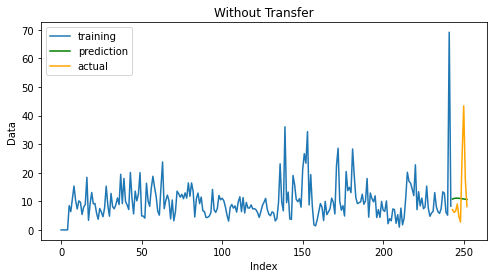

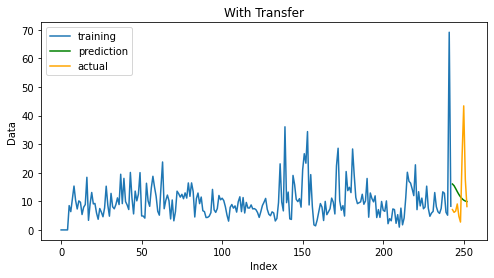

******Training on Repo ID: 92187408 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0295
Epoch 2/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0268
Epoch 3/10
173/173 [==============================] - 5s 29ms/step - loss: 0.0261
Epoch 4/10
173/173 [==============================] - 5s 29ms/step - loss: 0.0256
Epoch 5/10
173/173 [==============================] - 5s 29ms/step - loss: 0.0252
Epoch 6/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0250
Epoch 7/10
173/173 [==============================] - 5s 29ms/step - loss: 0.0247
Epoch 8/10
173/173 [==============================] - 5s 28ms/step - loss: 0.0245
Epoch 9/10
173/173 [==============================] - 5s 28ms/step - loss: 0.0244
Epoch 10/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0242


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [=============

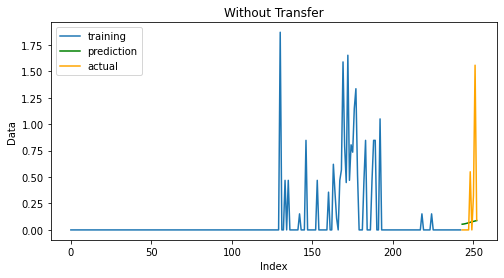

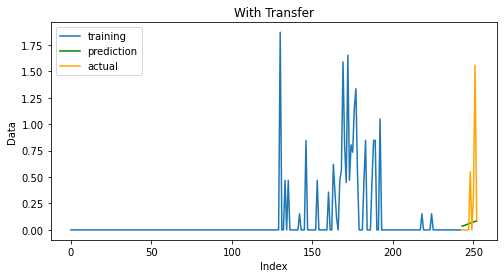

******Training on Repo ID: 133959957 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0108
Epoch 2/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0102
Epoch 3/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0096
Epoch 4/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0093
Epoch 5/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0091
Epoch 6/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0091
Epoch 7/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0090
Epoch 8/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0090
Epoch 9/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0090
Epoch 10/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0089


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [============

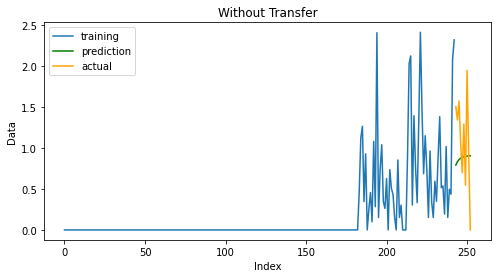

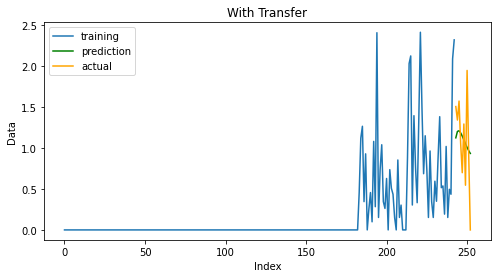

******Training on Repo ID: 60121077 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0078
Epoch 2/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0076
Epoch 3/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0076
Epoch 4/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0076
Epoch 5/10
173/173 [==============================] - 8s 47ms/step - loss: 0.0075
Epoch 6/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0075
Epoch 7/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0075
Epoch 8/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0075
Epoch 9/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0075
Epoch 10/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0075


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [=============

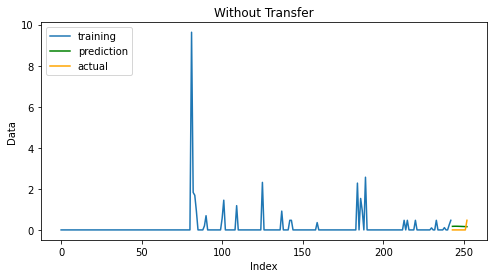

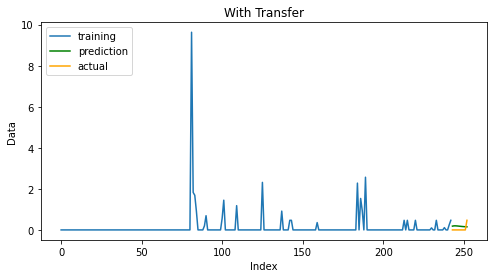

******Training on Repo ID: 24584820 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0083
Epoch 2/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0082
Epoch 3/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0082
Epoch 4/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0082
Epoch 5/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0082
Epoch 6/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0081
Epoch 7/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0081
Epoch 8/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0081
Epoch 9/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0081
Epoch 10/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0081


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [=============

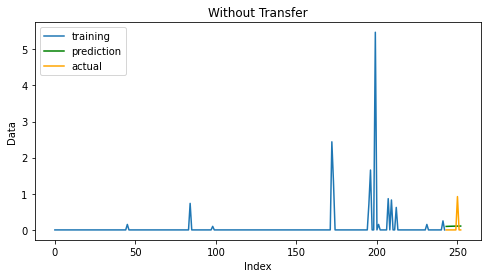

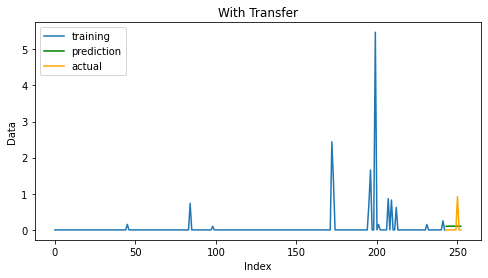

******Training on Repo ID: 108050 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0029
Epoch 2/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0022
Epoch 3/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0022
Epoch 4/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0022
Epoch 5/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0022
Epoch 6/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0022
Epoch 7/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0022
Epoch 8/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0022
Epoch 9/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0022
Epoch 10/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0022


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [===============

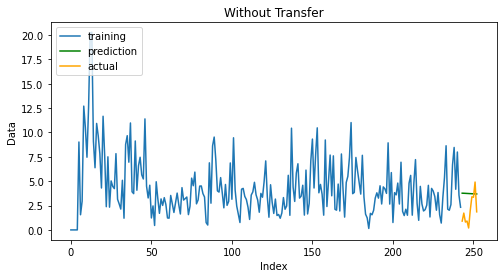

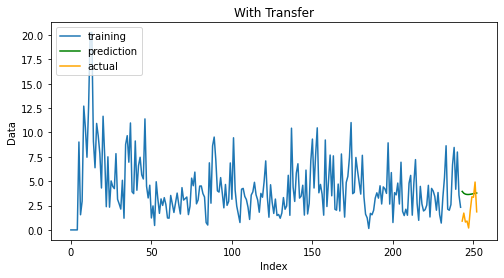

******Training on Repo ID: 404397 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0187
Epoch 2/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0173
Epoch 3/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0171
Epoch 4/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0170
Epoch 5/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0168
Epoch 6/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0167
Epoch 7/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0167
Epoch 8/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0166
Epoch 9/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0165
Epoch 10/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0164


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [===============

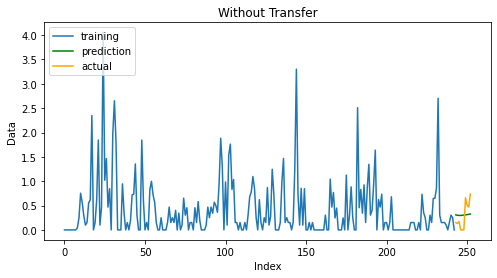

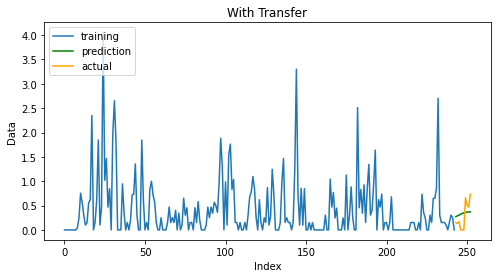

******Training on Repo ID: 29979177 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0069
Epoch 2/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0069
Epoch 3/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0069
Epoch 4/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0068
Epoch 5/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0068
Epoch 6/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0068
Epoch 7/10
173/173 [==============================] - 5s 29ms/step - loss: 0.0068
Epoch 8/10
173/173 [==============================] - 5s 29ms/step - loss: 0.0068
Epoch 9/10
173/173 [==============================] - 5s 29ms/step - loss: 0.0068
Epoch 10/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0068


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [=============

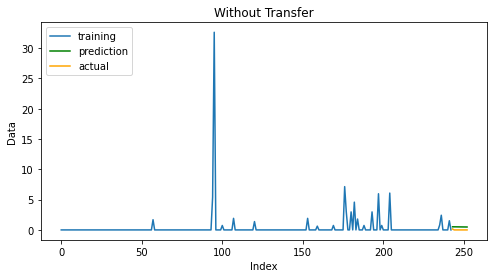

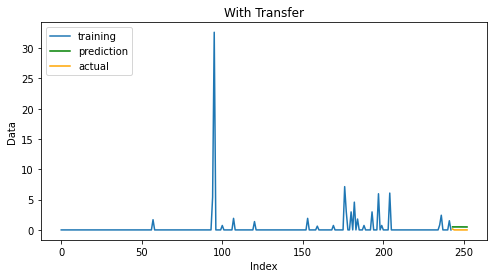

******Training on Repo ID: 52028643 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0327
Epoch 2/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0311
Epoch 3/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0311
Epoch 4/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0311
Epoch 5/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0311
Epoch 6/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0311
Epoch 7/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0310
Epoch 8/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0310
Epoch 9/10
173/173 [==============================] - 7s 43ms/step - loss: 0.0310
Epoch 10/10
173/173 [==============================] - 6s 34ms/step - loss: 0.0310


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [=============

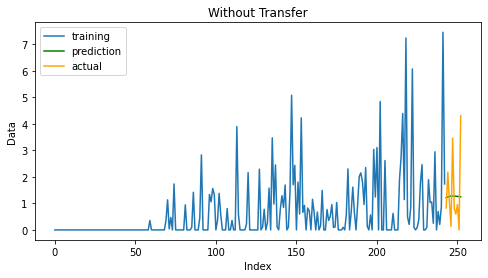

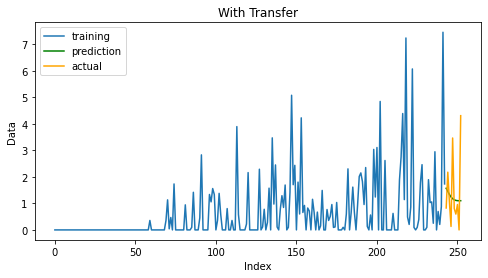

******Training on Repo ID: 159539290 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0033
Epoch 2/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0033
Epoch 3/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0033
Epoch 4/10
173/173 [==============================] - 5s 29ms/step - loss: 0.0033
Epoch 5/10
173/173 [==============================] - 5s 29ms/step - loss: 0.0033
Epoch 6/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0033
Epoch 7/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0033
Epoch 8/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0033
Epoch 9/10
173/173 [==============================] - 5s 29ms/step - loss: 0.0033
Epoch 10/10
173/173 [==============================] - 5s 28ms/step - loss: 0.0033


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [============

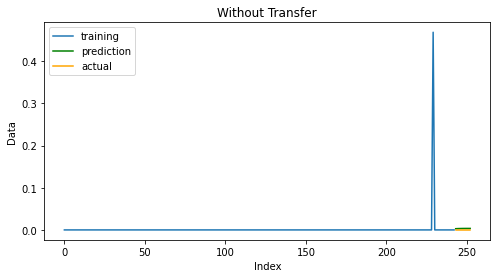

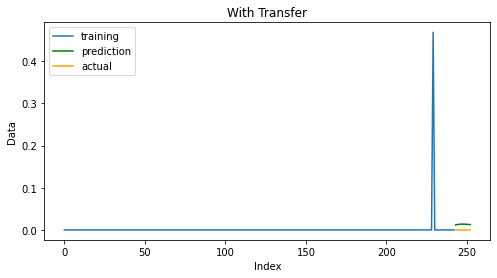

******Training on Repo ID: 20028272 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0037
Epoch 2/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0036
Epoch 3/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0036
Epoch 4/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0036
Epoch 5/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0035
Epoch 6/10
173/173 [==============================] - 5s 29ms/step - loss: 0.0035
Epoch 7/10
173/173 [==============================] - 5s 29ms/step - loss: 0.0035
Epoch 8/10
173/173 [==============================] - 5s 29ms/step - loss: 0.0035
Epoch 9/10
173/173 [==============================] - 5s 29ms/step - loss: 0.0035
Epoch 10/10
173/173 [==============================] - 5s 29ms/step - loss: 0.0035


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [=============

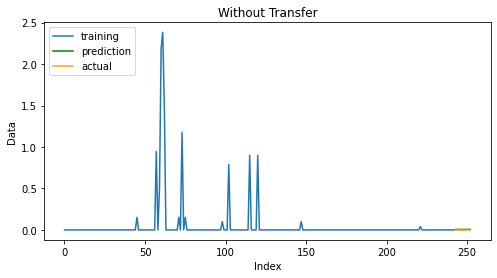

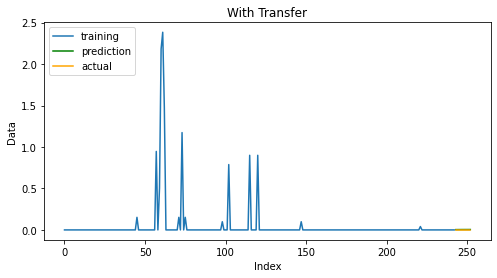

******Training on Repo ID: 143950 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0064
Epoch 2/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0059
Epoch 3/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0059
Epoch 4/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0058
Epoch 5/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0058
Epoch 6/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0058
Epoch 7/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0057
Epoch 8/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0057
Epoch 9/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0056
Epoch 10/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0056


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [===============

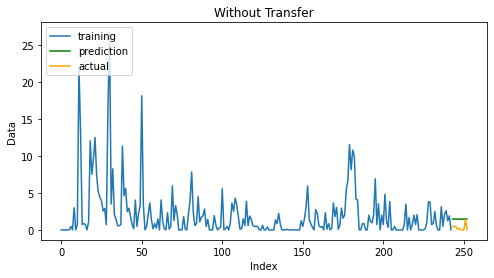

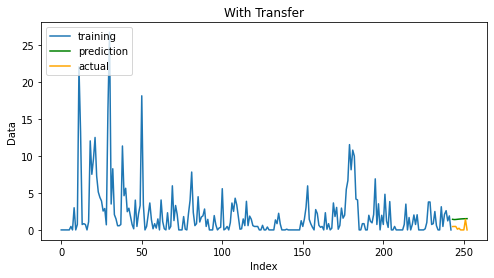

******Training on Repo ID: 33679984 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0358
Epoch 2/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0345
Epoch 3/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0345
Epoch 4/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0345
Epoch 5/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0344
Epoch 6/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0344
Epoch 7/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0344
Epoch 8/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0344
Epoch 9/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0344
Epoch 10/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0344


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [=============

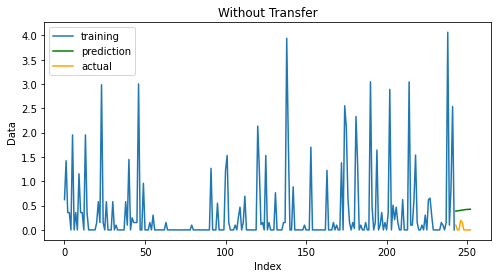

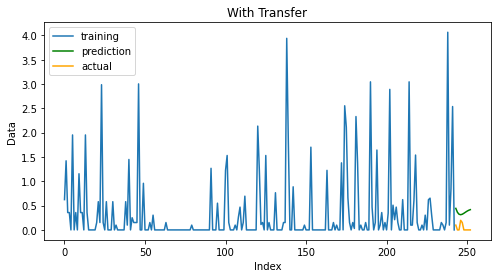

******Training on Repo ID: 169601732 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0097
Epoch 2/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0096
Epoch 3/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0094
Epoch 4/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0093
Epoch 5/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0092
Epoch 6/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0092
Epoch 7/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0091
Epoch 8/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0091
Epoch 9/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0090
Epoch 10/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0090


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [============

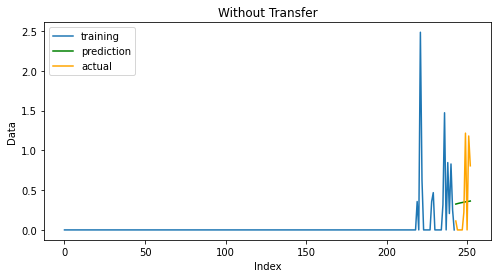

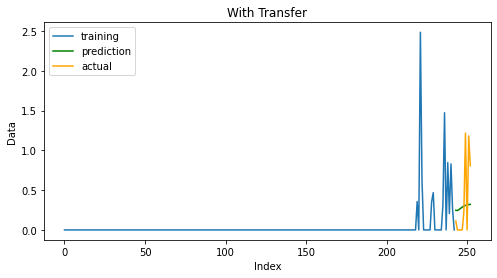

******Training on Repo ID: 197049571 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0066
Epoch 2/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0070
Epoch 3/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0069
Epoch 4/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0068
Epoch 5/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0067
Epoch 6/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0067
Epoch 7/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0066
Epoch 8/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0066
Epoch 9/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0066
Epoch 10/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0066


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [============

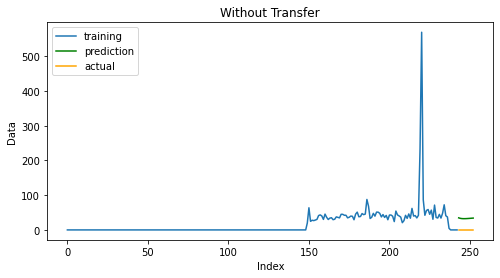

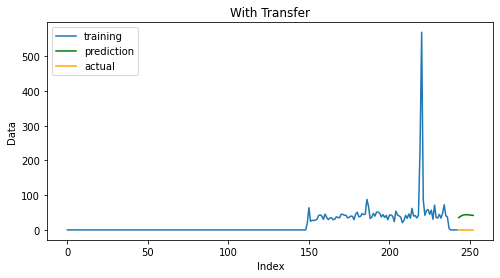

******Training on Repo ID: 4629960 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0021
Epoch 2/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0021
Epoch 3/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0021
Epoch 4/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0021
Epoch 5/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0020
Epoch 6/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0020
Epoch 7/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0020
Epoch 8/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0020
Epoch 9/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0020
Epoch 10/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0020


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [==============

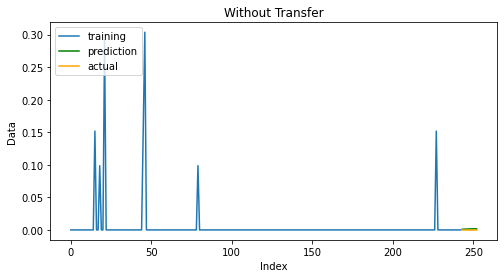

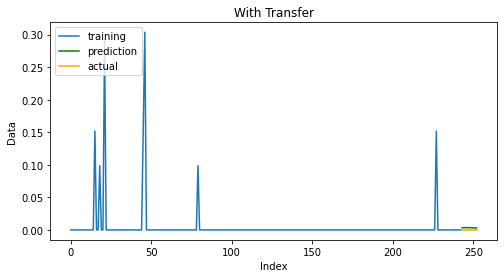

******Training on Repo ID: 19244865 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0335
Epoch 2/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0289
Epoch 3/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0284
Epoch 4/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0280
Epoch 5/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0277
Epoch 6/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0274
Epoch 7/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0271
Epoch 8/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0269
Epoch 9/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0267
Epoch 10/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0265


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [=============

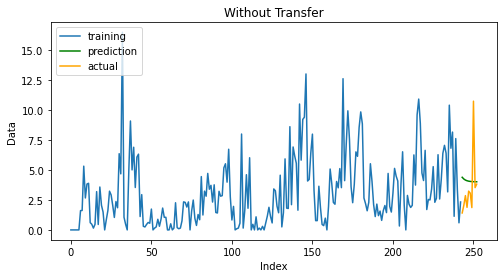

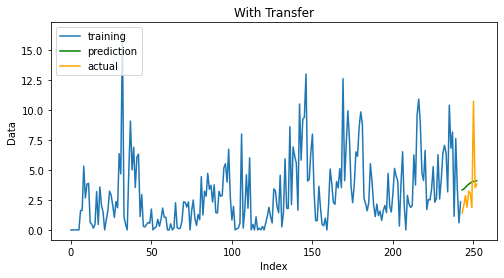

******Training on Repo ID: 52027975 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0291
Epoch 2/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0257
Epoch 3/10
173/173 [==============================] - 5s 29ms/step - loss: 0.0255
Epoch 4/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0254
Epoch 5/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0253
Epoch 6/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0253
Epoch 7/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0252
Epoch 8/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0252
Epoch 9/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0252
Epoch 10/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0251


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [=============

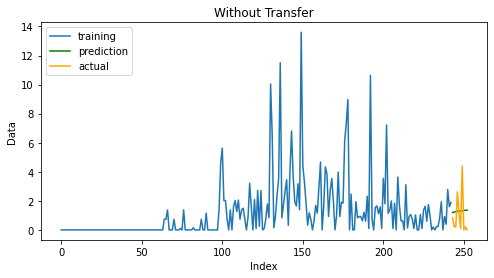

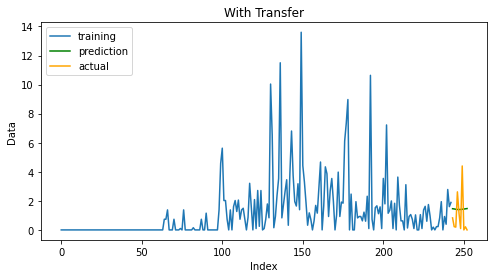

******Training on Repo ID: 173968989 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0067
Epoch 2/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0067
Epoch 3/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0067
Epoch 4/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0067
Epoch 5/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0067
Epoch 6/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0067
Epoch 7/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0067
Epoch 8/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0067
Epoch 9/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0067
Epoch 10/10
173/173 [==============================] - 5s 28ms/step - loss: 0.0067


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [============

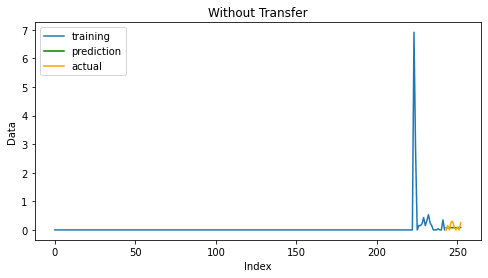

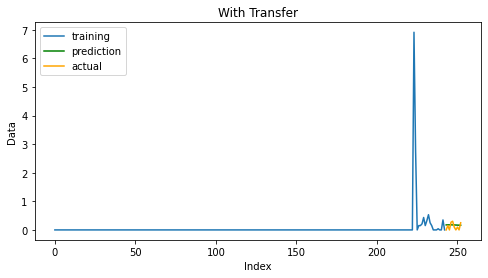

******Training on Repo ID: 5812445 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 5s 31ms/step - loss: 3.2634e-04
Epoch 2/10
173/173 [==============================] - 5s 30ms/step - loss: 3.2696e-04
Epoch 3/10
173/173 [==============================] - 5s 31ms/step - loss: 3.2632e-04
Epoch 4/10
173/173 [==============================] - 5s 31ms/step - loss: 3.2564e-04
Epoch 5/10
173/173 [==============================] - 5s 32ms/step - loss: 3.2499e-04
Epoch 6/10
173/173 [==============================] - 5s 31ms/step - loss: 3.2440e-04
Epoch 7/10
173/173 [==============================] - 6s 32ms/step - loss: 3.2389e-04
Epoch 8/10
173/173 [==============================] - 5s 31ms/step - loss: 3.2344e-04
Epoch 9/10
173/173 [==============================] - 5s 31ms/step - loss: 3.2302e-04
Epoch 10/10
173/173 [==============================] - 5s 31ms/step - loss: 3.2265e-04


*** Fitting a model with knowledge transfe

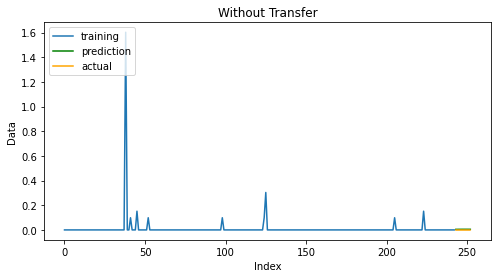

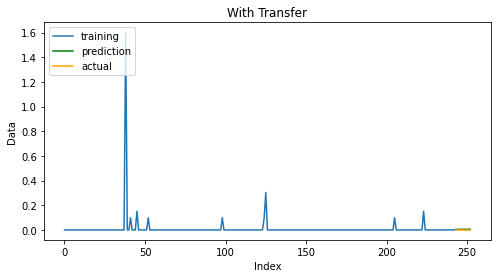

******Training on Repo ID: 309009 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0120
Epoch 2/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0094
Epoch 3/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0094
Epoch 4/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0093
Epoch 5/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0093
Epoch 6/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0093
Epoch 7/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0093
Epoch 8/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0093
Epoch 9/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0093
Epoch 10/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0093


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [===============

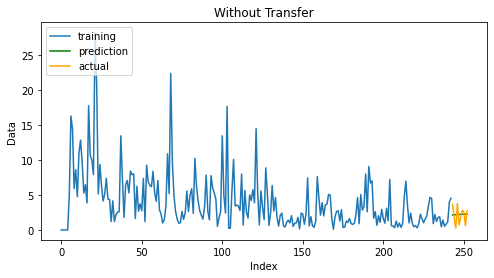

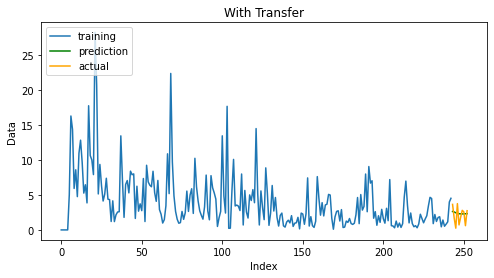

******Training on Repo ID: 17443202 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0350
Epoch 2/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0322
Epoch 3/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0320
Epoch 4/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0319
Epoch 5/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0319
Epoch 6/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0318
Epoch 7/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0317
Epoch 8/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0316
Epoch 9/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0316
Epoch 10/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0315


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [=============

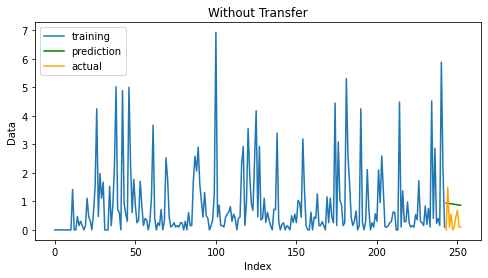

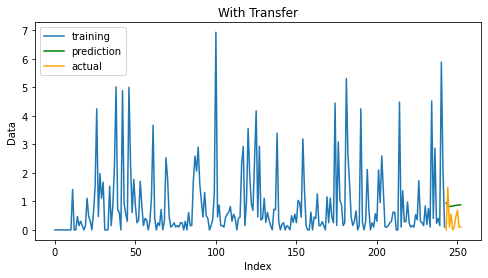

******Training on Repo ID: 108051 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0288
Epoch 2/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0207
Epoch 3/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0205
Epoch 4/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0203
Epoch 5/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0202
Epoch 6/10
173/173 [==============================] - 5s 29ms/step - loss: 0.0200
Epoch 7/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0199
Epoch 8/10
173/173 [==============================] - 5s 29ms/step - loss: 0.0198
Epoch 9/10
173/173 [==============================] - 5s 29ms/step - loss: 0.0197
Epoch 10/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0196


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [===============

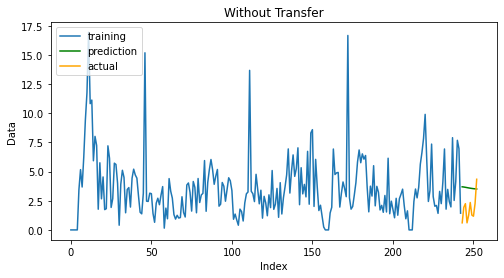

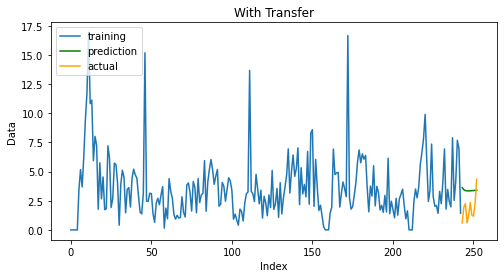

******Training on Repo ID: 10223615 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0138
Epoch 2/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0118
Epoch 3/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0116
Epoch 4/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0115
Epoch 5/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0113
Epoch 6/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0112
Epoch 7/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0111
Epoch 8/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0110
Epoch 9/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0109
Epoch 10/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0108


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [=============

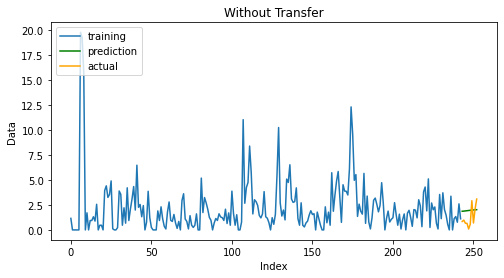

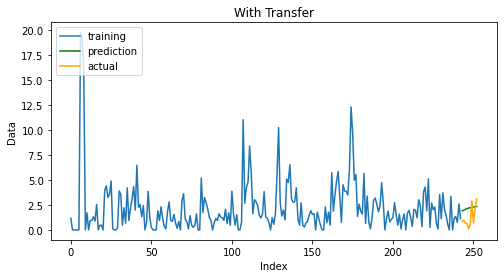

******Training on Repo ID: 81355383 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0172
Epoch 2/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0158
Epoch 3/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0152
Epoch 4/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0149
Epoch 5/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0147
Epoch 6/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0146
Epoch 7/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0145
Epoch 8/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0144
Epoch 9/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0143
Epoch 10/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0143


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [=============

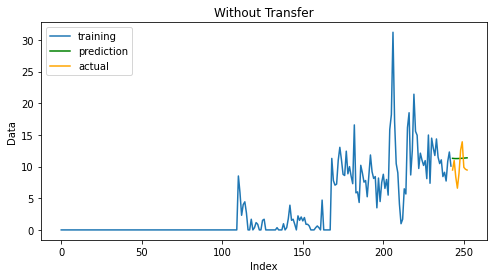

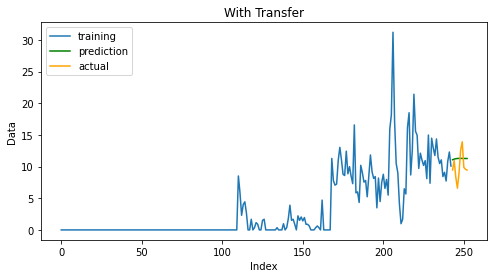

******Training on Repo ID: 11151771 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0070
Epoch 2/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0066
Epoch 3/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0066
Epoch 4/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0066
Epoch 5/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0066
Epoch 6/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0066
Epoch 7/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0066
Epoch 8/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0066
Epoch 9/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0065
Epoch 10/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0065


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [=============

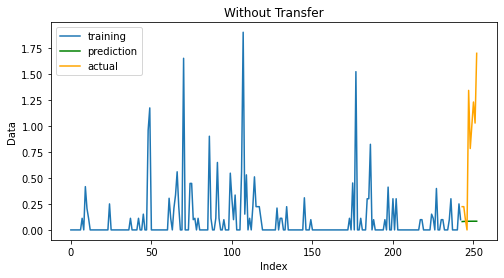

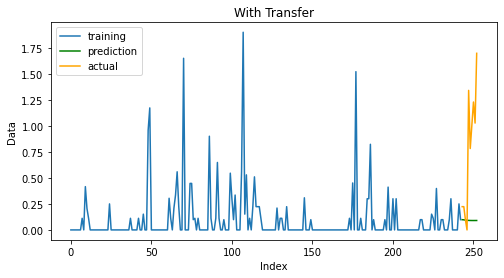

******Training on Repo ID: 184148355 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0020
Epoch 2/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0020
Epoch 3/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0020
Epoch 4/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0019
Epoch 5/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0019
Epoch 6/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0018
Epoch 7/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0018
Epoch 8/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0018
Epoch 9/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0018
Epoch 10/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0018


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [============

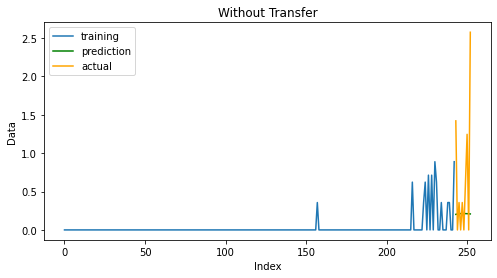

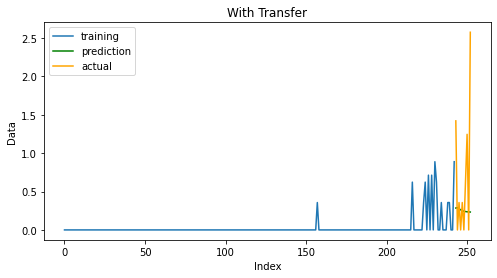

******Training on Repo ID: 30724109 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0139
Epoch 2/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0130
Epoch 3/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0125
Epoch 4/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0122
Epoch 5/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0119
Epoch 6/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0117
Epoch 7/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0116
Epoch 8/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0114
Epoch 9/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0113
Epoch 10/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0113


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [=============

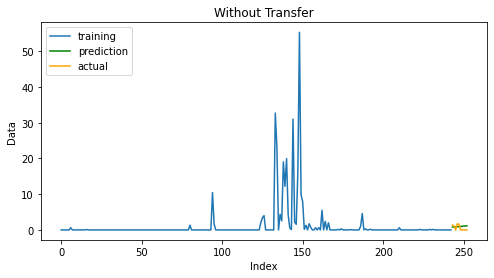

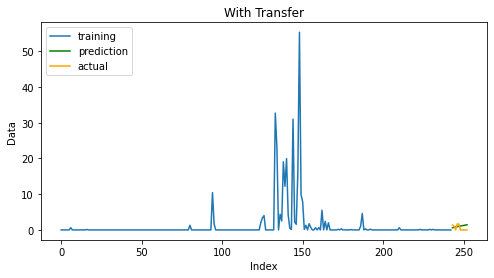

******Training on Repo ID: 60209452 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0133
Epoch 2/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0128
Epoch 3/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0127
Epoch 4/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0127
Epoch 5/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0127
Epoch 6/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0127
Epoch 7/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0126
Epoch 8/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0126
Epoch 9/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0126
Epoch 10/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0126


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [=============

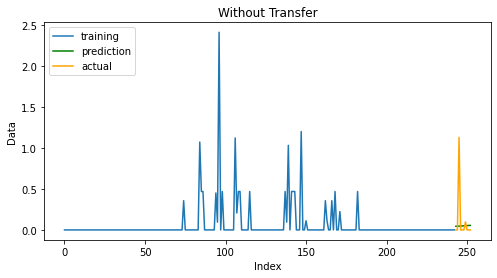

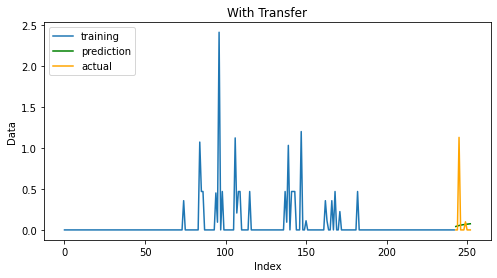

******Training on Repo ID: 8978081 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0399
Epoch 2/10
173/173 [==============================] - 6s 34ms/step - loss: 0.0276
Epoch 3/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0261
Epoch 4/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0256
Epoch 5/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0253
Epoch 6/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0250
Epoch 7/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0248
Epoch 8/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0247
Epoch 9/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0245
Epoch 10/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0244


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [==============

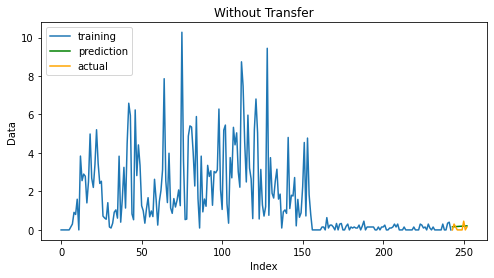

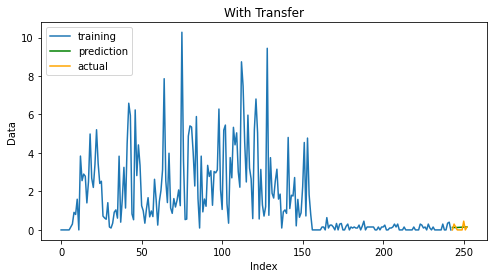

******Training on Repo ID: 29979115 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0107
Epoch 2/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0096
Epoch 3/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0090
Epoch 4/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0087
Epoch 5/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0085
Epoch 6/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0083
Epoch 7/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0082
Epoch 8/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0081
Epoch 9/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0081
Epoch 10/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0080


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [=============

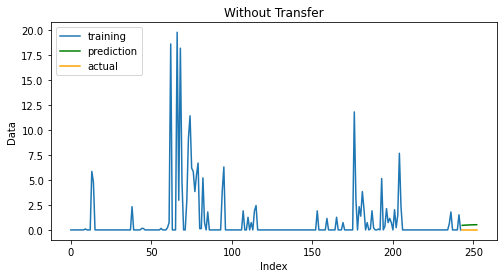

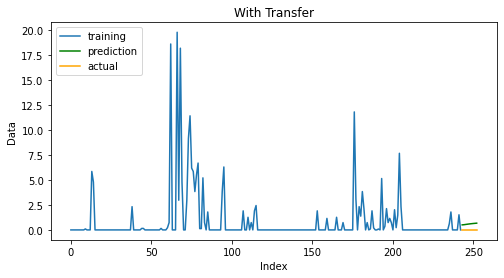

******Training on Repo ID: 33628160 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0174
Epoch 2/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0165
Epoch 3/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0164
Epoch 4/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0163
Epoch 5/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0162
Epoch 6/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0162
Epoch 7/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0162
Epoch 8/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0161
Epoch 9/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0161
Epoch 10/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0161


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [=============

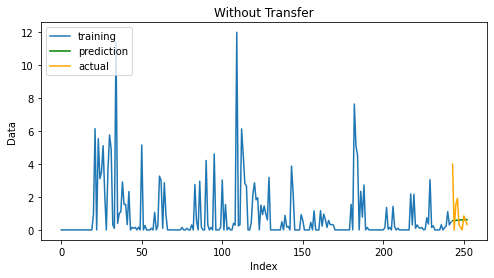

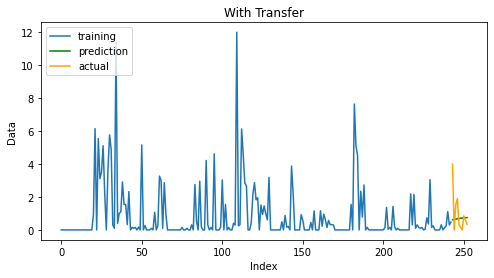

******Training on Repo ID: 63879166 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0153
Epoch 2/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0148
Epoch 3/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0147
Epoch 4/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0147
Epoch 5/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0146
Epoch 6/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0146
Epoch 7/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0145
Epoch 8/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0145
Epoch 9/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0145
Epoch 10/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0144


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [=============

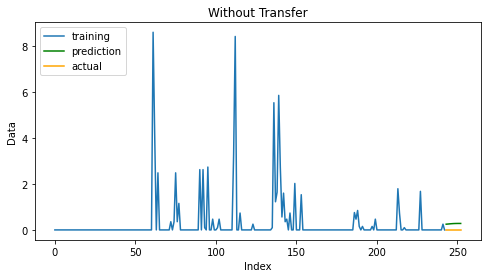

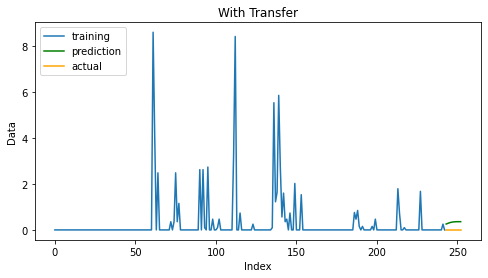

******Training on Repo ID: 165114031 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0034
Epoch 2/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0035
Epoch 3/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0034
Epoch 4/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0033
Epoch 5/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0032
Epoch 6/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0032
Epoch 7/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0031
Epoch 8/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0031
Epoch 9/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0031
Epoch 10/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0030


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [============

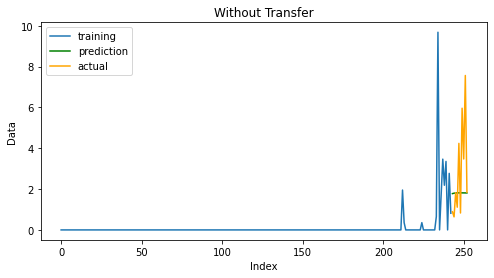

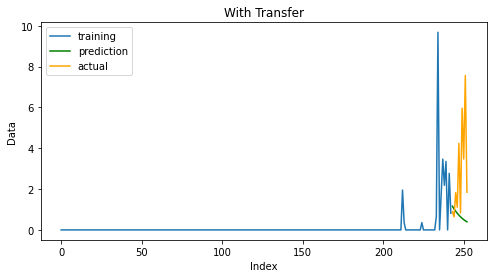

******Training on Repo ID: 114668687 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 6s 34ms/step - loss: 0.0080
Epoch 2/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0079
Epoch 3/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0079
Epoch 4/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0079
Epoch 5/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0079
Epoch 6/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0079
Epoch 7/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0079
Epoch 8/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0079
Epoch 9/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0079
Epoch 10/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0078


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [============

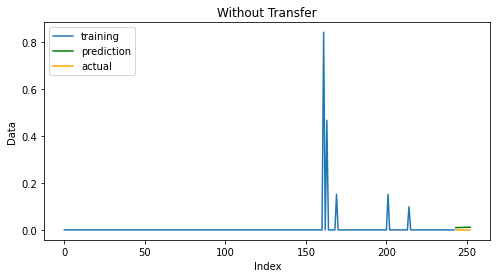

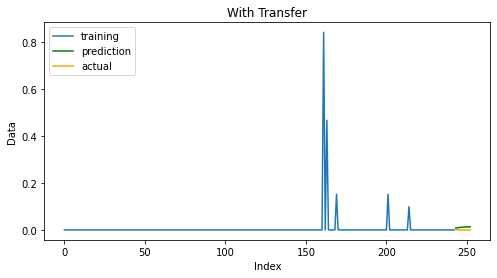

******Training on Repo ID: 163867485 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0275
Epoch 2/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0205
Epoch 3/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0159
Epoch 4/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0136
Epoch 5/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0130
Epoch 6/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0128
Epoch 7/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0128
Epoch 8/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0127
Epoch 9/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0127
Epoch 10/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0127


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [============

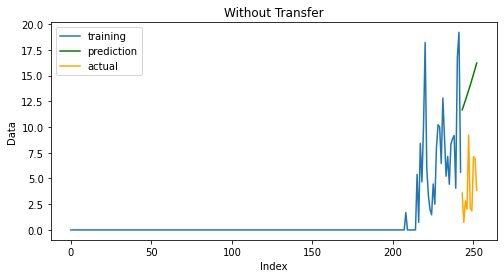

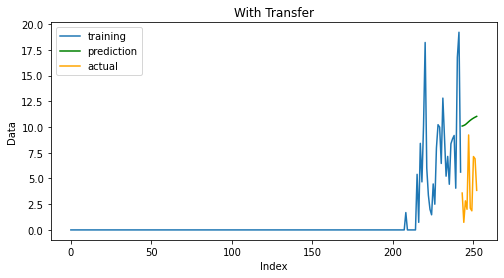

******Training on Repo ID: 58073483 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0253
Epoch 2/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0234
Epoch 3/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0232
Epoch 4/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0230
Epoch 5/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0229
Epoch 6/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0227
Epoch 7/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0226
Epoch 8/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0225
Epoch 9/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0224
Epoch 10/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0223


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [=============

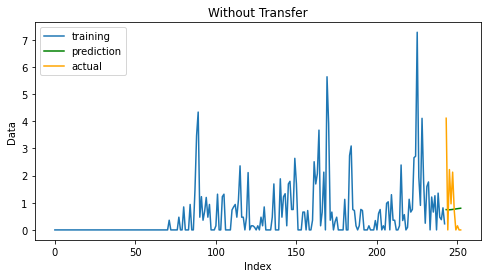

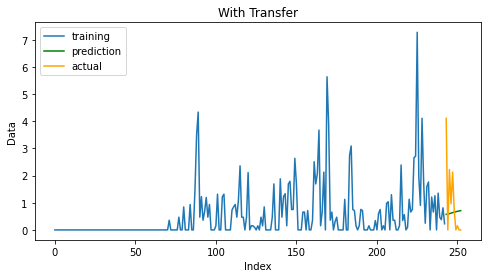

******Training on Repo ID: 856703 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0121
Epoch 2/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0068
Epoch 3/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0063
Epoch 4/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0062
Epoch 5/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0061
Epoch 6/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0060
Epoch 7/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0060
Epoch 8/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0060
Epoch 9/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0059
Epoch 10/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0059


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [===============

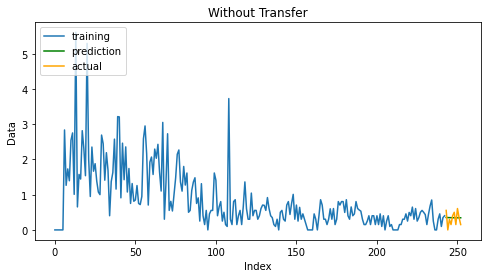

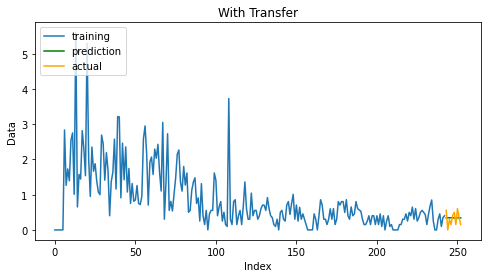

******Training on Repo ID: 151294653 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0365
Epoch 2/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0272
Epoch 3/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0250
Epoch 4/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0239
Epoch 5/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0233
Epoch 6/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0228
Epoch 7/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0225
Epoch 8/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0222
Epoch 9/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0220
Epoch 10/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0218


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [============

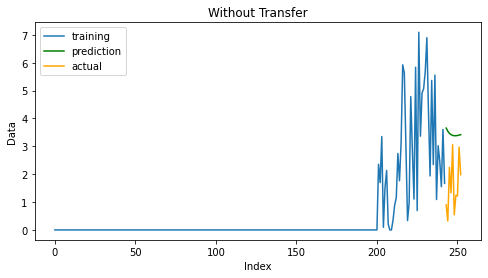

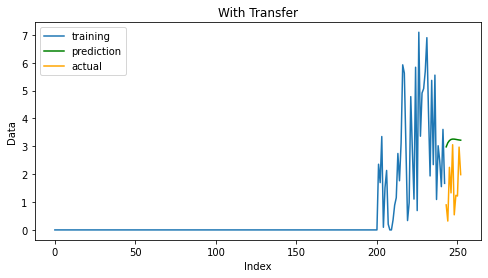

******Training on Repo ID: 143887688 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0142
Epoch 2/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0126
Epoch 3/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0113
Epoch 4/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0107
Epoch 5/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0104
Epoch 6/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0103
Epoch 7/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0103
Epoch 8/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0102
Epoch 9/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0102
Epoch 10/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0102


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [============

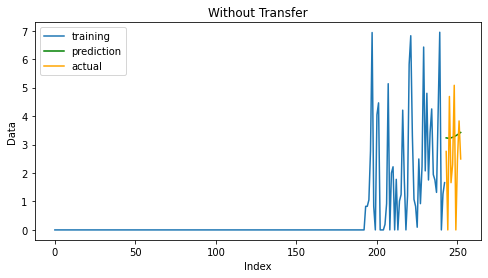

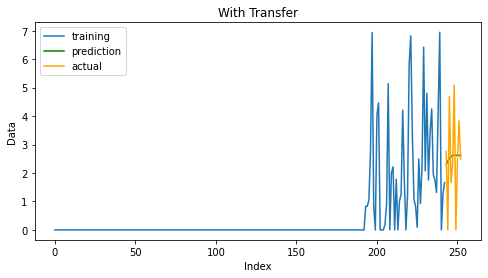

******Training on Repo ID: 18531879 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0140
Epoch 2/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0139
Epoch 3/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0139
Epoch 4/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0138
Epoch 5/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0138
Epoch 6/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0138
Epoch 7/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0138
Epoch 8/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0138
Epoch 9/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0138
Epoch 10/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0138


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [=============

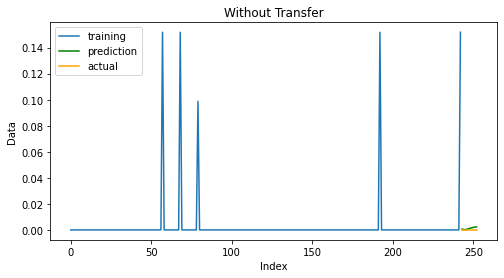

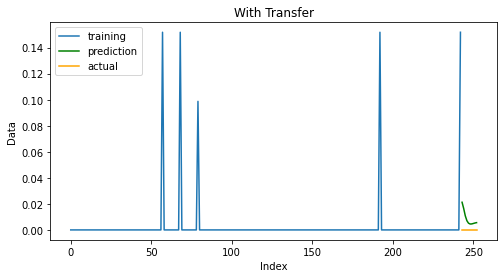

******Training on Repo ID: 3034894 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 5s 29ms/step - loss: 0.0162
Epoch 2/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0159
Epoch 3/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0158
Epoch 4/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0158
Epoch 5/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0158
Epoch 6/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0157
Epoch 7/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0157
Epoch 8/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0157
Epoch 9/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0157
Epoch 10/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0157


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [==============

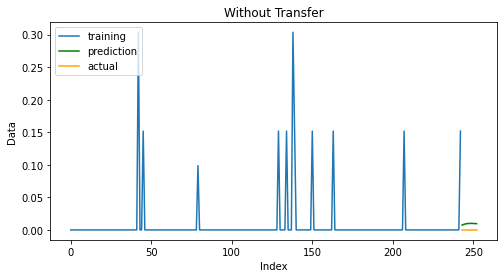

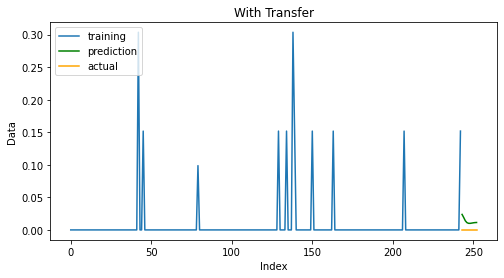

******Training on Repo ID: 122675902 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0153
Epoch 2/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0147
Epoch 3/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0147
Epoch 4/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0146
Epoch 5/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0146
Epoch 6/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0146
Epoch 7/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0146
Epoch 8/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0146
Epoch 9/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0146
Epoch 10/10
173/173 [==============================] - 5s 29ms/step - loss: 0.0146


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [============

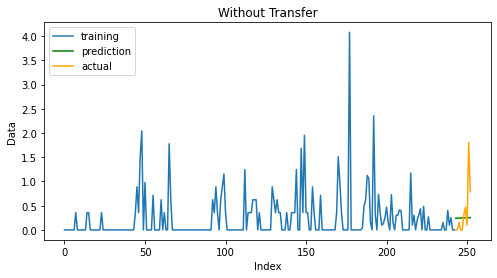

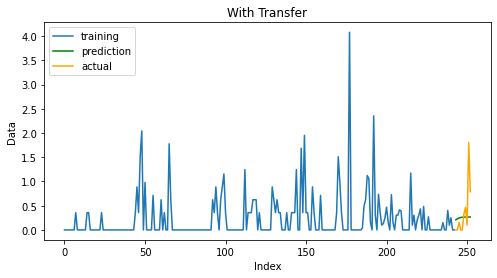

******Training on Repo ID: 95679812 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0136
Epoch 2/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0134
Epoch 3/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0133
Epoch 4/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0132
Epoch 5/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0131
Epoch 6/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0131
Epoch 7/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0130
Epoch 8/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0130
Epoch 9/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0129
Epoch 10/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0129


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [=============

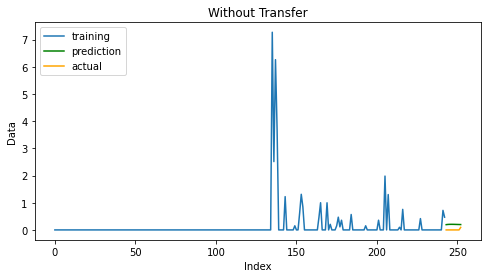

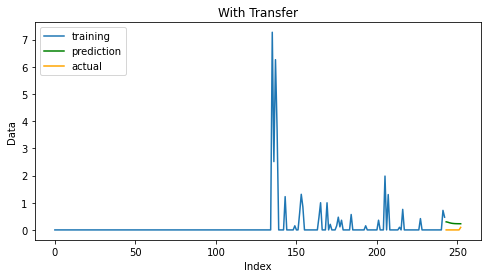

******Training on Repo ID: 55437297 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0130
Epoch 2/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0128
Epoch 3/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0128
Epoch 4/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0128
Epoch 5/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0128
Epoch 6/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0127
Epoch 7/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0127
Epoch 8/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0127
Epoch 9/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0127
Epoch 10/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0127


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [=============

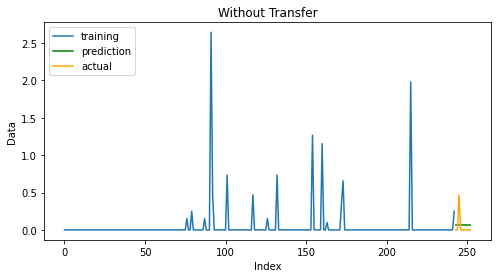

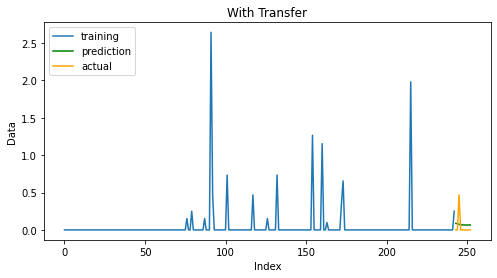

******Training on Repo ID: 159728715 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0072
Epoch 2/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0072
Epoch 3/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0072
Epoch 4/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0072
Epoch 5/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0072
Epoch 6/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0072
Epoch 7/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0072
Epoch 8/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0072
Epoch 9/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0072
Epoch 10/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0072


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [============

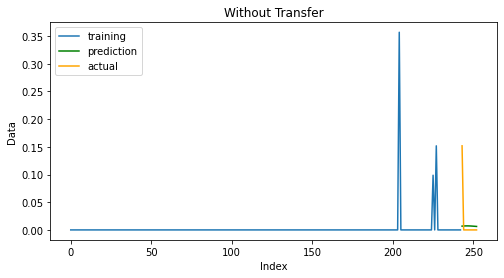

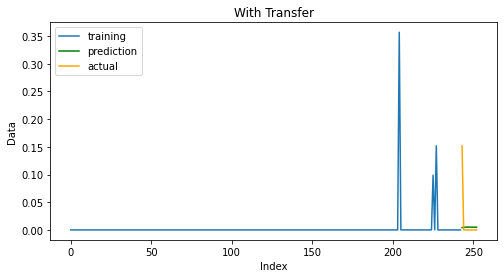

******Training on Repo ID: 136240779 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0207
Epoch 2/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0194
Epoch 3/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0187
Epoch 4/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0182
Epoch 5/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0178
Epoch 6/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0175
Epoch 7/10
173/173 [==============================] - 5s 29ms/step - loss: 0.0171
Epoch 8/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0169
Epoch 9/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0166
Epoch 10/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0164


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [============

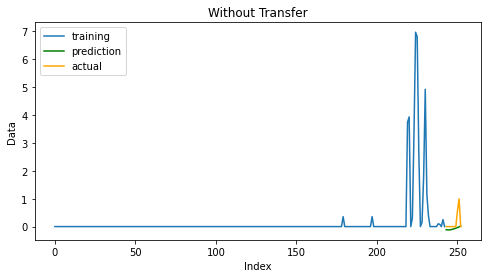

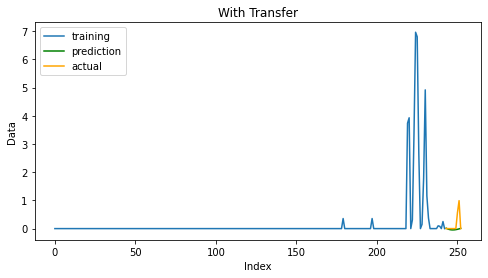

******Training on Repo ID: 1035659 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0090
Epoch 2/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0082
Epoch 3/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0080
Epoch 4/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0079
Epoch 5/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0078
Epoch 6/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0078
Epoch 7/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0077
Epoch 8/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0077
Epoch 9/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0077
Epoch 10/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0077


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [==============

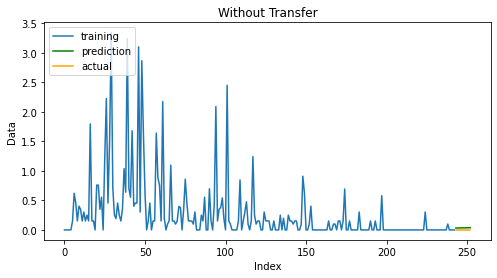

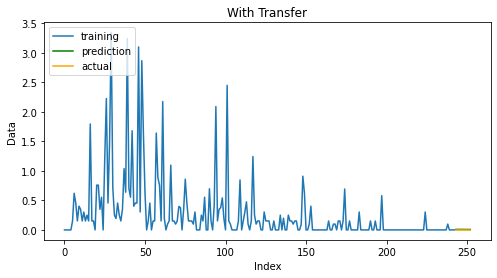

******Training on Repo ID: 104237 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0187
Epoch 2/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0185
Epoch 3/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0185
Epoch 4/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0185
Epoch 5/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0185
Epoch 6/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0185
Epoch 7/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0185
Epoch 8/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0185
Epoch 9/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0185
Epoch 10/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0185


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [===============

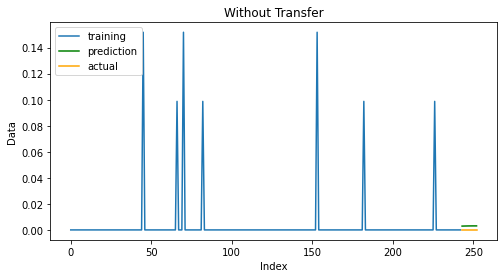

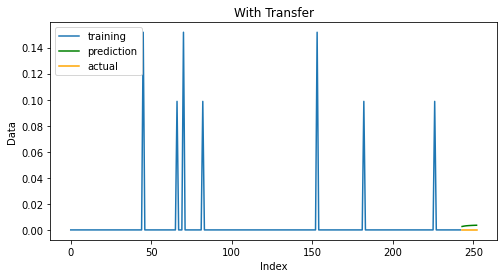

******Training on Repo ID: 100294206 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0023
Epoch 2/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0023
Epoch 3/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0023
Epoch 4/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0022
Epoch 5/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0022
Epoch 6/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0022
Epoch 7/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0022
Epoch 8/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0022
Epoch 9/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0022
Epoch 10/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0021


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [============

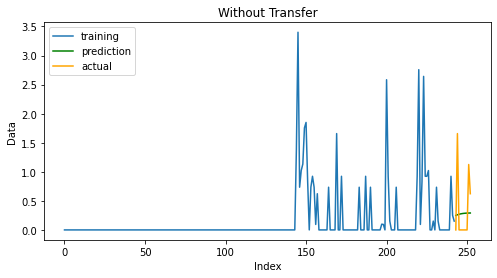

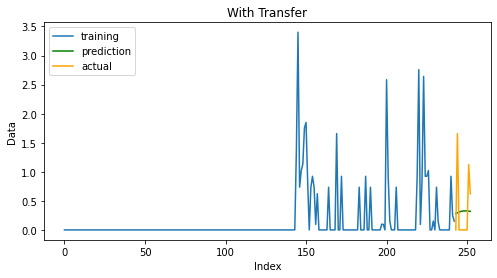

******Training on Repo ID: 123161718 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0049
Epoch 2/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0027
Epoch 3/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0024
Epoch 4/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0022
Epoch 5/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0021
Epoch 6/10
173/173 [==============================] - 5s 29ms/step - loss: 0.0021
Epoch 7/10
173/173 [==============================] - 5s 29ms/step - loss: 0.0020
Epoch 8/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0020
Epoch 9/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0020
Epoch 10/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0020


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [============

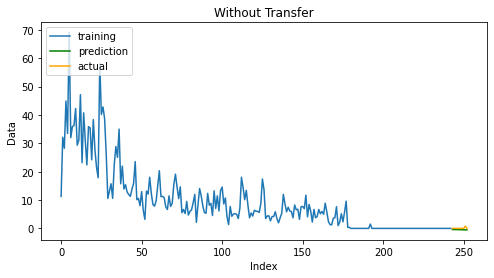

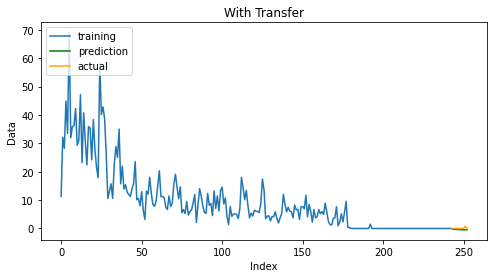

******Training on Repo ID: 223234695 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 6s 37ms/step - loss: 0.0000e+00
Epoch 2/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0000e+00
Epoch 3/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0000e+00
Epoch 4/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0000e+00
Epoch 5/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0000e+00
Epoch 6/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0000e+00
Epoch 7/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0000e+00
Epoch 8/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0000e+00
Epoch 9/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0000e+00
Epoch 10/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0000e+00


*** Fitting a model with knowledge trans

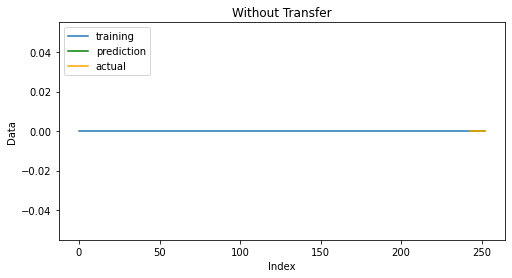

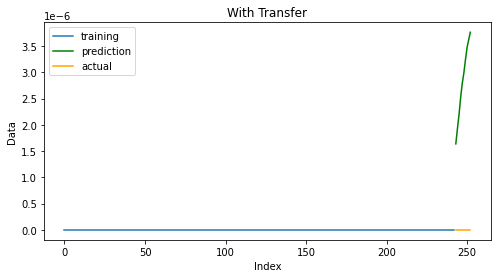

******Training on Repo ID: 63879003 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0195
Epoch 2/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0191
Epoch 3/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0190
Epoch 4/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0190
Epoch 5/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0189
Epoch 6/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0189
Epoch 7/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0189
Epoch 8/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0189
Epoch 9/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0189
Epoch 10/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0188


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [=============

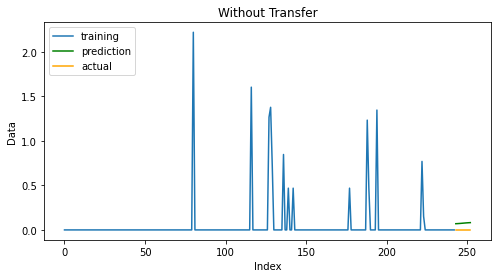

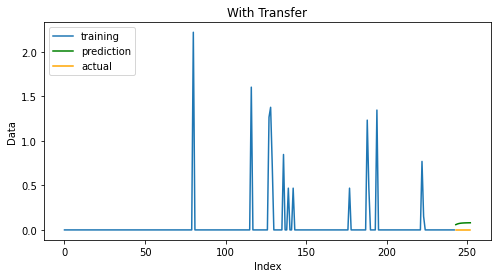

******Training on Repo ID: 39915471 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 5s 30ms/step - loss: 8.7612e-04
Epoch 2/10
173/173 [==============================] - 5s 31ms/step - loss: 8.1246e-04
Epoch 3/10
173/173 [==============================] - 5s 31ms/step - loss: 7.8325e-04
Epoch 4/10
173/173 [==============================] - 5s 31ms/step - loss: 7.6728e-04
Epoch 5/10
173/173 [==============================] - 6s 32ms/step - loss: 7.5813e-04
Epoch 6/10
173/173 [==============================] - 6s 33ms/step - loss: 7.5216e-04
Epoch 7/10
173/173 [==============================] - 5s 31ms/step - loss: 7.4779e-04
Epoch 8/10
173/173 [==============================] - 6s 32ms/step - loss: 7.4434e-04
Epoch 9/10
173/173 [==============================] - 5s 31ms/step - loss: 7.4150e-04
Epoch 10/10
173/173 [==============================] - 5s 29ms/step - loss: 7.3909e-04


*** Fitting a model with knowledge transf

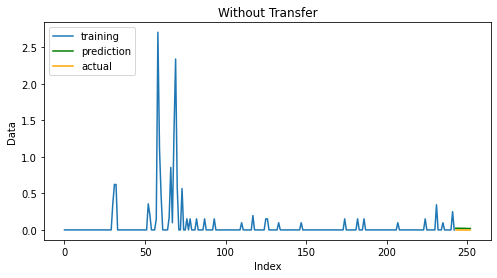

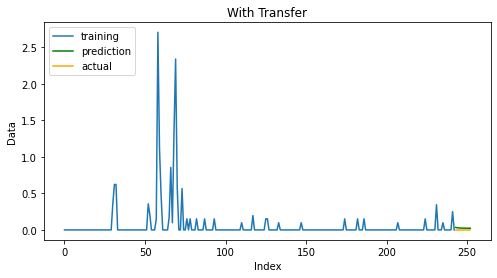

******Training on Repo ID: 147843 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0199
Epoch 2/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0180
Epoch 3/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0178
Epoch 4/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0177
Epoch 5/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0177
Epoch 6/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0177
Epoch 7/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0177
Epoch 8/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0177
Epoch 9/10
173/173 [==============================] - 5s 29ms/step - loss: 0.0177
Epoch 10/10
173/173 [==============================] - 5s 29ms/step - loss: 0.0177


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [===============

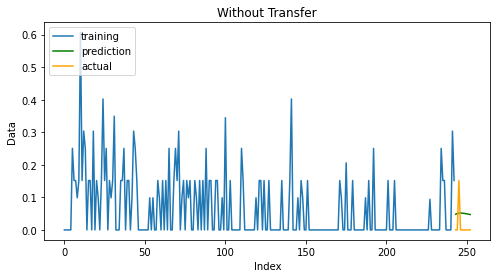

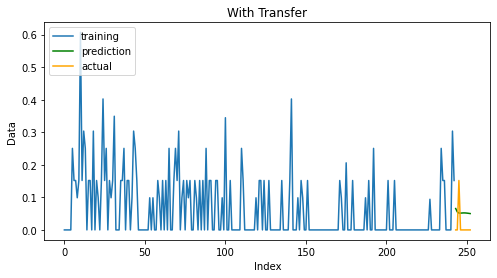

******Training on Repo ID: 1514767 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0069
Epoch 2/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0069
Epoch 3/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0069
Epoch 4/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0069
Epoch 5/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0069
Epoch 6/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0069
Epoch 7/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0069
Epoch 8/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0069
Epoch 9/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0069
Epoch 10/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0068


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [==============

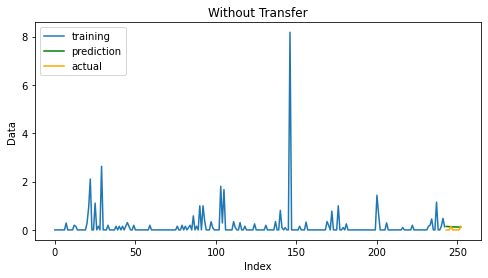

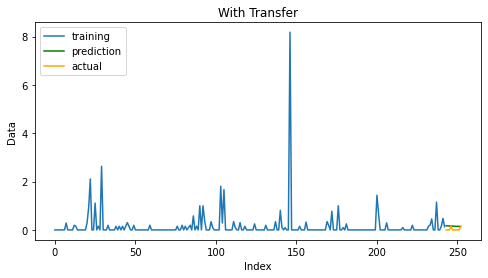

******Training on Repo ID: 618140 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0186
Epoch 2/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0170
Epoch 3/10
173/173 [==============================] - 8s 47ms/step - loss: 0.0168
Epoch 4/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0168
Epoch 5/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0168
Epoch 6/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0167
Epoch 7/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0167
Epoch 8/10
173/173 [==============================] - 6s 34ms/step - loss: 0.0167
Epoch 9/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0167
Epoch 10/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0167


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [===============

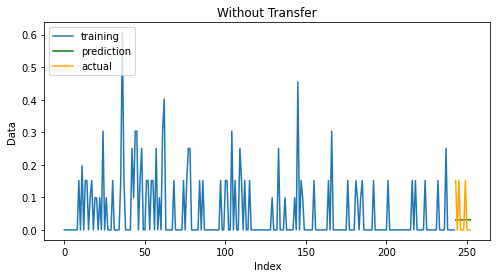

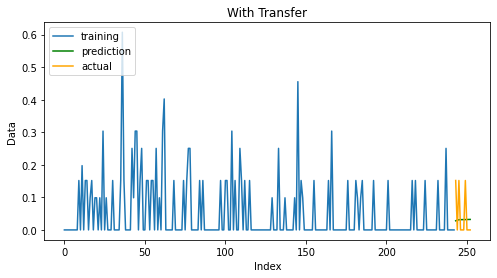

******Training on Repo ID: 3658431 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0341
Epoch 2/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0280
Epoch 3/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0278
Epoch 4/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0278
Epoch 5/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0277
Epoch 6/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0277
Epoch 7/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0277
Epoch 8/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0276
Epoch 9/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0276
Epoch 10/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0276


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [==============

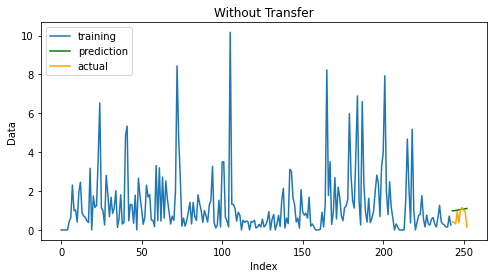

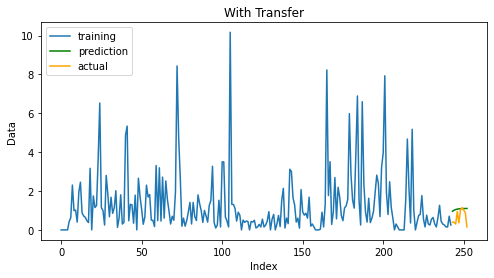

******Training on Repo ID: 27557391 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0208
Epoch 2/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0181
Epoch 3/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0180
Epoch 4/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0179
Epoch 5/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0178
Epoch 6/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0178
Epoch 7/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0177
Epoch 8/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0177
Epoch 9/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0177
Epoch 10/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0176


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [=============

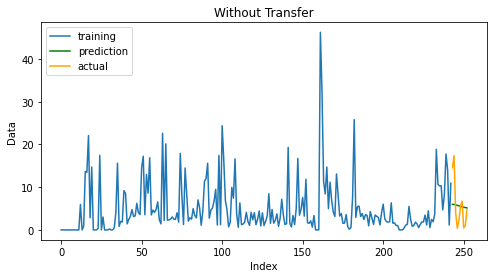

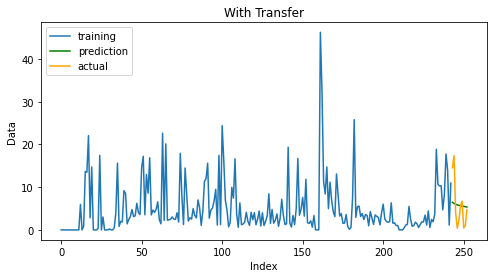

******Training on Repo ID: 151036861 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0063
Epoch 2/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0063
Epoch 3/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0063
Epoch 4/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0063
Epoch 5/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0063
Epoch 6/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0063
Epoch 7/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0063
Epoch 8/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0063
Epoch 9/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0063
Epoch 10/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0063


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [============

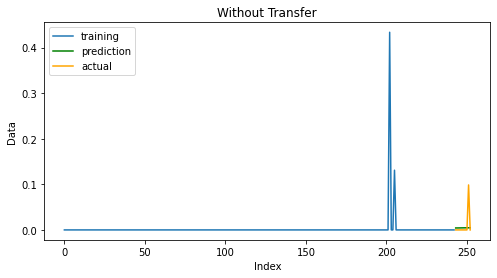

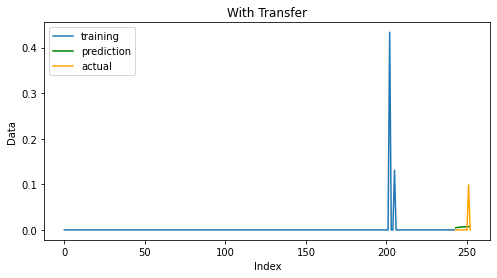

******Training on Repo ID: 52050228 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0093
Epoch 2/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0091
Epoch 3/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0090
Epoch 4/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0090
Epoch 5/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0090
Epoch 6/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0090
Epoch 7/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0090
Epoch 8/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0090
Epoch 9/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0090
Epoch 10/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0090


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [=============

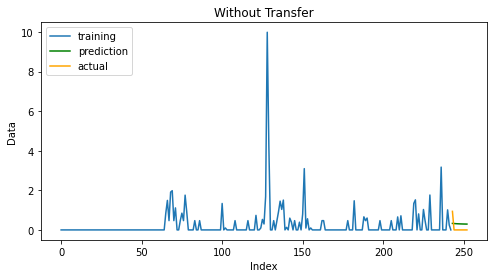

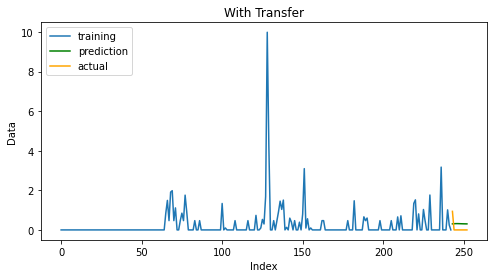

******Training on Repo ID: 22581566 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0081
Epoch 2/10
173/173 [==============================] - 6s 34ms/step - loss: 0.0080
Epoch 3/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0080
Epoch 4/10
173/173 [==============================] - 8s 46ms/step - loss: 0.0079
Epoch 5/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0079
Epoch 6/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0079
Epoch 7/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0079
Epoch 8/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0079
Epoch 9/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0079
Epoch 10/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0079


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [=============

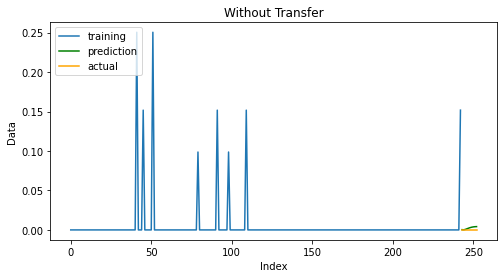

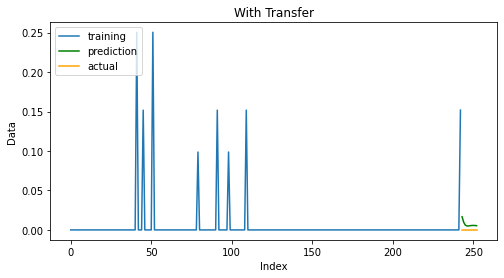

******Training on Repo ID: 232424739 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0201
Epoch 2/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0193
Epoch 3/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0185
Epoch 4/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0178
Epoch 5/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0170
Epoch 6/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0162
Epoch 7/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0154
Epoch 8/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0146
Epoch 9/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0139
Epoch 10/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0131


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [============

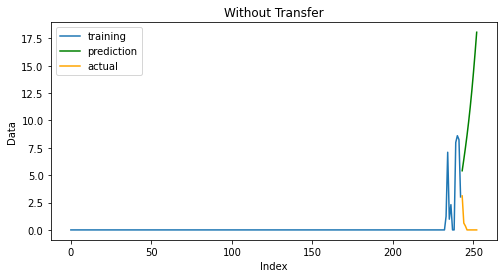

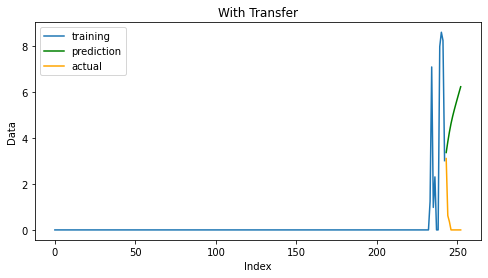

******Training on Repo ID: 27442261 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 6s 34ms/step - loss: 0.0154
Epoch 2/10
173/173 [==============================] - 6s 34ms/step - loss: 0.0134
Epoch 3/10
173/173 [==============================] - 6s 34ms/step - loss: 0.0124
Epoch 4/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0120
Epoch 5/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0118
Epoch 6/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0116
Epoch 7/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0115
Epoch 8/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0114
Epoch 9/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0114
Epoch 10/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0113


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [=============

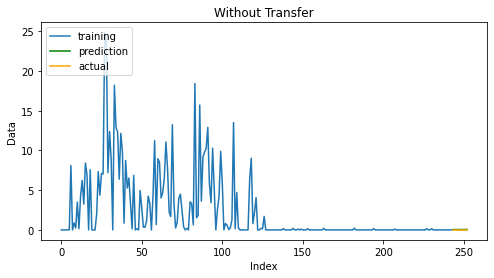

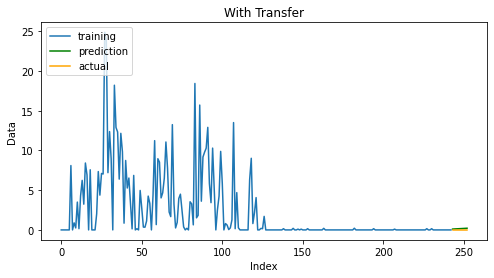

******Training on Repo ID: 29601834 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0327
Epoch 2/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0314
Epoch 3/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0312
Epoch 4/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0311
Epoch 5/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0309
Epoch 6/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0308
Epoch 7/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0307
Epoch 8/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0307
Epoch 9/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0306
Epoch 10/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0306


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [=============

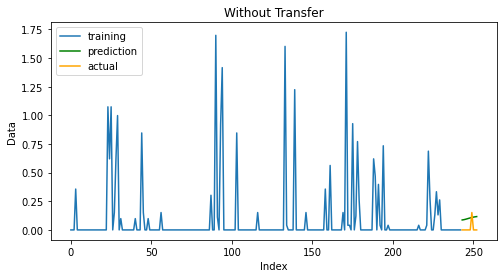

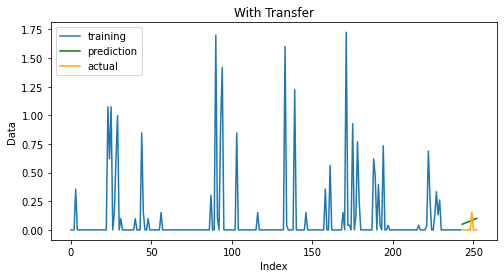

******Training on Repo ID: 2446718 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0412
Epoch 2/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0283
Epoch 3/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0279
Epoch 4/10
173/173 [==============================] - 5s 29ms/step - loss: 0.0277
Epoch 5/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0275
Epoch 6/10
173/173 [==============================] - 5s 29ms/step - loss: 0.0273
Epoch 7/10
173/173 [==============================] - 5s 29ms/step - loss: 0.0271
Epoch 8/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0270
Epoch 9/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0268
Epoch 10/10
173/173 [==============================] - 5s 29ms/step - loss: 0.0267


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [==============

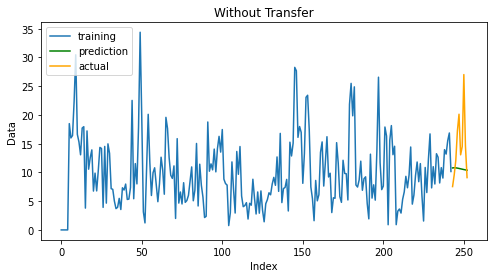

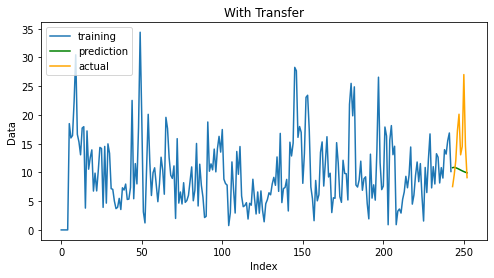

******Training on Repo ID: 169825932 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0108
Epoch 2/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0107
Epoch 3/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0107
Epoch 4/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0107
Epoch 5/10
173/173 [==============================] - 8s 44ms/step - loss: 0.0106
Epoch 6/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0106
Epoch 7/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0106
Epoch 8/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0105
Epoch 9/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0105
Epoch 10/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0105


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [============

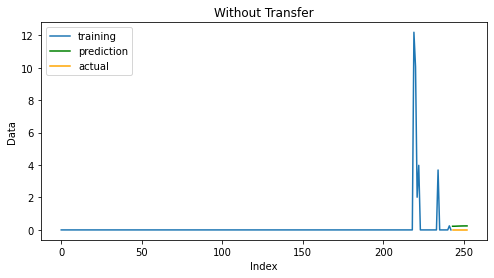

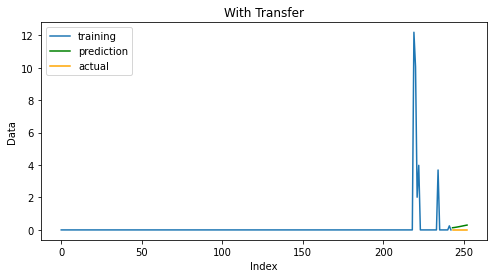

******Training on Repo ID: 55078765 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0247
Epoch 2/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0219
Epoch 3/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0216
Epoch 4/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0214
Epoch 5/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0212
Epoch 6/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0211
Epoch 7/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0210
Epoch 8/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0209
Epoch 9/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0209
Epoch 10/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0208


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [=============

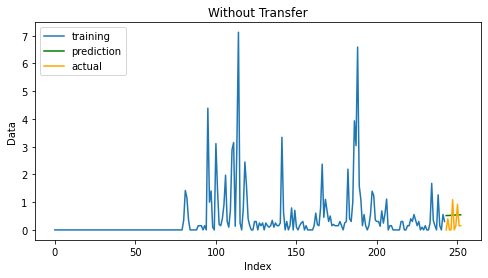

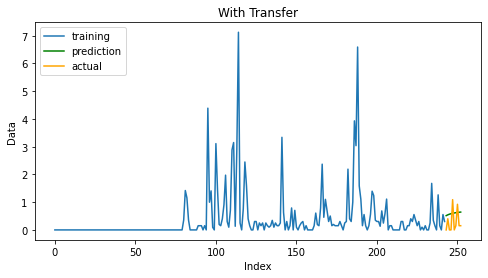

******Training on Repo ID: 125097486 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0101
Epoch 2/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0101
Epoch 3/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0100
Epoch 4/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0100
Epoch 5/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0100
Epoch 6/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0100
Epoch 7/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0100
Epoch 8/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0100
Epoch 9/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0100
Epoch 10/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0100


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [============

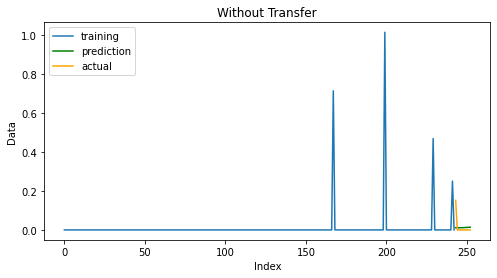

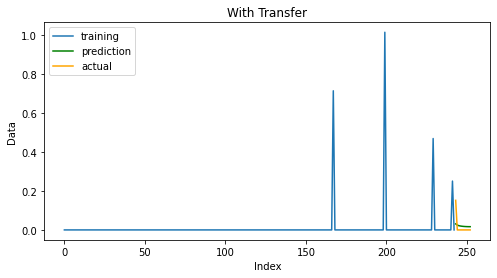

******Training on Repo ID: 194736160 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0016
Epoch 2/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0017
Epoch 3/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0016
Epoch 4/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0016
Epoch 5/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0016
Epoch 6/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0015
Epoch 7/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0015
Epoch 8/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0015
Epoch 9/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0015
Epoch 10/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0014


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [============

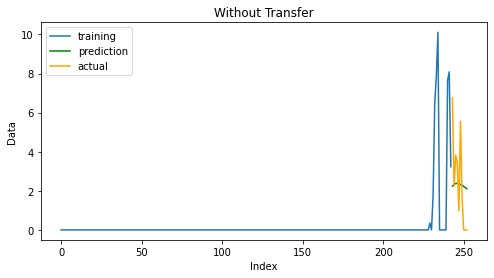

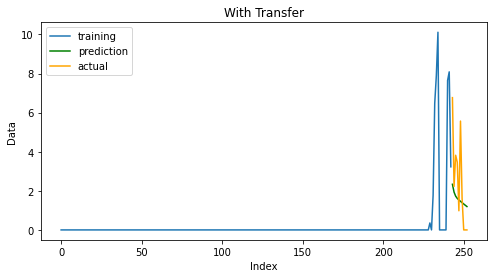

******Training on Repo ID: 14149824 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0138
Epoch 2/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0134
Epoch 3/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0133
Epoch 4/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0133
Epoch 5/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0132
Epoch 6/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0132
Epoch 7/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0131
Epoch 8/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0131
Epoch 9/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0130
Epoch 10/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0130


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [=============

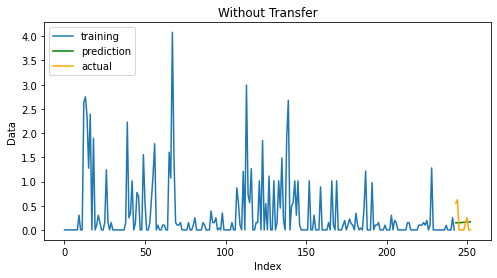

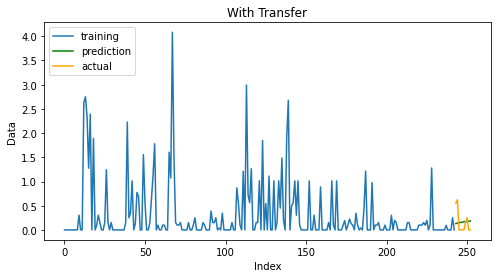

******Training on Repo ID: 206787415 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0000e+00
Epoch 2/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0000e+00
Epoch 3/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0000e+00
Epoch 4/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0000e+00
Epoch 5/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0000e+00
Epoch 6/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0000e+00
Epoch 7/10
173/173 [==============================] - 7s 43ms/step - loss: 0.0000e+00
Epoch 8/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0000e+00
Epoch 9/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0000e+00
Epoch 10/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0000e+00


*** Fitting a model with knowledge trans

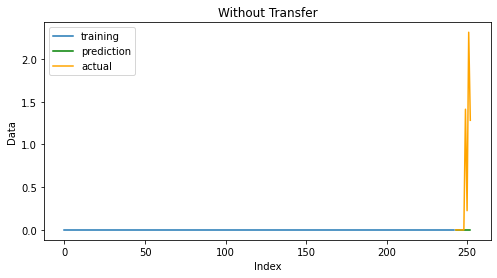

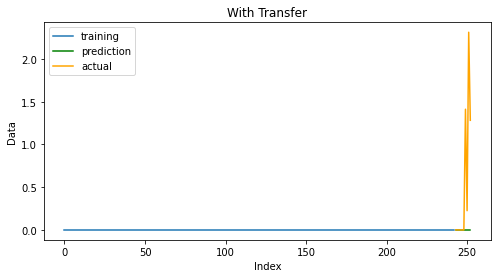

******Training on Repo ID: 129414449 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0111
Epoch 2/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0110
Epoch 3/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0110
Epoch 4/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0110
Epoch 5/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0110
Epoch 6/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0110
Epoch 7/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0110
Epoch 8/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0110
Epoch 9/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0110
Epoch 10/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0110


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [============

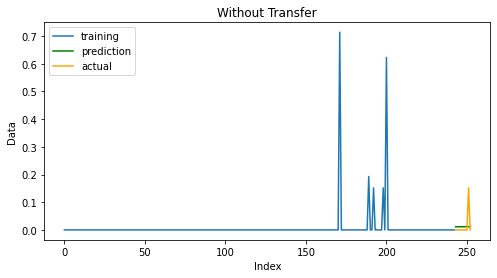

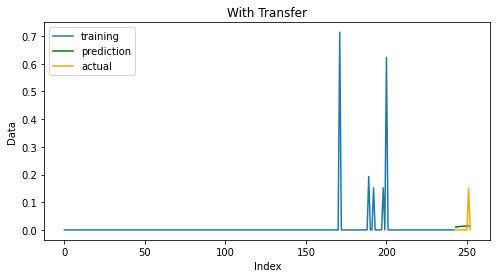

******Training on Repo ID: 149178674 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0307
Epoch 2/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0266
Epoch 3/10
173/173 [==============================] - 6s 34ms/step - loss: 0.0252
Epoch 4/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0246
Epoch 5/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0243
Epoch 6/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0241
Epoch 7/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0240
Epoch 8/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0239
Epoch 9/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0238
Epoch 10/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0237


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [============

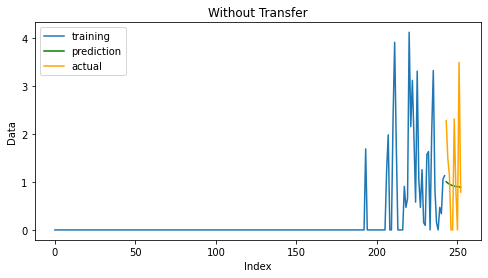

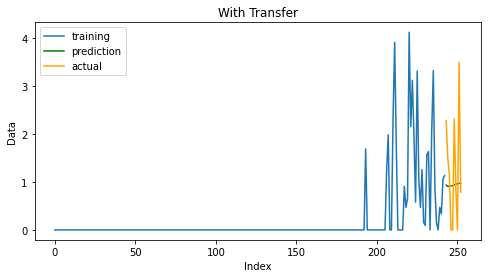

******Training on Repo ID: 139887090 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0000e+00
Epoch 2/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0000e+00
Epoch 3/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0000e+00
Epoch 4/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0000e+00
Epoch 5/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0000e+00
Epoch 6/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0000e+00
Epoch 7/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0000e+00
Epoch 8/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0000e+00
Epoch 9/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0000e+00
Epoch 10/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0000e+00


*** Fitting a model with knowledge trans

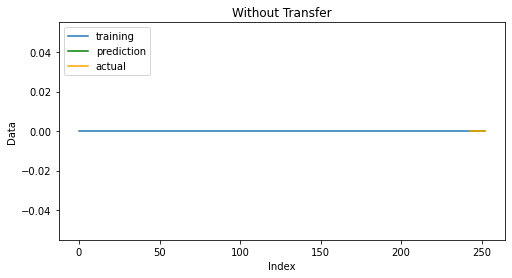

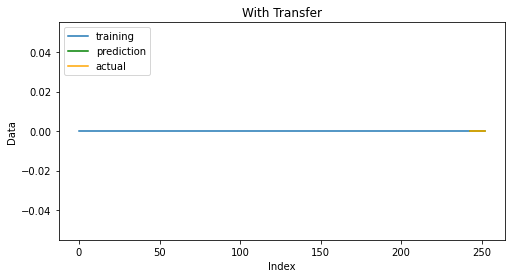

******Training on Repo ID: 182133814 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0058
Epoch 2/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0058
Epoch 3/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0058
Epoch 4/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0058
Epoch 5/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0058
Epoch 6/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0058
Epoch 7/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0058
Epoch 8/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0058
Epoch 9/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0058
Epoch 10/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0058


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [============

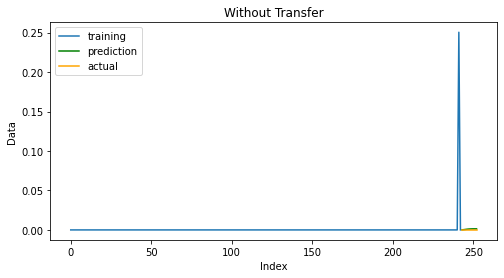

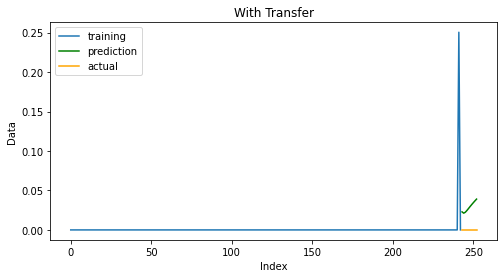

******Training on Repo ID: 23876346 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0276
Epoch 2/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0197
Epoch 3/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0191
Epoch 4/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0189
Epoch 5/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0188
Epoch 6/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0186
Epoch 7/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0185
Epoch 8/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0184
Epoch 9/10
173/173 [==============================] - 7s 42ms/step - loss: 0.0183
Epoch 10/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0182


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [=============

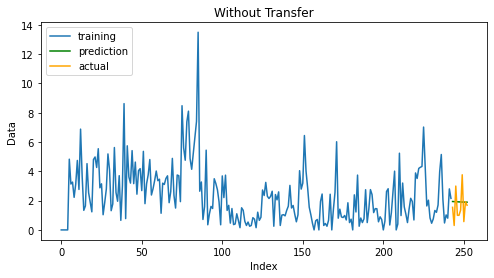

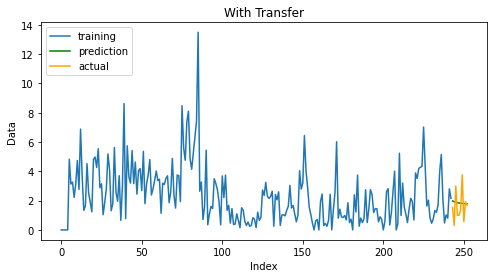

******Training on Repo ID: 108110 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 6s 32ms/step - loss: 0.1288
Epoch 2/10
173/173 [==============================] - 6s 34ms/step - loss: 0.0325
Epoch 3/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0316
Epoch 4/10
173/173 [==============================] - 6s 34ms/step - loss: 0.0309
Epoch 5/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0302
Epoch 6/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0296
Epoch 7/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0291
Epoch 8/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0287
Epoch 9/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0283
Epoch 10/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0279


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [===============

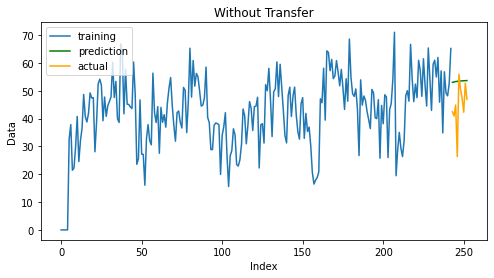

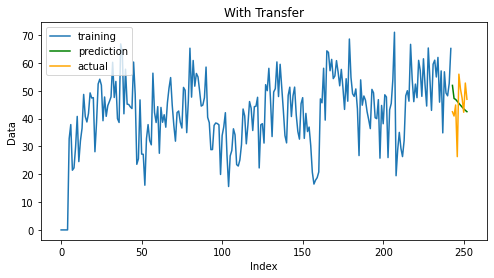

******Training on Repo ID: 60375012 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 6s 34ms/step - loss: 0.0083
Epoch 2/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0083
Epoch 3/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0082
Epoch 4/10
173/173 [==============================] - 6s 34ms/step - loss: 0.0082
Epoch 5/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0082
Epoch 6/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0081
Epoch 7/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0081
Epoch 8/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0081
Epoch 9/10
173/173 [==============================] - 6s 34ms/step - loss: 0.0081
Epoch 10/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0081


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [=============

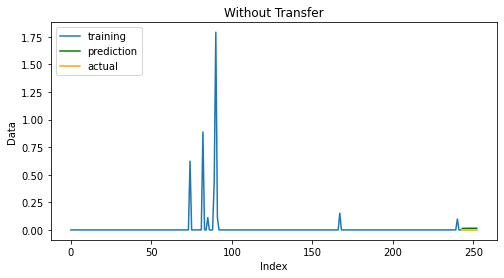

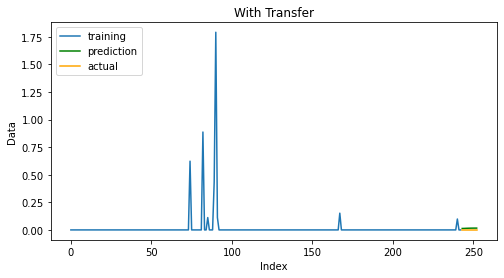

******Training on Repo ID: 170547737 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0016
Epoch 2/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0016
Epoch 3/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0016
Epoch 4/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0015
Epoch 5/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0015
Epoch 6/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0015
Epoch 7/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0014
Epoch 8/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0014
Epoch 9/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0014
Epoch 10/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0014


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [============

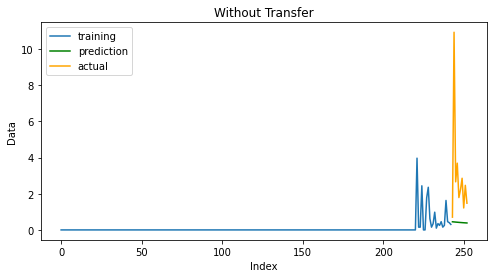

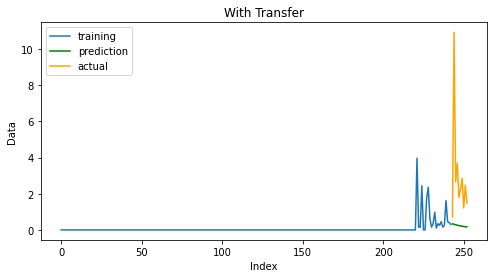

******Training on Repo ID: 173919375 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0139
Epoch 2/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0131
Epoch 3/10
173/173 [==============================] - 6s 35ms/step - loss: 0.0125
Epoch 4/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0119
Epoch 5/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0114
Epoch 6/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0110
Epoch 7/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0108
Epoch 8/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0107
Epoch 9/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0107
Epoch 10/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0106


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [============

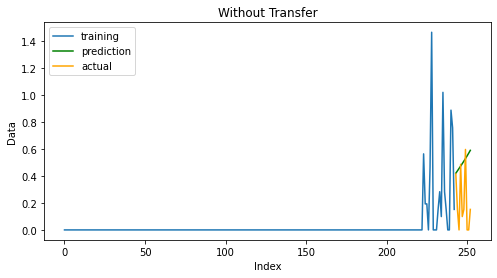

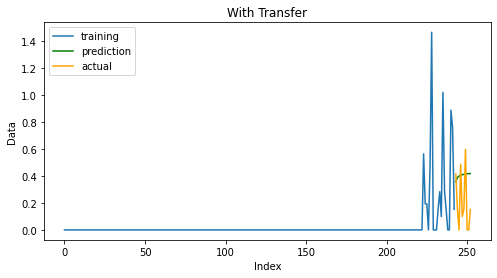

******Training on Repo ID: 4719160 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0027
Epoch 2/10
173/173 [==============================] - 6s 34ms/step - loss: 0.0023
Epoch 3/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0023
Epoch 4/10
173/173 [==============================] - 6s 34ms/step - loss: 0.0023
Epoch 5/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0023
Epoch 6/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0023
Epoch 7/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0023
Epoch 8/10
173/173 [==============================] - 8s 44ms/step - loss: 0.0023
Epoch 9/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0023
Epoch 10/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0023


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [==============

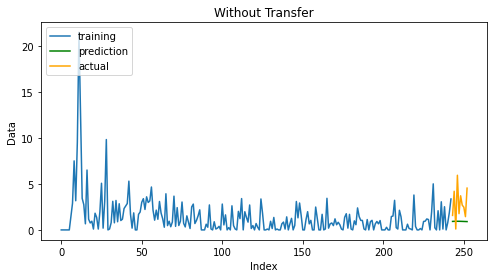

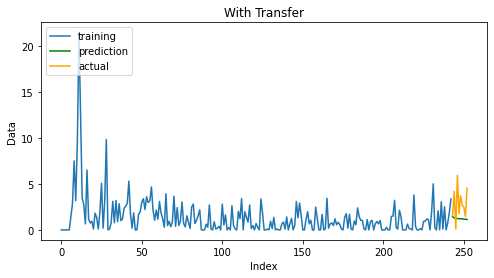

******Training on Repo ID: 9735077 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0500
Epoch 2/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0297
Epoch 3/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0290
Epoch 4/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0287
Epoch 5/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0284
Epoch 6/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0282
Epoch 7/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0280
Epoch 8/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0278
Epoch 9/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0276
Epoch 10/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0275


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [==============

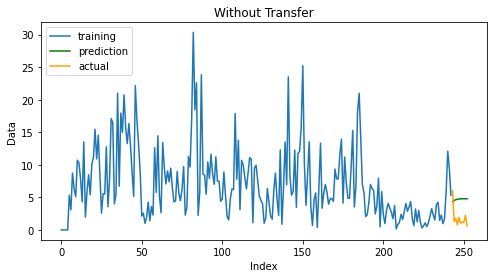

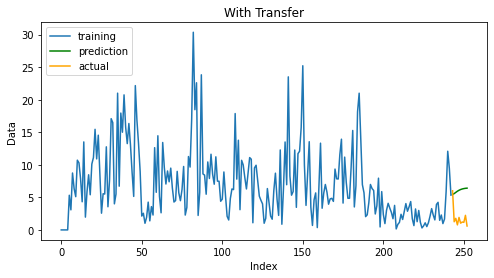

******Training on Repo ID: 35964690 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0346
Epoch 2/10
173/173 [==============================] - 6s 34ms/step - loss: 0.0256
Epoch 3/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0245
Epoch 4/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0239
Epoch 5/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0235
Epoch 6/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0231
Epoch 7/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0227
Epoch 8/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0224
Epoch 9/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0220
Epoch 10/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0218


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [=============

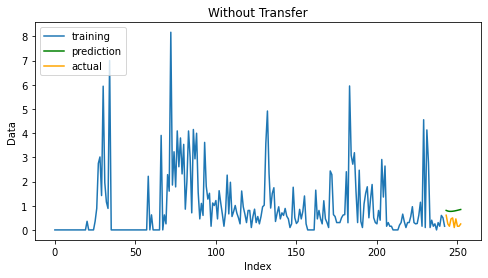

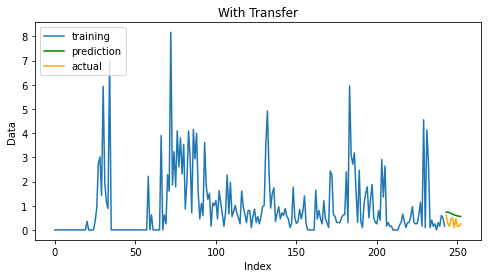

******Training on Repo ID: 108125 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0303
Epoch 2/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0252
Epoch 3/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0251
Epoch 4/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0250
Epoch 5/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0249
Epoch 6/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0248
Epoch 7/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0247
Epoch 8/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0247
Epoch 9/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0246
Epoch 10/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0245


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [===============

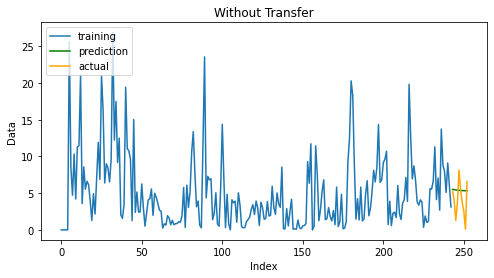

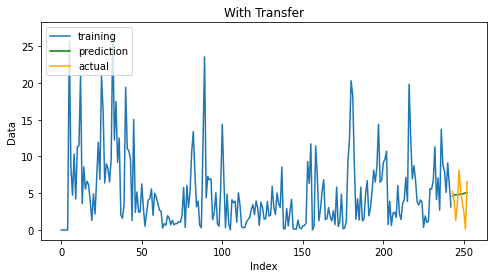

******Training on Repo ID: 126176628 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0203
Epoch 2/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0199
Epoch 3/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0197
Epoch 4/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0196
Epoch 5/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0196
Epoch 6/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0195
Epoch 7/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0195
Epoch 8/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0195
Epoch 9/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0195
Epoch 10/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0194


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [============

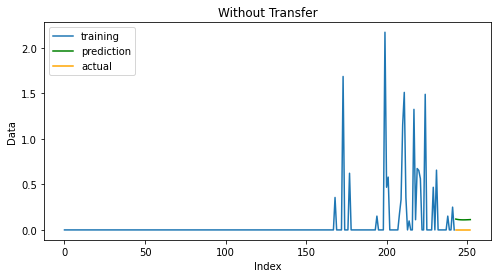

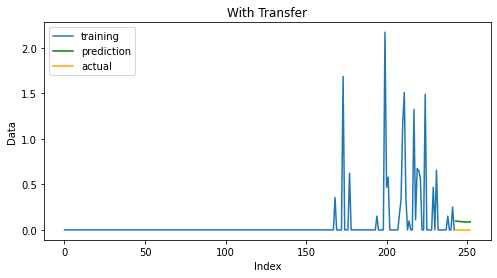

******Training on Repo ID: 87100755 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0140
Epoch 2/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0131
Epoch 3/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0130
Epoch 4/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0129
Epoch 5/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0128
Epoch 6/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0128
Epoch 7/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0128
Epoch 8/10
173/173 [==============================] - 8s 45ms/step - loss: 0.0128
Epoch 9/10
173/173 [==============================] - 7s 38ms/step - loss: 0.0127
Epoch 10/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0127


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [=============

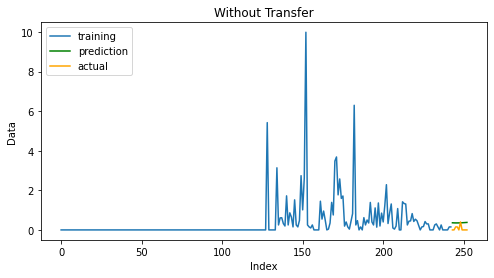

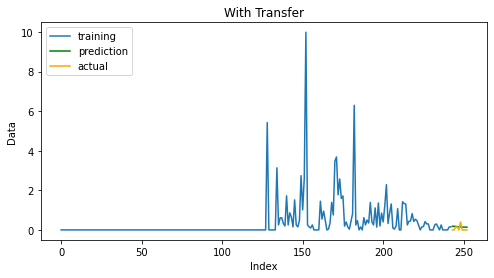

******Training on Repo ID: 87100729 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0274
Epoch 2/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0262
Epoch 3/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0259
Epoch 4/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0257
Epoch 5/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0254
Epoch 6/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0252
Epoch 7/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0249
Epoch 8/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0247
Epoch 9/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0245
Epoch 10/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0242


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [=============

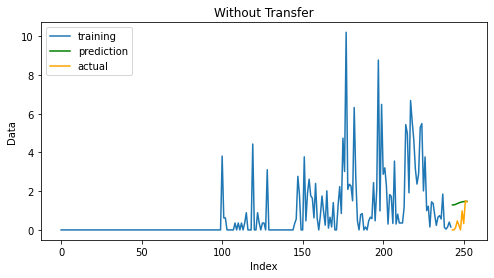

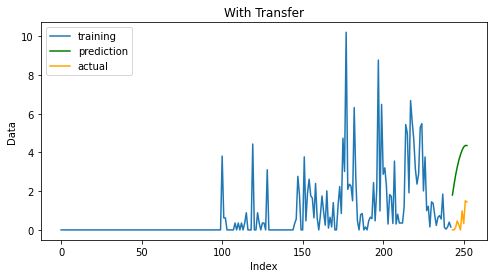

******Training on Repo ID: 9390430 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0087
Epoch 2/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0076
Epoch 3/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0075
Epoch 4/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0075
Epoch 5/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0074
Epoch 6/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0074
Epoch 7/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0074
Epoch 8/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0074
Epoch 9/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0074
Epoch 10/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0073


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [==============

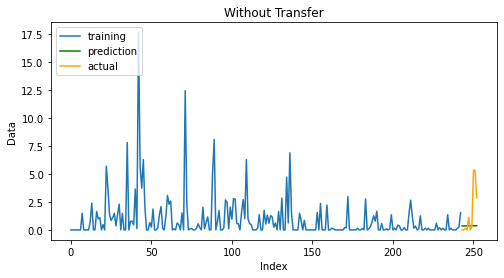

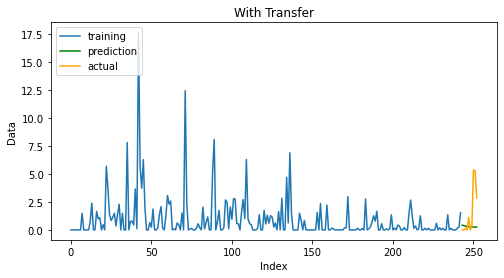

******Training on Repo ID: 193908882 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0091
Epoch 2/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0091
Epoch 3/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0090
Epoch 4/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0090
Epoch 5/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0089
Epoch 6/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0089
Epoch 7/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0089
Epoch 8/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0089
Epoch 9/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0088
Epoch 10/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0088


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [============

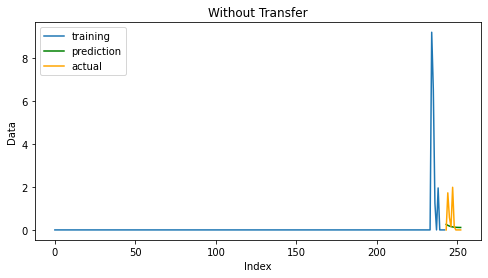

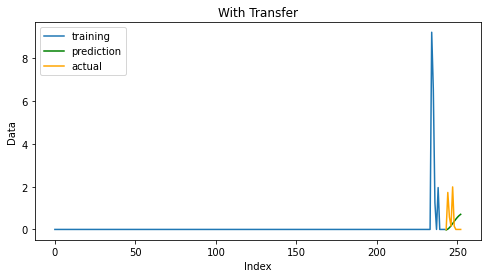

******Training on Repo ID: 89936399 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0143
Epoch 2/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0141
Epoch 3/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0141
Epoch 4/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0141
Epoch 5/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0141
Epoch 6/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0141
Epoch 7/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0141
Epoch 8/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0141
Epoch 9/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0141
Epoch 10/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0140


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [=============

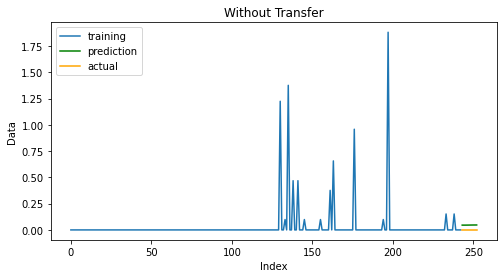

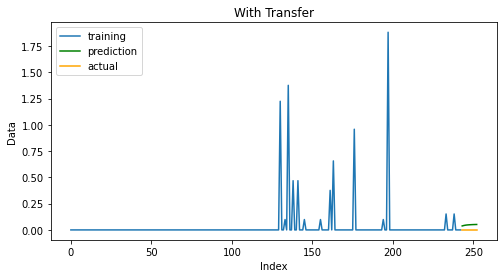

******Training on Repo ID: 210408533 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0000e+00
Epoch 2/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0000e+00
Epoch 3/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0000e+00
Epoch 4/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0000e+00
Epoch 5/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0000e+00
Epoch 6/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0000e+00
Epoch 7/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0000e+00
Epoch 8/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0000e+00
Epoch 9/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0000e+00
Epoch 10/10
173/173 [==============================] - 7s 41ms/step - loss: 0.0000e+00


*** Fitting a model with knowledge trans

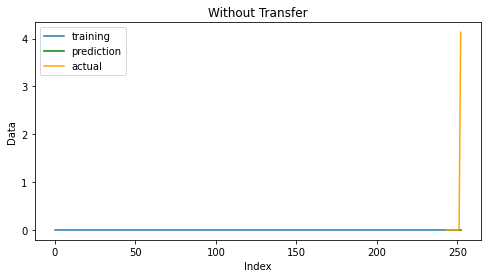

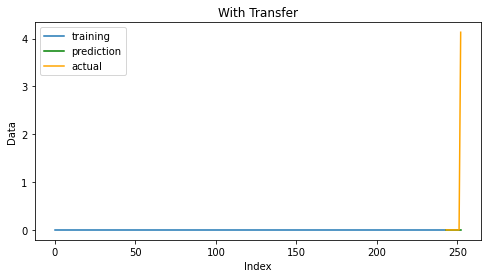

******Training on Repo ID: 699689 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0080
Epoch 2/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0055
Epoch 3/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0054
Epoch 4/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0054
Epoch 5/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0054
Epoch 6/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0054
Epoch 7/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0054
Epoch 8/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0054
Epoch 9/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0054
Epoch 10/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0054


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [===============

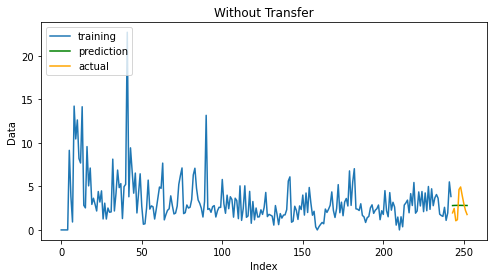

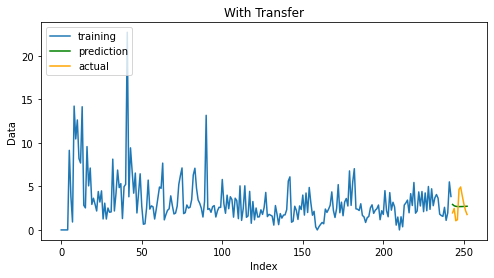

******Training on Repo ID: 15881868 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0181
Epoch 2/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0147
Epoch 3/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0145
Epoch 4/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0144
Epoch 5/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0143
Epoch 6/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0143
Epoch 7/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0142
Epoch 8/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0141
Epoch 9/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0140
Epoch 10/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0140


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [=============

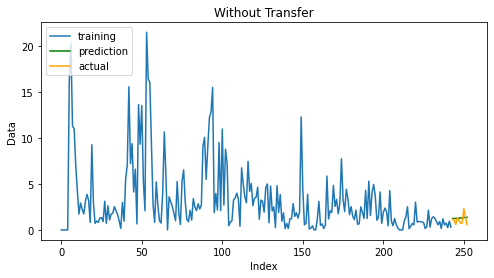

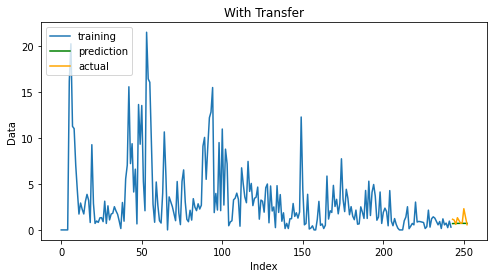

******Training on Repo ID: 125097454 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0025
Epoch 2/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0026
Epoch 3/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0026
Epoch 4/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0026
Epoch 5/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0026
Epoch 6/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0026
Epoch 7/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0026
Epoch 8/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0026
Epoch 9/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0026
Epoch 10/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0026


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [============

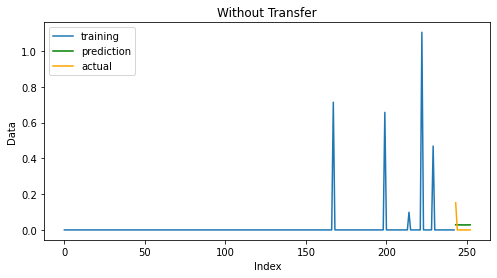

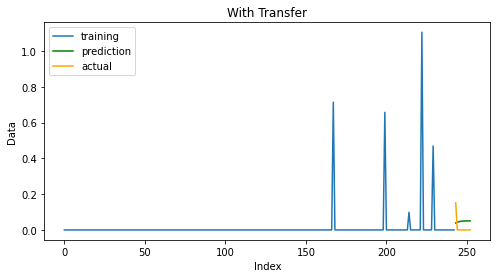

******Training on Repo ID: 60309847 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0157
Epoch 2/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0150
Epoch 3/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0149
Epoch 4/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0149
Epoch 5/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0149
Epoch 6/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0148
Epoch 7/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0148
Epoch 8/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0148
Epoch 9/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0148
Epoch 10/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0148


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [=============

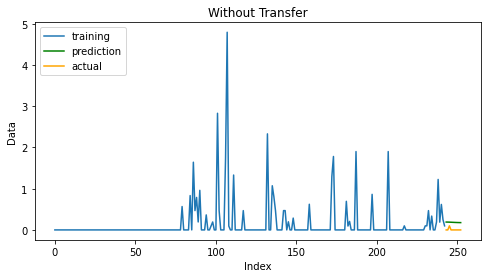

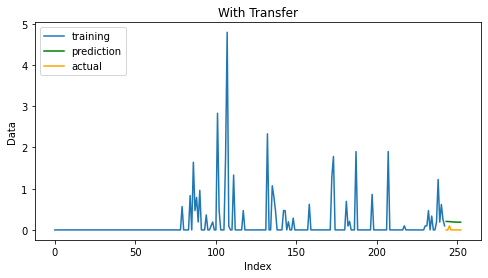

******Training on Repo ID: 212192489 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 6s 34ms/step - loss: 0.0000e+00
Epoch 2/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0000e+00
Epoch 3/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0000e+00
Epoch 4/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0000e+00
Epoch 5/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0000e+00
Epoch 6/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0000e+00
Epoch 7/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0000e+00
Epoch 8/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0000e+00
Epoch 9/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0000e+00
Epoch 10/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0000e+00


*** Fitting a model with knowledge trans

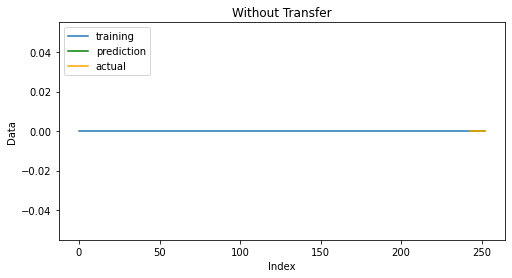

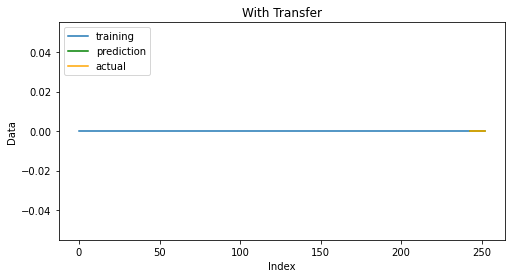

******Training on Repo ID: 168234055 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0093
Epoch 2/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0091
Epoch 3/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0080
Epoch 4/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0077
Epoch 5/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0077
Epoch 6/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0076
Epoch 7/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0076
Epoch 8/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0076
Epoch 9/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0076
Epoch 10/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0076


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [============

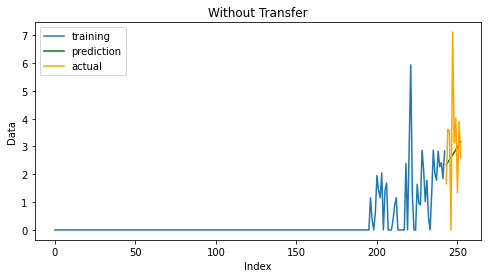

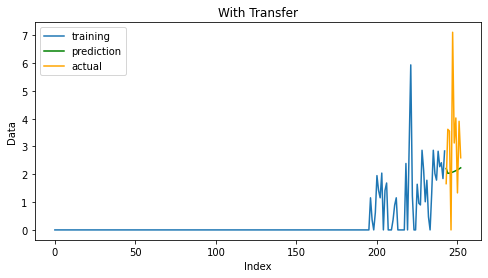

******Training on Repo ID: 61801701 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0127
Epoch 2/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0122
Epoch 3/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0120
Epoch 4/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0119
Epoch 5/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0118
Epoch 6/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0118
Epoch 7/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0117
Epoch 8/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0117
Epoch 9/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0116
Epoch 10/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0116


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [=============

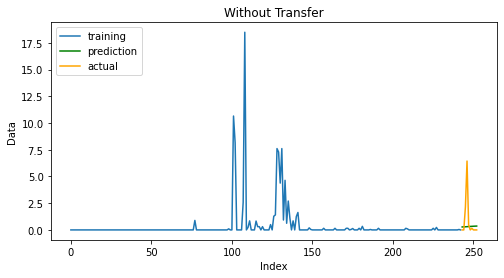

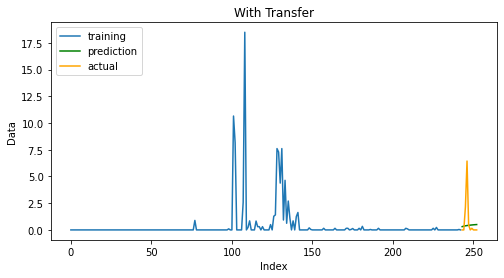

******Training on Repo ID: 118030974 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0226
Epoch 2/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0213
Epoch 3/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0202
Epoch 4/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0198
Epoch 5/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0195
Epoch 6/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0194
Epoch 7/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0193
Epoch 8/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0192
Epoch 9/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0191
Epoch 10/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0191


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [============

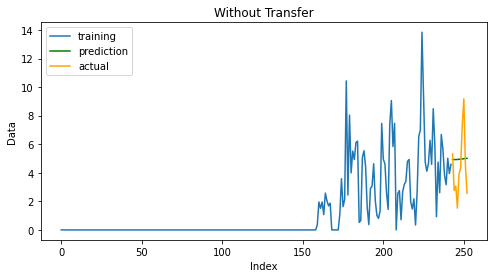

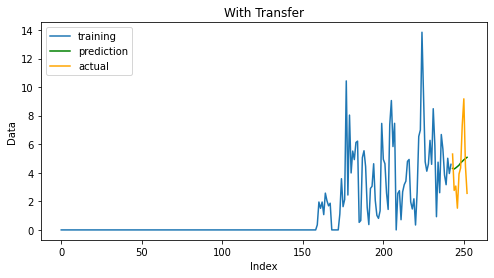

******Training on Repo ID: 33236561 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 6s 34ms/step - loss: 0.0023
Epoch 2/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0022
Epoch 3/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0022
Epoch 4/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0021
Epoch 5/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0021
Epoch 6/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0021
Epoch 7/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0021
Epoch 8/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0021
Epoch 9/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0021
Epoch 10/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0021


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [=============

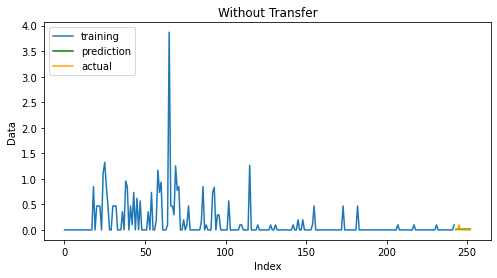

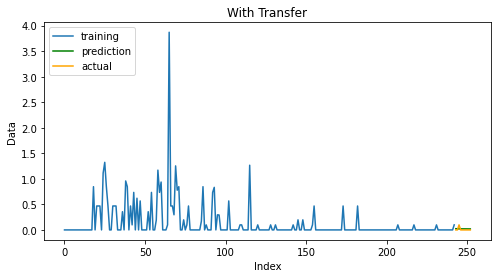

******Training on Repo ID: 87100707 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0236
Epoch 2/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0219
Epoch 3/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0218
Epoch 4/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0216
Epoch 5/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0215
Epoch 6/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0214
Epoch 7/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0213
Epoch 8/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0212
Epoch 9/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0211
Epoch 10/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0210


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [=============

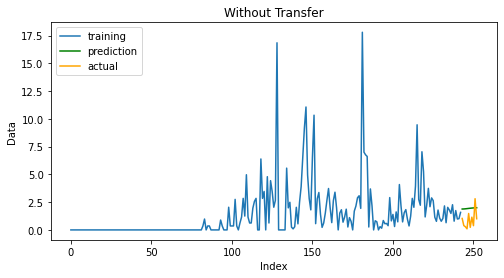

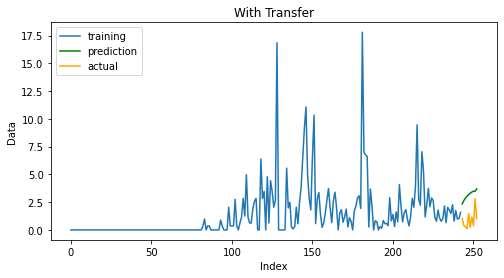

******Training on Repo ID: 121291048 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0066
Epoch 2/10
173/173 [==============================] - 6s 34ms/step - loss: 0.0071
Epoch 3/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0064
Epoch 4/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0062
Epoch 5/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0060
Epoch 6/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0059
Epoch 7/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0058
Epoch 8/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0058
Epoch 9/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0057
Epoch 10/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0057


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [============

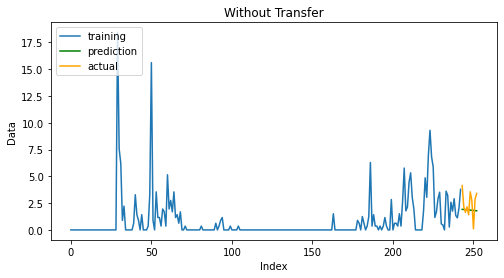

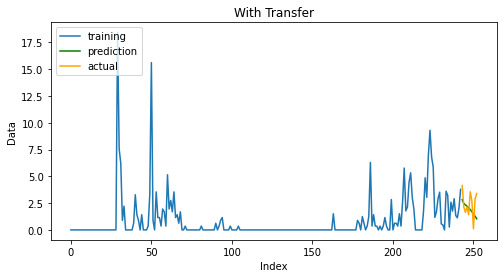

******Training on Repo ID: 33692834 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0074
Epoch 2/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0073
Epoch 3/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0073
Epoch 4/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0073
Epoch 5/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0073
Epoch 6/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0072
Epoch 7/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0072
Epoch 8/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0072
Epoch 9/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0072
Epoch 10/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0072


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [=============

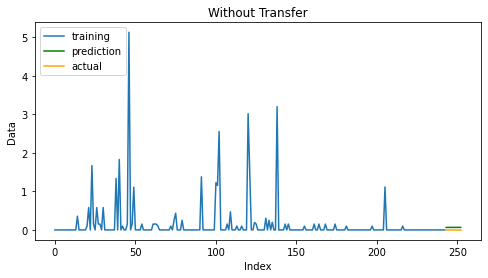

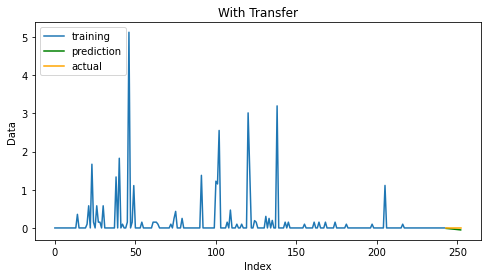

******Training on Repo ID: 19514152 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0187
Epoch 2/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0139
Epoch 3/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0139
Epoch 4/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0138
Epoch 5/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0138
Epoch 6/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0137
Epoch 7/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0137
Epoch 8/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0137
Epoch 9/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0136
Epoch 10/10
173/173 [==============================] - 6s 34ms/step - loss: 0.0136


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [=============

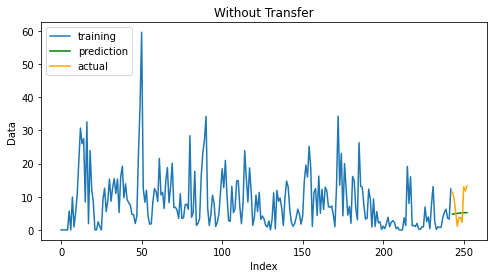

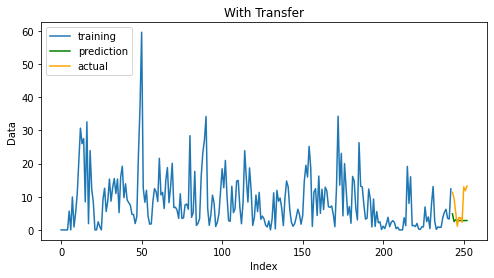

******Training on Repo ID: 181737603 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0129
Epoch 2/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0125
Epoch 3/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0123
Epoch 4/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0122
Epoch 5/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0121
Epoch 6/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0120
Epoch 7/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0120
Epoch 8/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0119
Epoch 9/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0119
Epoch 10/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0119


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [============

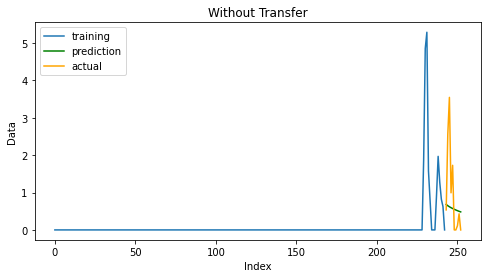

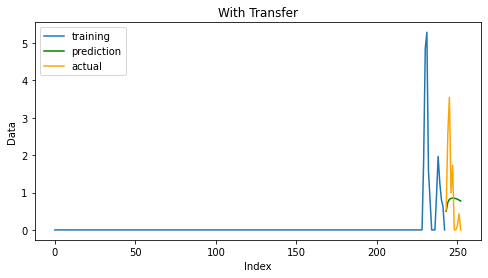

******Training on Repo ID: 146502453 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0140
Epoch 2/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0132
Epoch 3/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0130
Epoch 4/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0128
Epoch 5/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0127
Epoch 6/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0126
Epoch 7/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0125
Epoch 8/10
173/173 [==============================] - 6s 36ms/step - loss: 0.0124
Epoch 9/10
173/173 [==============================] - 6s 34ms/step - loss: 0.0123
Epoch 10/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0122


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [============

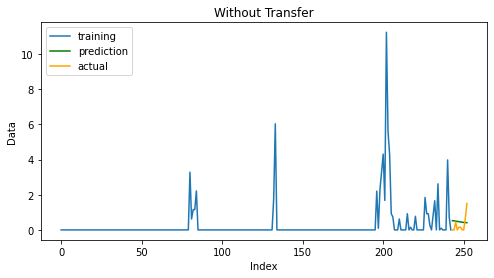

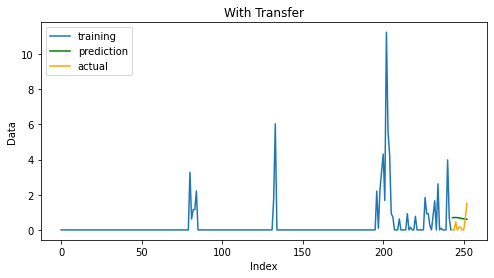

******Training on Repo ID: 148386191 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0058
Epoch 2/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0058
Epoch 3/10
173/173 [==============================] - 5s 29ms/step - loss: 0.0058
Epoch 4/10
173/173 [==============================] - 5s 29ms/step - loss: 0.0058
Epoch 5/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0058
Epoch 6/10
173/173 [==============================] - 5s 29ms/step - loss: 0.0058
Epoch 7/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0058
Epoch 8/10
173/173 [==============================] - 5s 29ms/step - loss: 0.0058
Epoch 9/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0058
Epoch 10/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0058


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [============

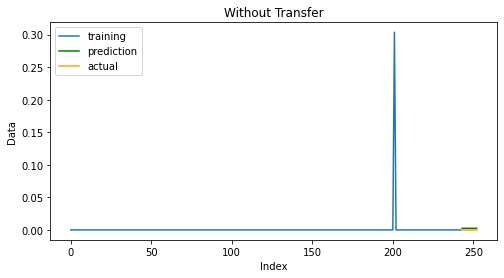

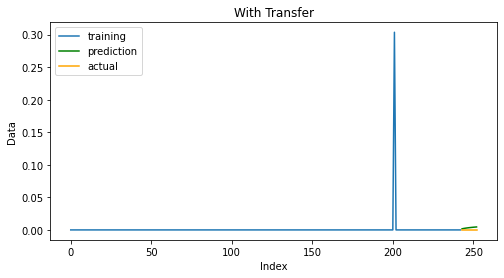

******Training on Repo ID: 34016145 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 5s 30ms/step - loss: 6.8787e-04
Epoch 2/10
173/173 [==============================] - 5s 31ms/step - loss: 6.3853e-04
Epoch 3/10
173/173 [==============================] - 5s 31ms/step - loss: 6.0634e-04
Epoch 4/10
173/173 [==============================] - 5s 31ms/step - loss: 5.8308e-04
Epoch 5/10
173/173 [==============================] - 5s 30ms/step - loss: 5.6769e-04
Epoch 6/10
173/173 [==============================] - 5s 31ms/step - loss: 5.5805e-04
Epoch 7/10
173/173 [==============================] - 5s 31ms/step - loss: 5.5210e-04
Epoch 8/10
173/173 [==============================] - 5s 31ms/step - loss: 5.4830e-04
Epoch 9/10
173/173 [==============================] - 5s 32ms/step - loss: 5.4571e-04
Epoch 10/10
173/173 [==============================] - 6s 32ms/step - loss: 5.4378e-04


*** Fitting a model with knowledge transf

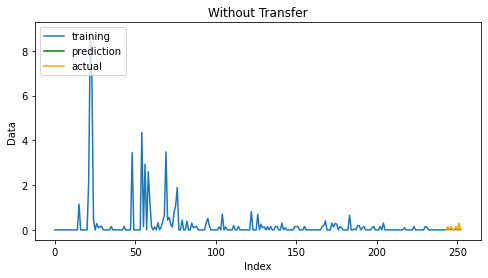

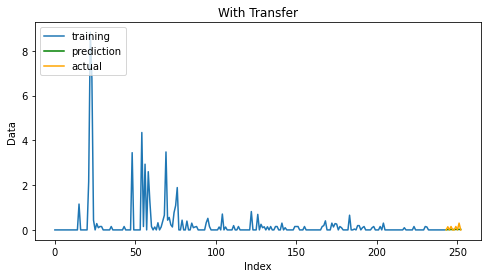

******Training on Repo ID: 13531617 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0205
Epoch 2/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0202
Epoch 3/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0201
Epoch 4/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0201
Epoch 5/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0201
Epoch 6/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0201
Epoch 7/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0201
Epoch 8/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0201
Epoch 9/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0201
Epoch 10/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0201


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [=============

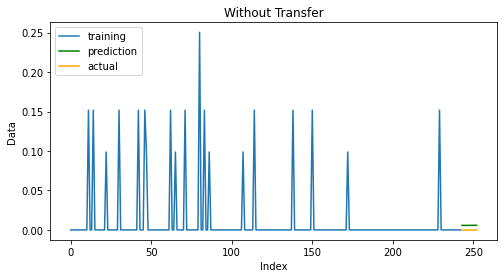

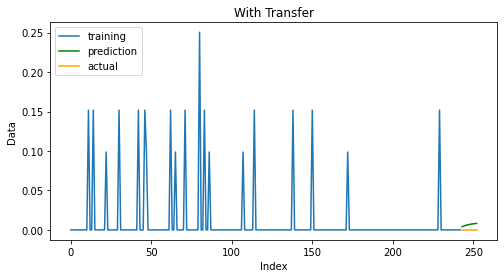

******Training on Repo ID: 159751068 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0012
Epoch 2/10
173/173 [==============================] - 6s 34ms/step - loss: 0.0012
Epoch 3/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0012
Epoch 4/10
173/173 [==============================] - 6s 34ms/step - loss: 0.0012
Epoch 5/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0012
Epoch 6/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0012
Epoch 7/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0012
Epoch 8/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0012
Epoch 9/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0012
Epoch 10/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0012


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [============

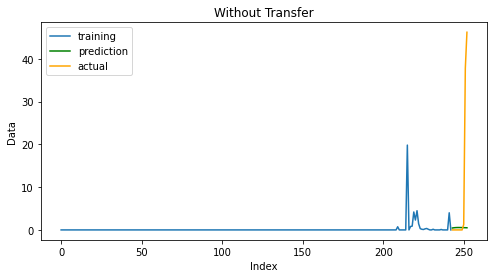

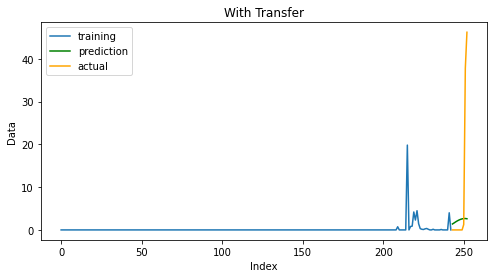

******Training on Repo ID: 23092012 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0128
Epoch 2/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0121
Epoch 3/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0118
Epoch 4/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0115
Epoch 5/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0113
Epoch 6/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0112
Epoch 7/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0110
Epoch 8/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0109
Epoch 9/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0107
Epoch 10/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0106


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [=============

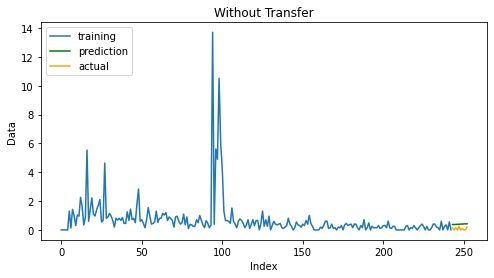

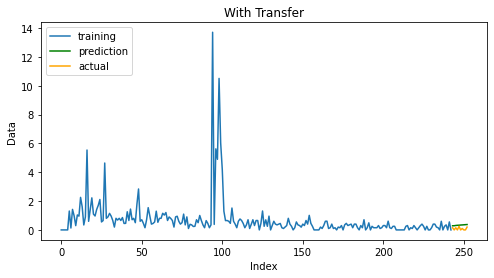

******Training on Repo ID: 205274041 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0000e+00
Epoch 2/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0000e+00
Epoch 3/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0000e+00
Epoch 4/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0000e+00
Epoch 5/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0000e+00
Epoch 6/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0000e+00
Epoch 7/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0000e+00
Epoch 8/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0000e+00
Epoch 9/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0000e+00
Epoch 10/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0000e+00


*** Fitting a model with knowledge trans

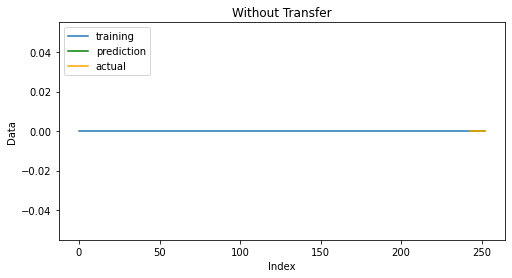

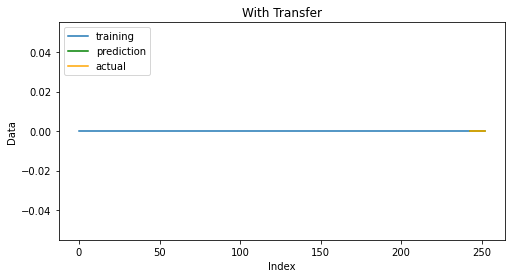

******Training on Repo ID: 38891827 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 5s 31ms/step - loss: 4.2890e-04
Epoch 2/10
173/173 [==============================] - 5s 31ms/step - loss: 4.2406e-04
Epoch 3/10
173/173 [==============================] - 5s 32ms/step - loss: 4.2362e-04
Epoch 4/10
173/173 [==============================] - 5s 30ms/step - loss: 4.2317e-04
Epoch 5/10
173/173 [==============================] - 5s 31ms/step - loss: 4.2271e-04
Epoch 6/10
173/173 [==============================] - 5s 31ms/step - loss: 4.2222e-04
Epoch 7/10
173/173 [==============================] - 5s 31ms/step - loss: 4.2169e-04
Epoch 8/10
173/173 [==============================] - 5s 31ms/step - loss: 4.2112e-04
Epoch 9/10
173/173 [==============================] - 5s 31ms/step - loss: 4.2050e-04
Epoch 10/10
173/173 [==============================] - 5s 31ms/step - loss: 4.1984e-04


*** Fitting a model with knowledge transf

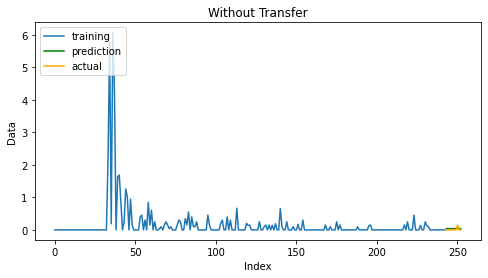

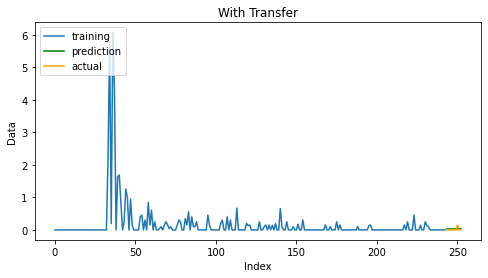

******Training on Repo ID: 157298123 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0058
Epoch 2/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0058
Epoch 3/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0058
Epoch 4/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0058
Epoch 5/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0058
Epoch 6/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0058
Epoch 7/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0058
Epoch 8/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0058
Epoch 9/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0058
Epoch 10/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0058


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [============

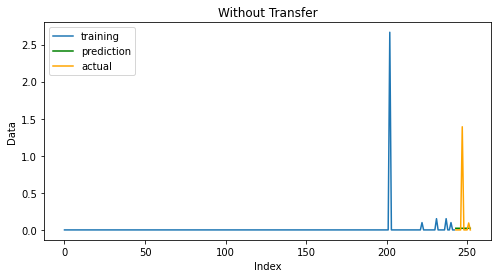

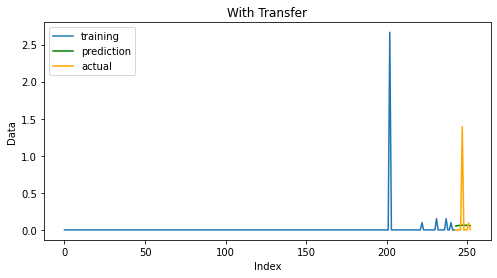

******Training on Repo ID: 178963032 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0058
Epoch 2/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0058
Epoch 3/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0058
Epoch 4/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0058
Epoch 5/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0058
Epoch 6/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0058
Epoch 7/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0058
Epoch 8/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0058
Epoch 9/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0058
Epoch 10/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0058


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [============

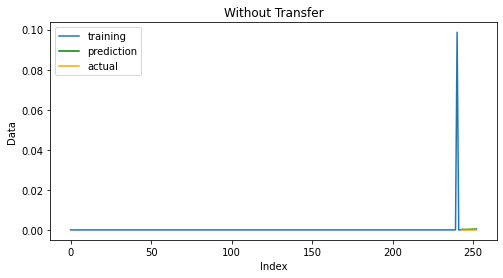

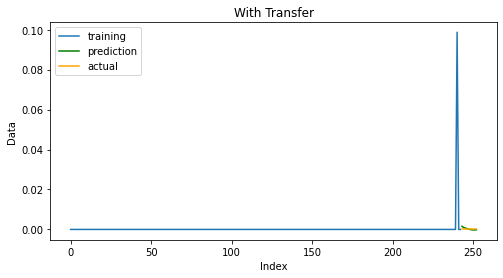

******Training on Repo ID: 91736529 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0190
Epoch 2/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0158
Epoch 3/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0140
Epoch 4/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0132
Epoch 5/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0127
Epoch 6/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0125
Epoch 7/10
173/173 [==============================] - 6s 34ms/step - loss: 0.0122
Epoch 8/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0121
Epoch 9/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0120
Epoch 10/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0119


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [=============

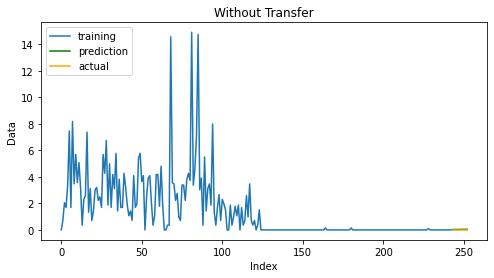

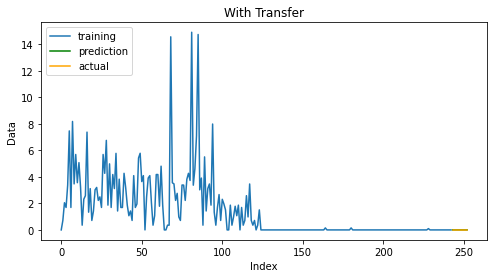

******Training on Repo ID: 34020308 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0217
Epoch 2/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0179
Epoch 3/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0177
Epoch 4/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0175
Epoch 5/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0174
Epoch 6/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0173
Epoch 7/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0172
Epoch 8/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0171
Epoch 9/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0171
Epoch 10/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0170


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [=============

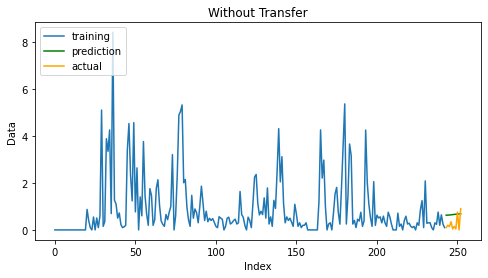

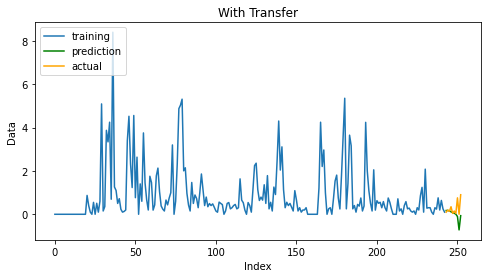

******Training on Repo ID: 150157911 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0267
Epoch 2/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0260
Epoch 3/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0258
Epoch 4/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0256
Epoch 5/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0255
Epoch 6/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0254
Epoch 7/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0253
Epoch 8/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0251
Epoch 9/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0250
Epoch 10/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0249


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [============

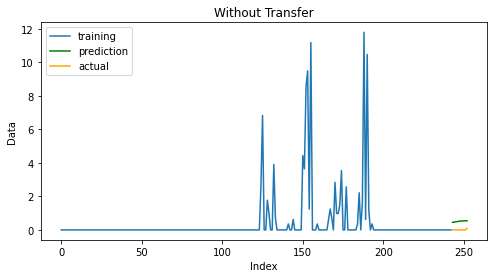

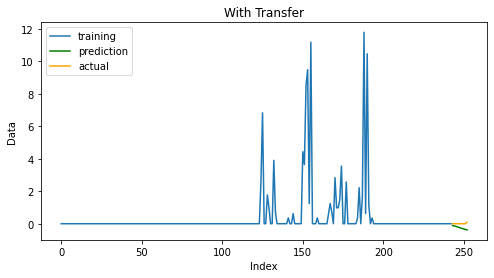

******Training on Repo ID: 138208400 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0059
Epoch 2/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0059
Epoch 3/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0058
Epoch 4/10
173/173 [==============================] - 6s 34ms/step - loss: 0.0058
Epoch 5/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0058
Epoch 6/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0058
Epoch 7/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0058
Epoch 8/10
173/173 [==============================] - 5s 29ms/step - loss: 0.0058
Epoch 9/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0058
Epoch 10/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0058


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [============

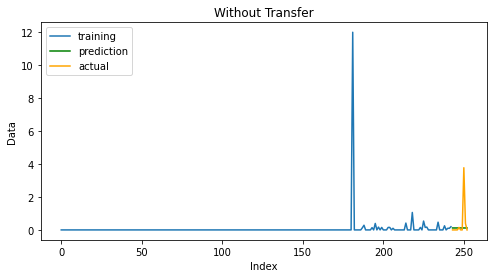

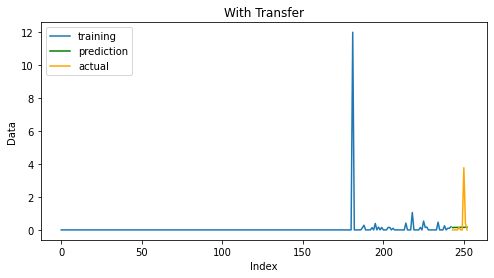

******Training on Repo ID: 137439053 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0095
Epoch 2/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0095
Epoch 3/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0094
Epoch 4/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0094
Epoch 5/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0093
Epoch 6/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0093
Epoch 7/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0092
Epoch 8/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0092
Epoch 9/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0092
Epoch 10/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0091


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [============

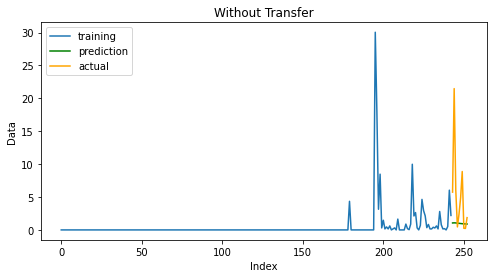

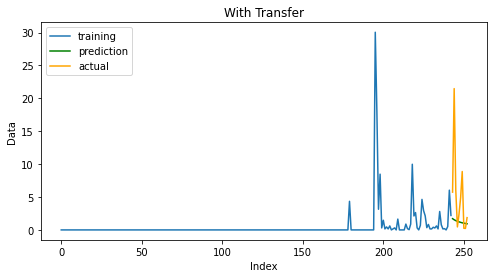

******Training on Repo ID: 94722028 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0071
Epoch 2/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0071
Epoch 3/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0071
Epoch 4/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0071
Epoch 5/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0071
Epoch 6/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0071
Epoch 7/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0070
Epoch 8/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0070
Epoch 9/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0070
Epoch 10/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0070


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [=============

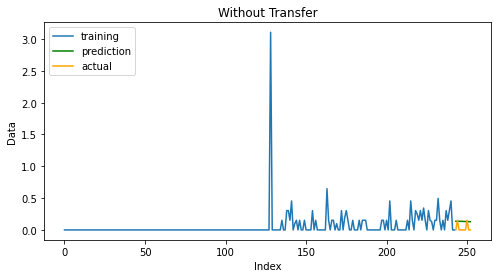

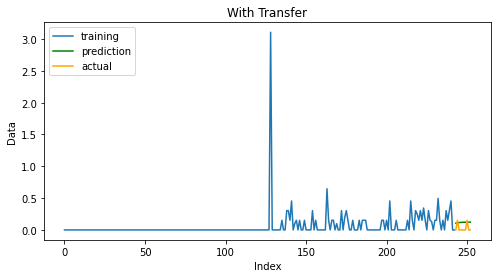

******Training on Repo ID: 30907323 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0130
Epoch 2/10
173/173 [==============================] - 7s 41ms/step - loss: 0.0119
Epoch 3/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0117
Epoch 4/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0117
Epoch 5/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0116
Epoch 6/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0116
Epoch 7/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0116
Epoch 8/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0116
Epoch 9/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0116
Epoch 10/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0116


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [=============

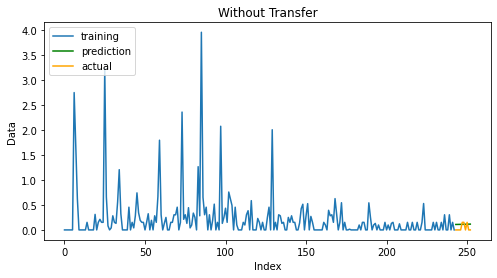

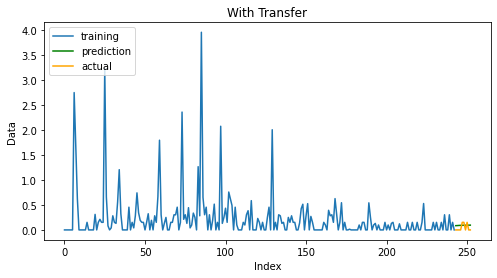

******Training on Repo ID: 138068852 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0176
Epoch 2/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0161
Epoch 3/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0155
Epoch 4/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0151
Epoch 5/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0148
Epoch 6/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0146
Epoch 7/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0143
Epoch 8/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0141
Epoch 9/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0139
Epoch 10/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0137


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [============

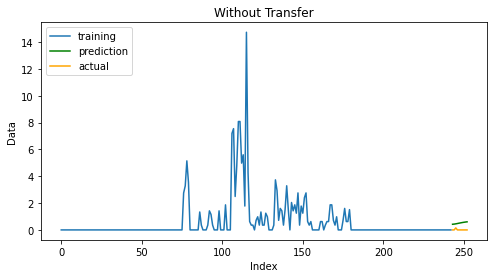

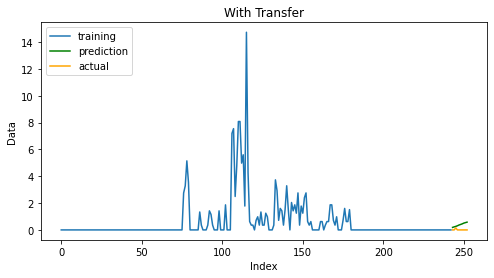

******Training on Repo ID: 31239738 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 6s 32ms/step - loss: 2.3596e-04
Epoch 2/10
173/173 [==============================] - 5s 32ms/step - loss: 2.3364e-04
Epoch 3/10
173/173 [==============================] - 6s 33ms/step - loss: 2.3348e-04
Epoch 4/10
173/173 [==============================] - 5s 31ms/step - loss: 2.3292e-04
Epoch 5/10
173/173 [==============================] - 5s 32ms/step - loss: 2.3219e-04
Epoch 6/10
173/173 [==============================] - 5s 31ms/step - loss: 2.3128e-04
Epoch 7/10
173/173 [==============================] - 6s 33ms/step - loss: 2.3015e-04
Epoch 8/10
173/173 [==============================] - 5s 31ms/step - loss: 2.2865e-04
Epoch 9/10
173/173 [==============================] - 5s 32ms/step - loss: 2.2673e-04
Epoch 10/10
173/173 [==============================] - 6s 33ms/step - loss: 2.2427e-04


*** Fitting a model with knowledge transf

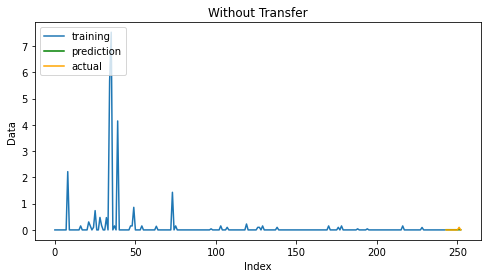

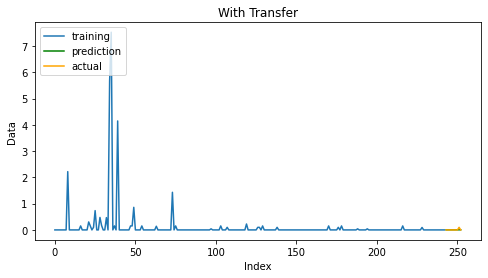

******Training on Repo ID: 41177171 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0236
Epoch 2/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0188
Epoch 3/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0181
Epoch 4/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0179
Epoch 5/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0177
Epoch 6/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0175
Epoch 7/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0174
Epoch 8/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0173
Epoch 9/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0172
Epoch 10/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0171


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [=============

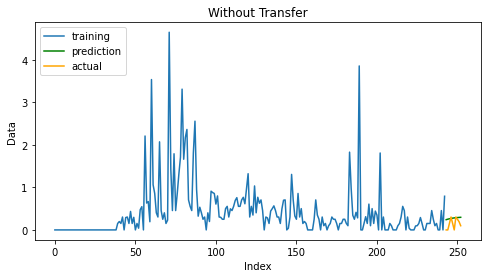

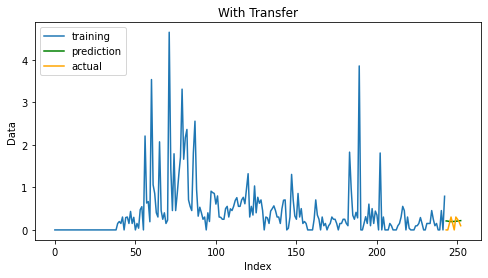

******Training on Repo ID: 23122353 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0114
Epoch 2/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0112
Epoch 3/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0112
Epoch 4/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0112
Epoch 5/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0112
Epoch 6/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0112
Epoch 7/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0112
Epoch 8/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0111
Epoch 9/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0111
Epoch 10/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0111


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [=============

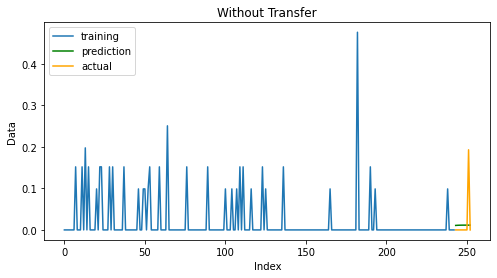

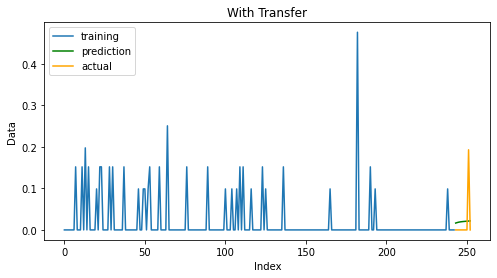

******Training on Repo ID: 135875752 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0080
Epoch 2/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0079
Epoch 3/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0079
Epoch 4/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0079
Epoch 5/10
173/173 [==============================] - 7s 38ms/step - loss: 0.0079
Epoch 6/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0079
Epoch 7/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0079
Epoch 8/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0079
Epoch 9/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0079
Epoch 10/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0079


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [============

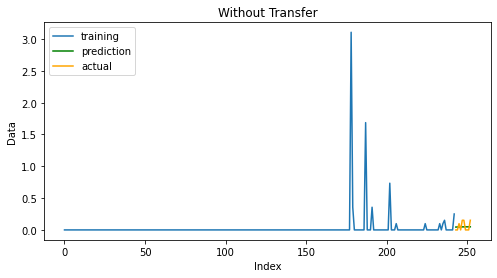

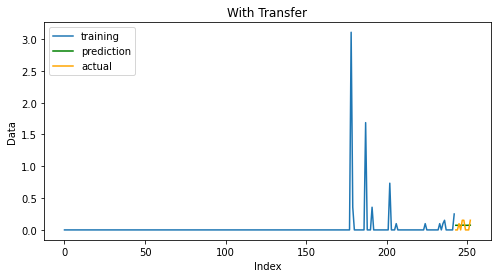

******Training on Repo ID: 92971378 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0526
Epoch 2/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0369
Epoch 3/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0358
Epoch 4/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0351
Epoch 5/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0345
Epoch 6/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0339
Epoch 7/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0334
Epoch 8/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0330
Epoch 9/10
173/173 [==============================] - 5s 29ms/step - loss: 0.0326
Epoch 10/10
173/173 [==============================] - 5s 28ms/step - loss: 0.0322


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [=============

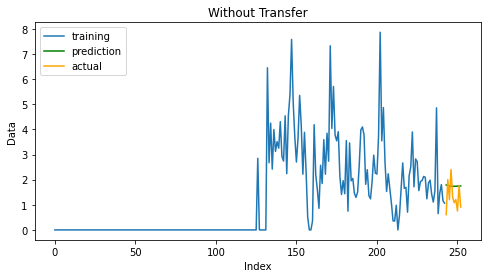

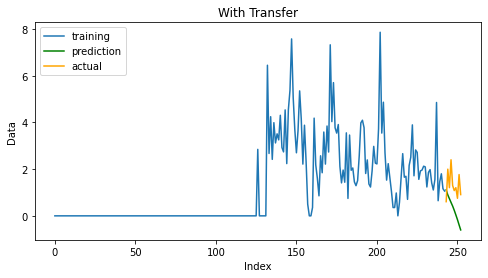

******Training on Repo ID: 23403523 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0085
Epoch 2/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0081
Epoch 3/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0080
Epoch 4/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0079
Epoch 5/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0079
Epoch 6/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0079
Epoch 7/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0078
Epoch 8/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0078
Epoch 9/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0078
Epoch 10/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0078


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [=============

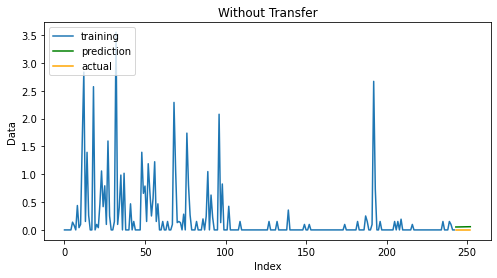

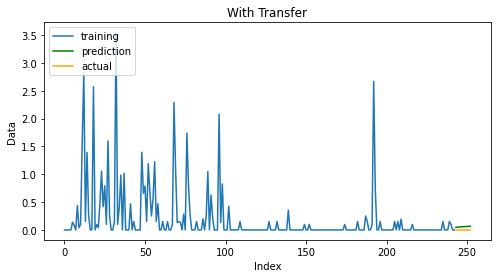

******Training on Repo ID: 41820544 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0250
Epoch 2/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0200
Epoch 3/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0198
Epoch 4/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0197
Epoch 5/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0197
Epoch 6/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0196
Epoch 7/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0196
Epoch 8/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0196
Epoch 9/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0196
Epoch 10/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0195


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [=============

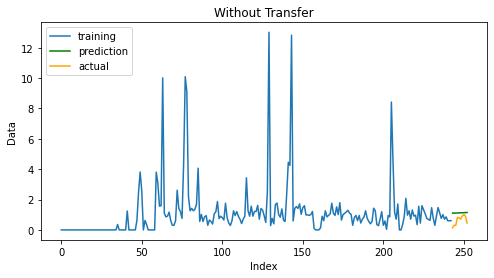

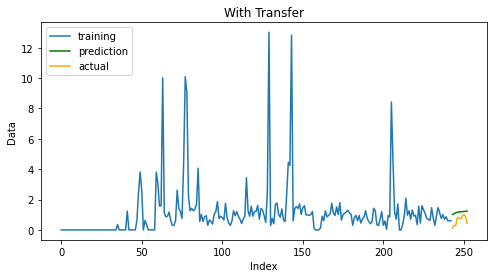

******Training on Repo ID: 142078844 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0054
Epoch 2/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0047
Epoch 3/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0045
Epoch 4/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0044
Epoch 5/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0043
Epoch 6/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0042
Epoch 7/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0041
Epoch 8/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0041
Epoch 9/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0040
Epoch 10/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0039


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [============

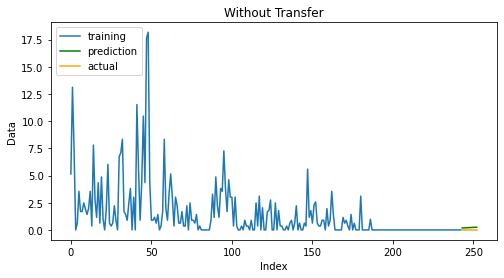

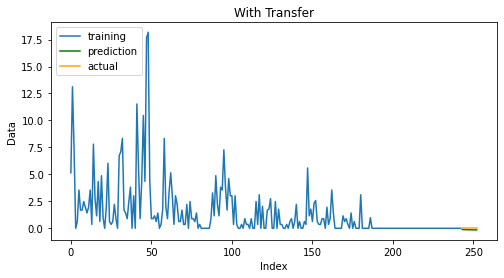

******Training on Repo ID: 27461793 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0062
Epoch 2/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0030
Epoch 3/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0025
Epoch 4/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0023
Epoch 5/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0022
Epoch 6/10
173/173 [==============================] - 6s 34ms/step - loss: 0.0021
Epoch 7/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0021
Epoch 8/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0021
Epoch 9/10
173/173 [==============================] - 6s 34ms/step - loss: 0.0021
Epoch 10/10
173/173 [==============================] - 7s 38ms/step - loss: 0.0021


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [=============

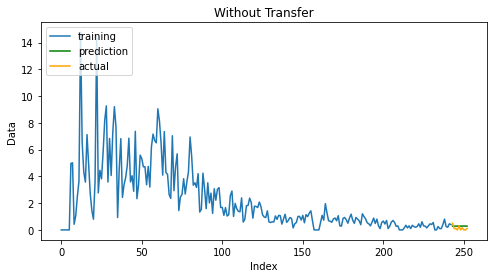

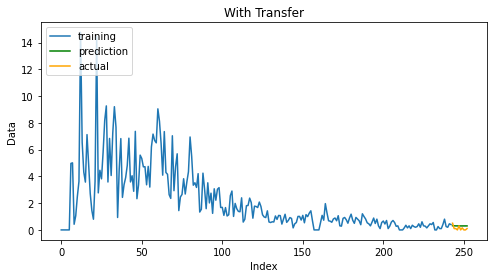

******Training on Repo ID: 108048554 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0061
Epoch 2/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0060
Epoch 3/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0060
Epoch 4/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0060
Epoch 5/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0060
Epoch 6/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0060
Epoch 7/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0060
Epoch 8/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0060
Epoch 9/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0060
Epoch 10/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0060


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [============

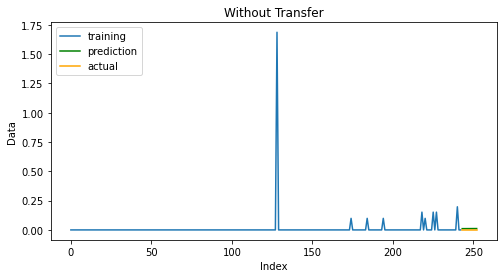

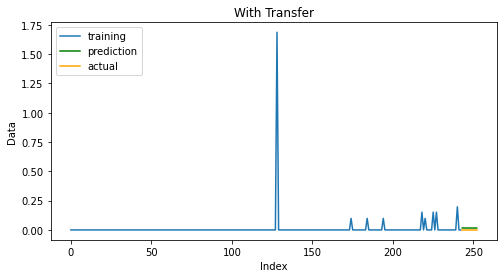

******Training on Repo ID: 23332040 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0375
Epoch 2/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0216
Epoch 3/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0214
Epoch 4/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0213
Epoch 5/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0212
Epoch 6/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0212
Epoch 7/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0211
Epoch 8/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0210
Epoch 9/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0210
Epoch 10/10
173/173 [==============================] - 5s 28ms/step - loss: 0.0209


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [=============

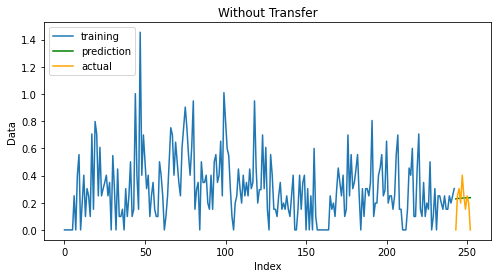

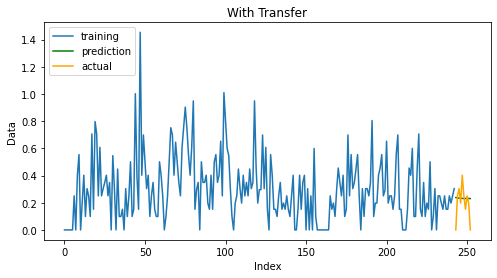

******Training on Repo ID: 47363193 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 5s 30ms/step - loss: 1.0292e-06
Epoch 2/10
173/173 [==============================] - 5s 31ms/step - loss: 9.9100e-07
Epoch 3/10
173/173 [==============================] - 5s 31ms/step - loss: 9.4400e-07
Epoch 4/10
173/173 [==============================] - 5s 31ms/step - loss: 9.6214e-07
Epoch 5/10
173/173 [==============================] - 5s 31ms/step - loss: 9.6012e-07
Epoch 6/10
173/173 [==============================] - 5s 31ms/step - loss: 9.5125e-07
Epoch 7/10
173/173 [==============================] - 5s 31ms/step - loss: 9.3872e-07
Epoch 8/10
173/173 [==============================] - 6s 32ms/step - loss: 9.2603e-07
Epoch 9/10
173/173 [==============================] - 5s 31ms/step - loss: 9.1457e-07
Epoch 10/10
173/173 [==============================] - 6s 33ms/step - loss: 9.0460e-07


*** Fitting a model with knowledge transf

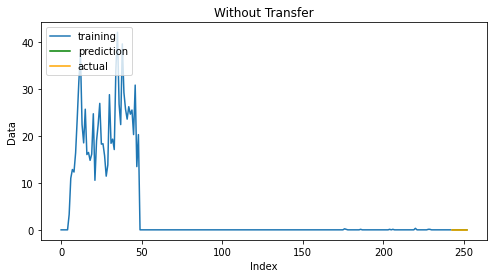

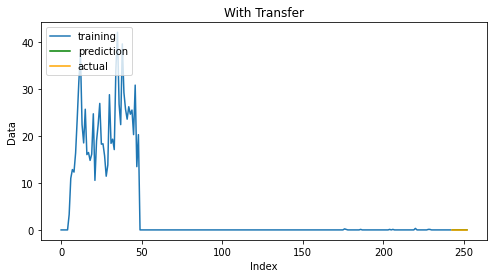

******Training on Repo ID: 124468901 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0326
Epoch 2/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0297
Epoch 3/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0293
Epoch 4/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0291
Epoch 5/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0290
Epoch 6/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0290
Epoch 7/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0289
Epoch 8/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0289
Epoch 9/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0288
Epoch 10/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0288


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [============

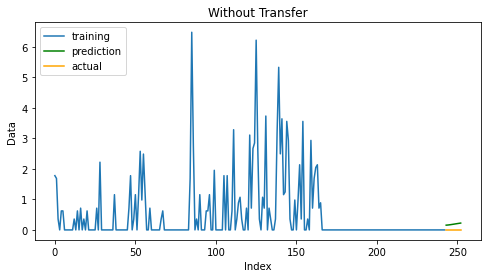

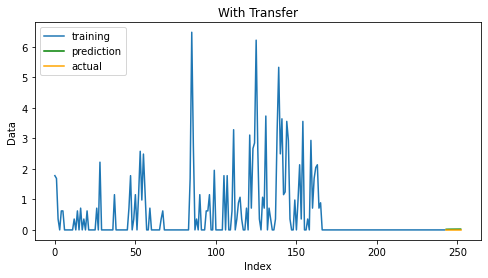

******Training on Repo ID: 145625793 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0106
Epoch 2/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0105
Epoch 3/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0104
Epoch 4/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0104
Epoch 5/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0104
Epoch 6/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0104
Epoch 7/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0104
Epoch 8/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0104
Epoch 9/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0104
Epoch 10/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0104


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [============

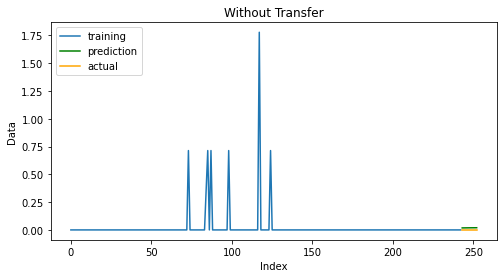

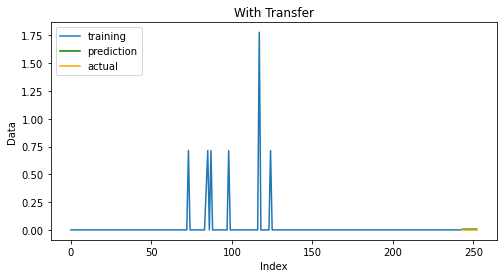

******Training on Repo ID: 95820413 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 6s 34ms/step - loss: 0.0093
Epoch 2/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0091
Epoch 3/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0091
Epoch 4/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0090
Epoch 5/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0090
Epoch 6/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0090
Epoch 7/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0090
Epoch 8/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0090
Epoch 9/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0090
Epoch 10/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0090


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [=============

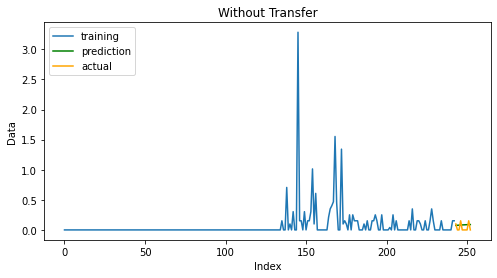

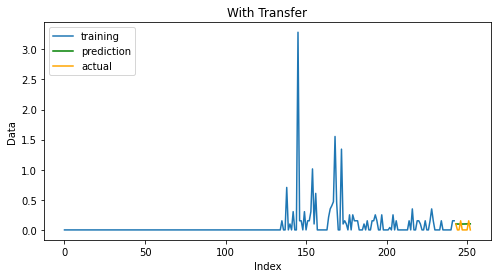

******Training on Repo ID: 20941526 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0010
Epoch 2/10
173/173 [==============================] - 6s 32ms/step - loss: 8.1907e-04
Epoch 3/10
173/173 [==============================] - 5s 32ms/step - loss: 7.8906e-04
Epoch 4/10
173/173 [==============================] - 5s 31ms/step - loss: 7.6571e-04
Epoch 5/10
173/173 [==============================] - 5s 31ms/step - loss: 7.4811e-04
Epoch 6/10
173/173 [==============================] - 5s 32ms/step - loss: 7.3465e-04
Epoch 7/10
173/173 [==============================] - 6s 32ms/step - loss: 7.2411e-04
Epoch 8/10
173/173 [==============================] - 5s 32ms/step - loss: 7.1558e-04
Epoch 9/10
173/173 [==============================] - 5s 31ms/step - loss: 7.0842e-04
Epoch 10/10
173/173 [==============================] - 5s 31ms/step - loss: 7.0212e-04


*** Fitting a model with knowledge transfer *

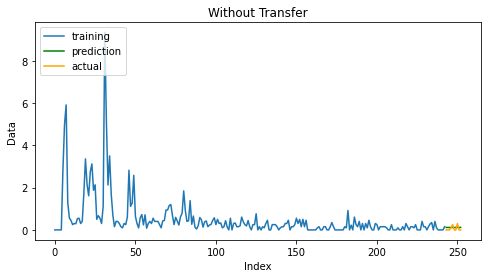

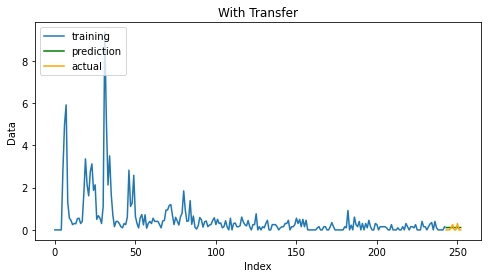

******Training on Repo ID: 188580182 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0153
Epoch 2/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0151
Epoch 3/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0151
Epoch 4/10
173/173 [==============================] - 6s 34ms/step - loss: 0.0150
Epoch 5/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0150
Epoch 6/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0150
Epoch 7/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0149
Epoch 8/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0149
Epoch 9/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0149
Epoch 10/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0149


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [============

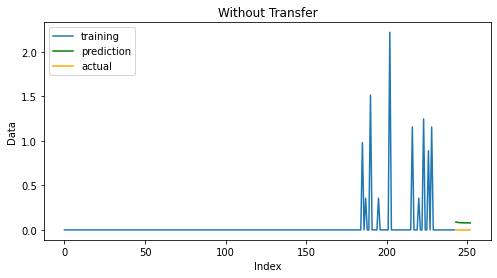

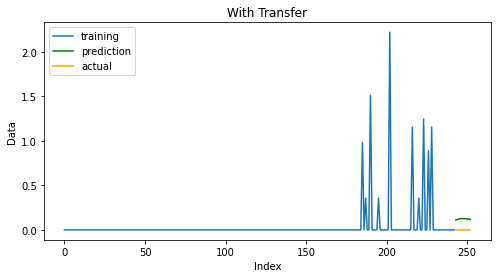

******Training on Repo ID: 147706049 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 5s 29ms/step - loss: 0.0062
Epoch 2/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0062
Epoch 3/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0062
Epoch 4/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0062
Epoch 5/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0062
Epoch 6/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0062
Epoch 7/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0062
Epoch 8/10
173/173 [==============================] - 6s 34ms/step - loss: 0.0062
Epoch 9/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0062
Epoch 10/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0062


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [============

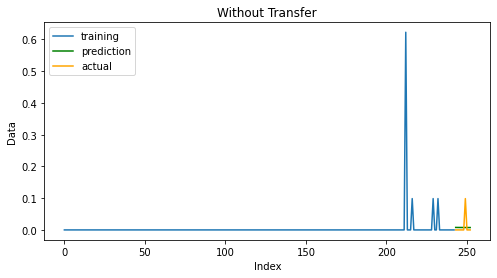

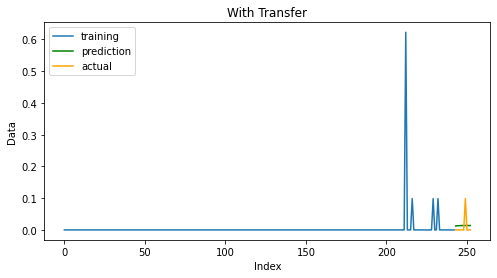

******Training on Repo ID: 105204510 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0059
Epoch 2/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0059
Epoch 3/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0059
Epoch 4/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0059
Epoch 5/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0059
Epoch 6/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0059
Epoch 7/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0059
Epoch 8/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0059
Epoch 9/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0059
Epoch 10/10
173/173 [==============================] - 5s 29ms/step - loss: 0.0059


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [============

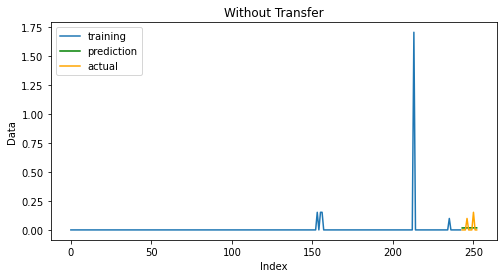

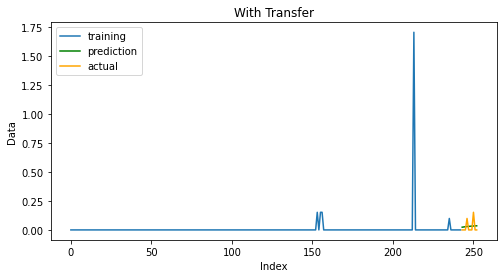

******Training on Repo ID: 91362946 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0207
Epoch 2/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0182
Epoch 3/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0171
Epoch 4/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0166
Epoch 5/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0164
Epoch 6/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0162
Epoch 7/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0161
Epoch 8/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0161
Epoch 9/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0160
Epoch 10/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0160


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [=============

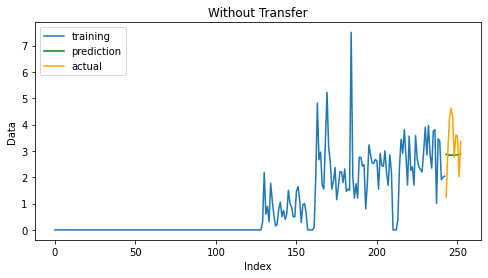

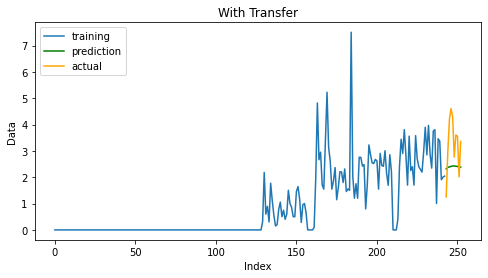

******Training on Repo ID: 171486004 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0128
Epoch 2/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0120
Epoch 3/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0116
Epoch 4/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0113
Epoch 5/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0110
Epoch 6/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0108
Epoch 7/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0107
Epoch 8/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0105
Epoch 9/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0104
Epoch 10/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0103


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [============

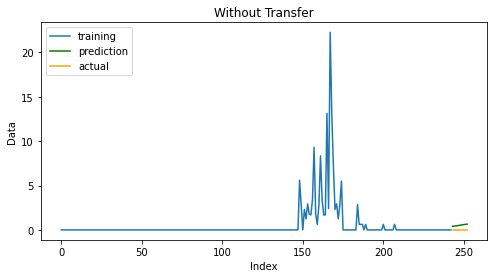

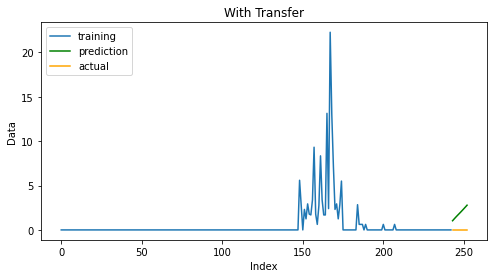

******Training on Repo ID: 23122983 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0446
Epoch 2/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0314
Epoch 3/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0308
Epoch 4/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0307
Epoch 5/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0307
Epoch 6/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0307
Epoch 7/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0307
Epoch 8/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0307
Epoch 9/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0306
Epoch 10/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0306


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [=============

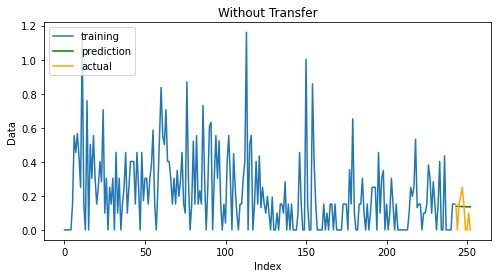

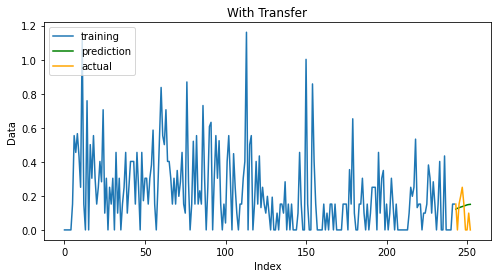

******Training on Repo ID: 118529186 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0036
Epoch 2/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0022
Epoch 3/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0019
Epoch 4/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0019
Epoch 5/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0019
Epoch 6/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0019
Epoch 7/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0019
Epoch 8/10
173/173 [==============================] - 6s 35ms/step - loss: 0.0019
Epoch 9/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0019
Epoch 10/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0019


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [============

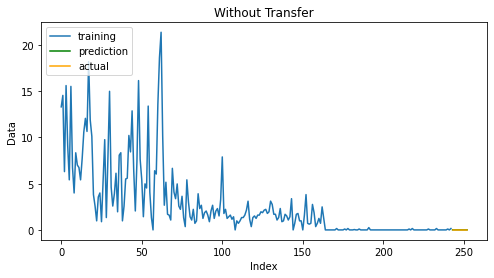

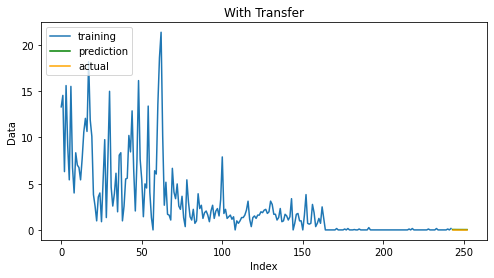

******Training on Repo ID: 112034937 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0561
Epoch 2/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0484
Epoch 3/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0453
Epoch 4/10
173/173 [==============================] - 6s 34ms/step - loss: 0.0440
Epoch 5/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0432
Epoch 6/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0426
Epoch 7/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0422
Epoch 8/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0418
Epoch 9/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0415
Epoch 10/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0412


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [============

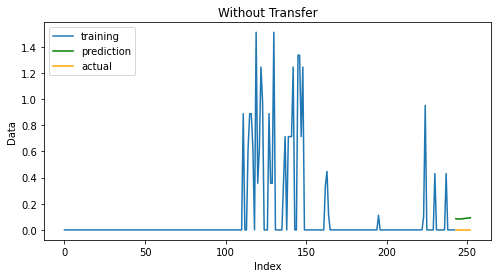

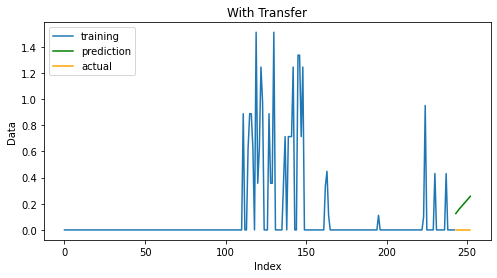

******Training on Repo ID: 21999568 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0243
Epoch 2/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0237
Epoch 3/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0236
Epoch 4/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0236
Epoch 5/10
173/173 [==============================] - 6s 34ms/step - loss: 0.0235
Epoch 6/10
173/173 [==============================] - 6s 34ms/step - loss: 0.0235
Epoch 7/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0235
Epoch 8/10
173/173 [==============================] - 6s 34ms/step - loss: 0.0235
Epoch 9/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0235
Epoch 10/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0235


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [=============

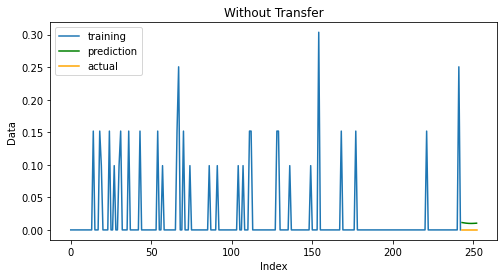

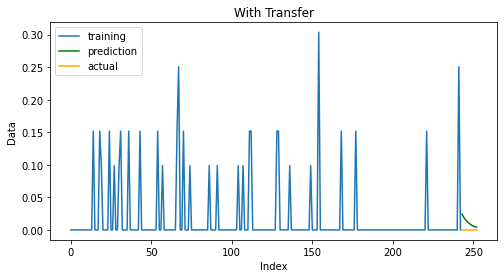

******Training on Repo ID: 53160128 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0161
Epoch 2/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0140
Epoch 3/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0139
Epoch 4/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0139
Epoch 5/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0138
Epoch 6/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0138
Epoch 7/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0138
Epoch 8/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0138
Epoch 9/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0137
Epoch 10/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0137


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [=============

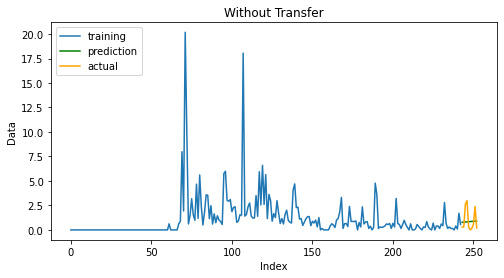

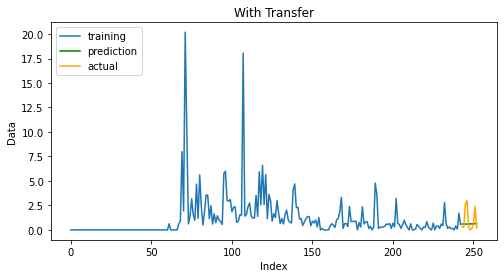

******Training on Repo ID: 93200555 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0126
Epoch 2/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0123
Epoch 3/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0122
Epoch 4/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0121
Epoch 5/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0121
Epoch 6/10
173/173 [==============================] - 6s 34ms/step - loss: 0.0121
Epoch 7/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0121
Epoch 8/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0120
Epoch 9/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0120
Epoch 10/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0120


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [=============

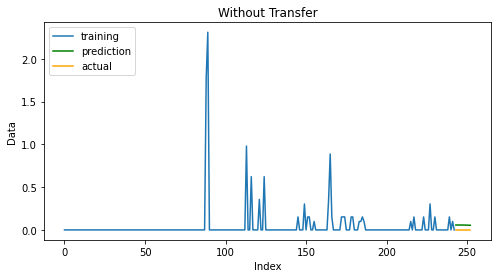

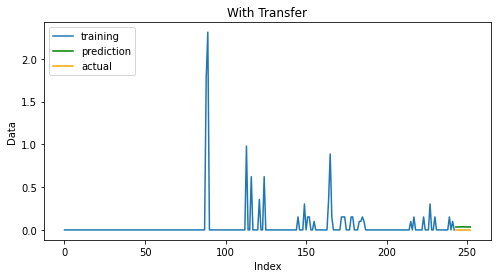

******Training on Repo ID: 46900076 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0075
Epoch 2/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0071
Epoch 3/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0071
Epoch 4/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0071
Epoch 5/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0071
Epoch 6/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0071
Epoch 7/10
173/173 [==============================] - 6s 34ms/step - loss: 0.0071
Epoch 8/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0071
Epoch 9/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0071
Epoch 10/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0071


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [=============

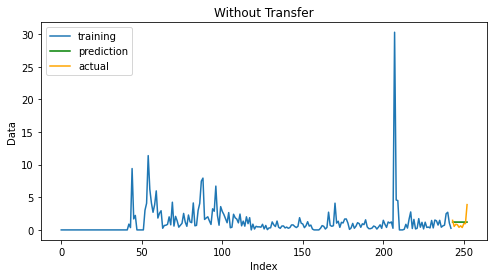

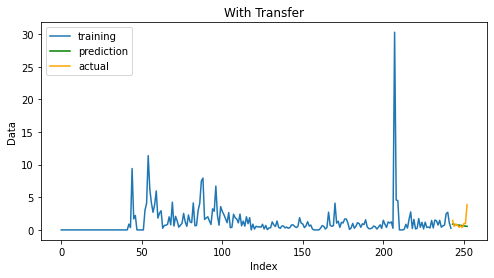

******Training on Repo ID: 92883248 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0140
Epoch 2/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0139
Epoch 3/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0137
Epoch 4/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0136
Epoch 5/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0135
Epoch 6/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0134
Epoch 7/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0134
Epoch 8/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0133
Epoch 9/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0133
Epoch 10/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0132


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [=============

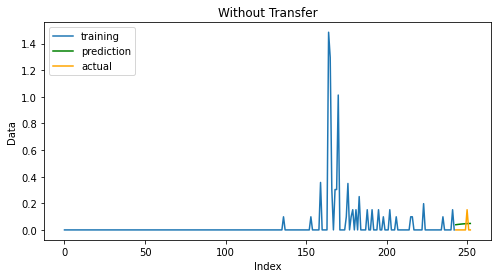

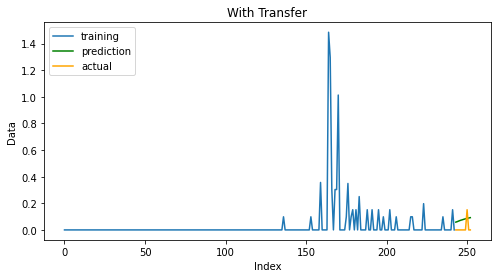

******Training on Repo ID: 96584339 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0405
Epoch 2/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0357
Epoch 3/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0354
Epoch 4/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0352
Epoch 5/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0350
Epoch 6/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0348
Epoch 7/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0346
Epoch 8/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0345
Epoch 9/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0344
Epoch 10/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0342


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [=============

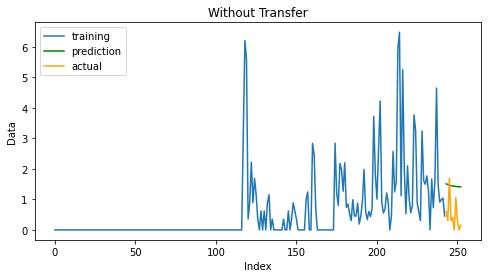

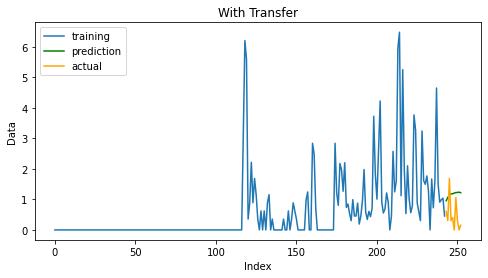

******Training on Repo ID: 24393917 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0201
Epoch 2/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0187
Epoch 3/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0185
Epoch 4/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0185
Epoch 5/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0185
Epoch 6/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0185
Epoch 7/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0184
Epoch 8/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0184
Epoch 9/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0184
Epoch 10/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0184


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [=============

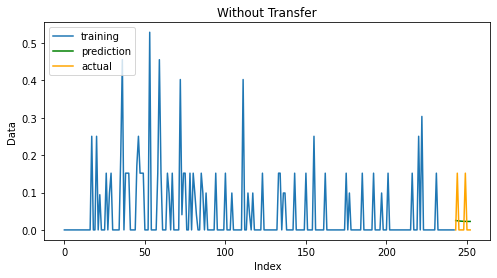

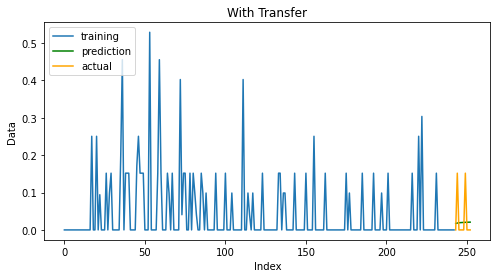

******Training on Repo ID: 179757651 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0501
Epoch 2/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0352
Epoch 3/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0315
Epoch 4/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0290
Epoch 5/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0271
Epoch 6/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0256
Epoch 7/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0243
Epoch 8/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0232
Epoch 9/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0222
Epoch 10/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0213


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [============

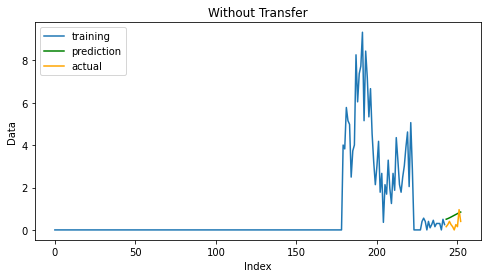

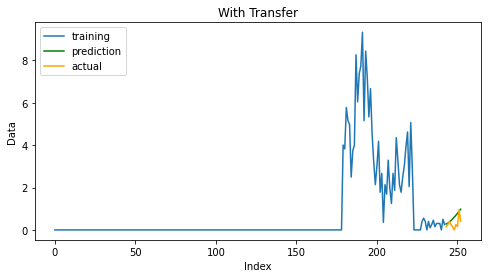

******Training on Repo ID: 164026325 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0291
Epoch 2/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0245
Epoch 3/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0209
Epoch 4/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0189
Epoch 5/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0180
Epoch 6/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0176
Epoch 7/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0172
Epoch 8/10
173/173 [==============================] - 6s 34ms/step - loss: 0.0169
Epoch 9/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0166
Epoch 10/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0163


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [============

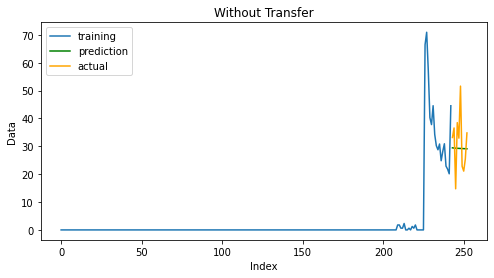

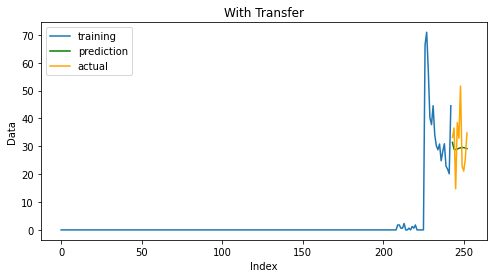

******Training on Repo ID: 26562411 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0065
Epoch 2/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0052
Epoch 3/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0050
Epoch 4/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0048
Epoch 5/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0047
Epoch 6/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0046
Epoch 7/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0046
Epoch 8/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0045
Epoch 9/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0045
Epoch 10/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0045


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [=============

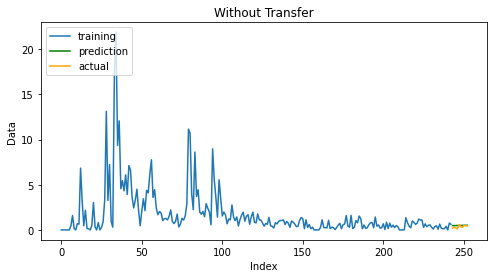

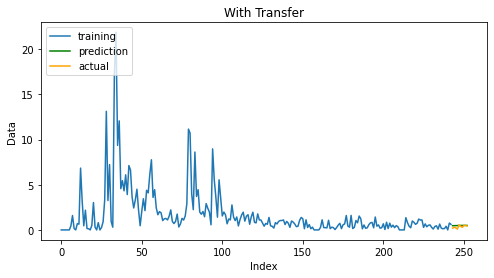

******Training on Repo ID: 111739948 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0290
Epoch 2/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0250
Epoch 3/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0234
Epoch 4/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0224
Epoch 5/10
173/173 [==============================] - 6s 34ms/step - loss: 0.0217
Epoch 6/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0211
Epoch 7/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0207
Epoch 8/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0203
Epoch 9/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0200
Epoch 10/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0197


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [============

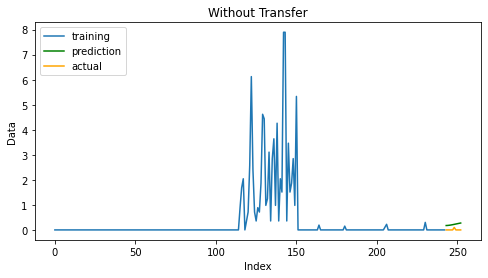

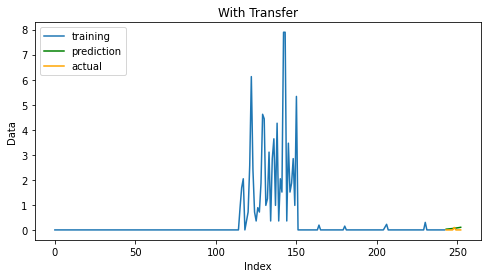

******Training on Repo ID: 31933589 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0270
Epoch 2/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0140
Epoch 3/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0138
Epoch 4/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0137
Epoch 5/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0136
Epoch 6/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0136
Epoch 7/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0135
Epoch 8/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0135
Epoch 9/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0134
Epoch 10/10
173/173 [==============================] - 6s 34ms/step - loss: 0.0134


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [=============

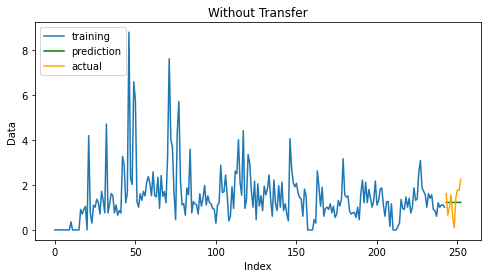

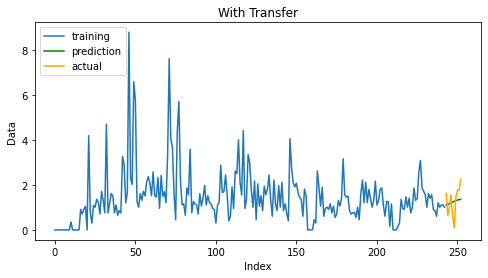

******Training on Repo ID: 143476677 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0207
Epoch 2/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0203
Epoch 3/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0200
Epoch 4/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0198
Epoch 5/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0197
Epoch 6/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0196
Epoch 7/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0196
Epoch 8/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0195
Epoch 9/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0195
Epoch 10/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0194


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [============

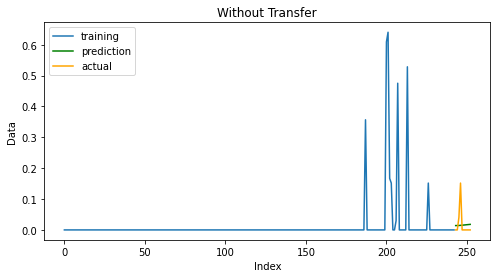

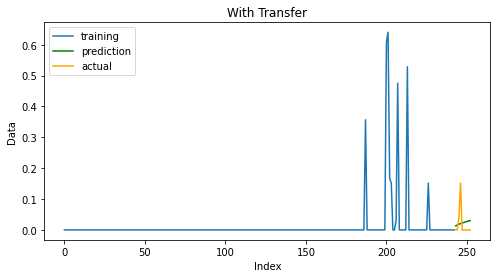

******Training on Repo ID: 93211371 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0272
Epoch 2/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0255
Epoch 3/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0253
Epoch 4/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0251
Epoch 5/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0250
Epoch 6/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0249
Epoch 7/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0248
Epoch 8/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0247
Epoch 9/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0246
Epoch 10/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0246


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [=============

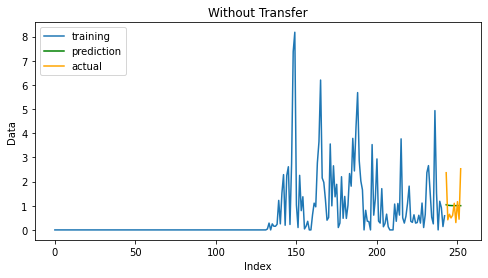

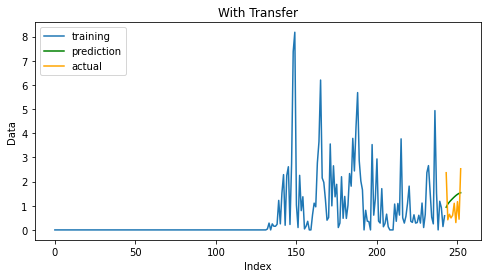

******Training on Repo ID: 131249969 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0061
Epoch 2/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0060
Epoch 3/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0060
Epoch 4/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0060
Epoch 5/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0060
Epoch 6/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0060
Epoch 7/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0060
Epoch 8/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0059
Epoch 9/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0059
Epoch 10/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0059


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [============

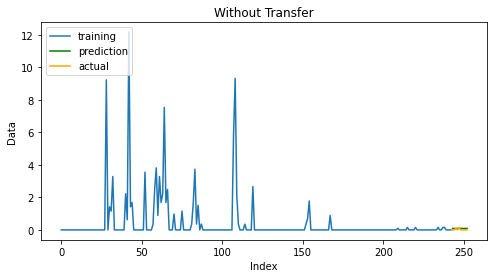

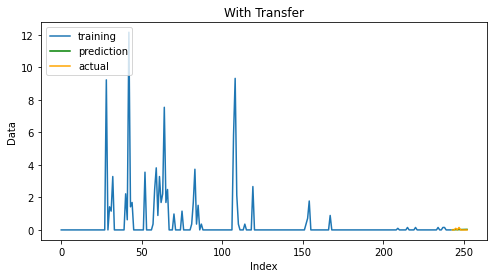

******Training on Repo ID: 24648767 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0118
Epoch 2/10
173/173 [==============================] - 5s 29ms/step - loss: 0.0102
Epoch 3/10
173/173 [==============================] - 6s 35ms/step - loss: 0.0101
Epoch 4/10
173/173 [==============================] - 5s 29ms/step - loss: 0.0100
Epoch 5/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0099
Epoch 6/10
173/173 [==============================] - 5s 29ms/step - loss: 0.0099
Epoch 7/10
173/173 [==============================] - 5s 28ms/step - loss: 0.0099
Epoch 8/10
173/173 [==============================] - 5s 28ms/step - loss: 0.0098
Epoch 9/10
173/173 [==============================] - 5s 28ms/step - loss: 0.0098
Epoch 10/10
173/173 [==============================] - 5s 28ms/step - loss: 0.0098


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [=============

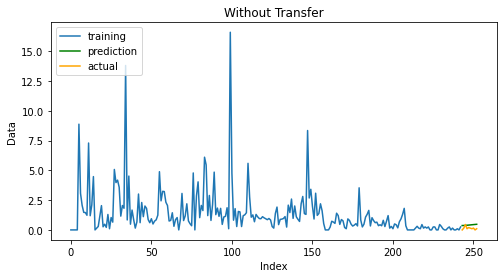

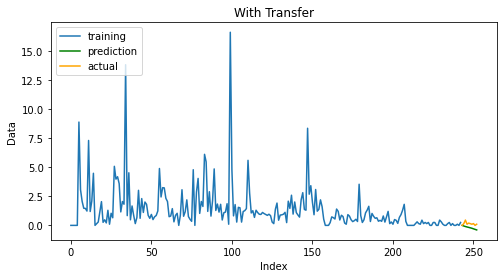

******Training on Repo ID: 20873044 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0851
Epoch 2/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0226
Epoch 3/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0224
Epoch 4/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0223
Epoch 5/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0222
Epoch 6/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0221
Epoch 7/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0220
Epoch 8/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0219
Epoch 9/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0218
Epoch 10/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0217


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [=============

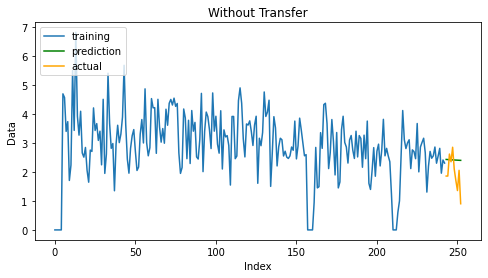

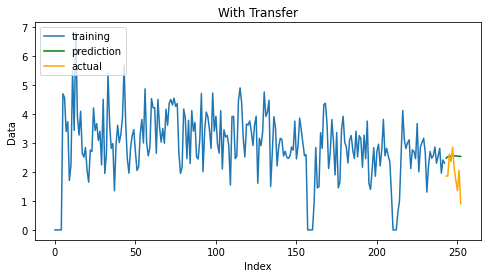

******Training on Repo ID: 67898566 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 5s 32ms/step - loss: 3.1053e-04
Epoch 2/10
173/173 [==============================] - 5s 32ms/step - loss: 3.1268e-04
Epoch 3/10
173/173 [==============================] - 5s 31ms/step - loss: 3.1185e-04
Epoch 4/10
173/173 [==============================] - 5s 31ms/step - loss: 3.1108e-04
Epoch 5/10
173/173 [==============================] - 5s 32ms/step - loss: 3.1045e-04
Epoch 6/10
173/173 [==============================] - 6s 32ms/step - loss: 3.0986e-04
Epoch 7/10
173/173 [==============================] - 6s 34ms/step - loss: 3.0932e-04
Epoch 8/10
173/173 [==============================] - 5s 32ms/step - loss: 3.0878e-04
Epoch 9/10
173/173 [==============================] - 6s 32ms/step - loss: 3.0823e-04
Epoch 10/10
173/173 [==============================] - 5s 32ms/step - loss: 3.0767e-04


*** Fitting a model with knowledge transf

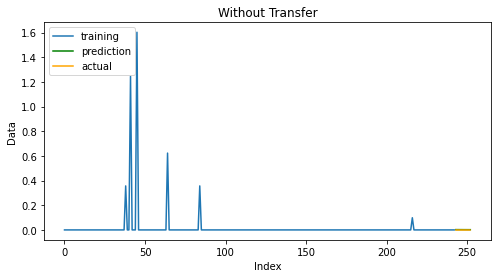

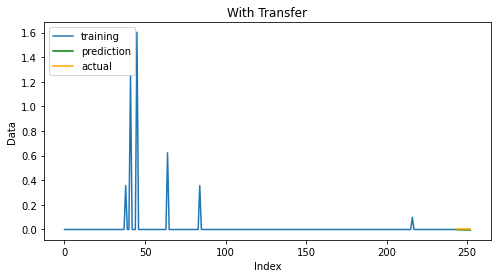

******Training on Repo ID: 178105940 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0048
Epoch 2/10
173/173 [==============================] - 6s 34ms/step - loss: 0.0049
Epoch 3/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0048
Epoch 4/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0047
Epoch 5/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0047
Epoch 6/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0047
Epoch 7/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0046
Epoch 8/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0046
Epoch 9/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0046
Epoch 10/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0046


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [============

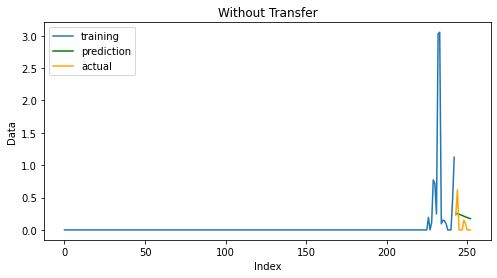

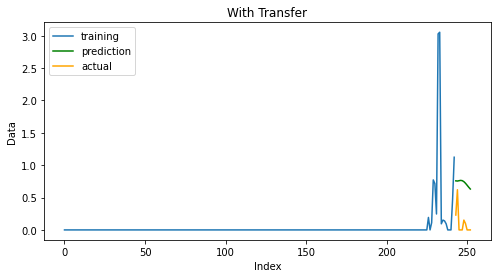

******Training on Repo ID: 50904245 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0180
Epoch 2/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0121
Epoch 3/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0116
Epoch 4/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0114
Epoch 5/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0112
Epoch 6/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0110
Epoch 7/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0109
Epoch 8/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0107
Epoch 9/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0106
Epoch 10/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0106


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [=============

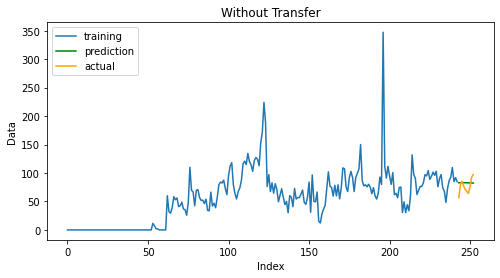

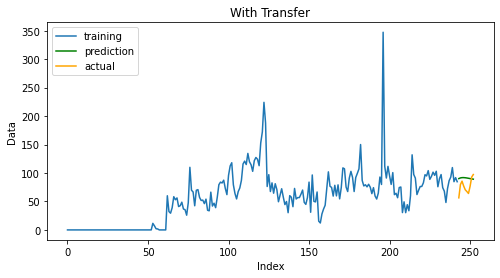

******Training on Repo ID: 2211243 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0550
Epoch 2/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0254
Epoch 3/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0245
Epoch 4/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0239
Epoch 5/10
173/173 [==============================] - 7s 39ms/step - loss: 0.0234
Epoch 6/10
173/173 [==============================] - 6s 34ms/step - loss: 0.0230
Epoch 7/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0227
Epoch 8/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0223
Epoch 9/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0220
Epoch 10/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0217


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [==============

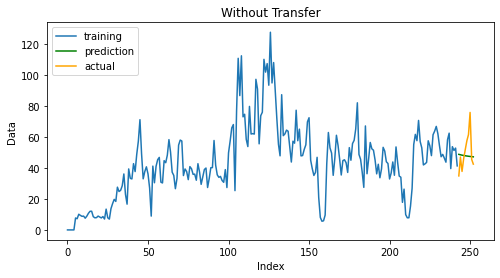

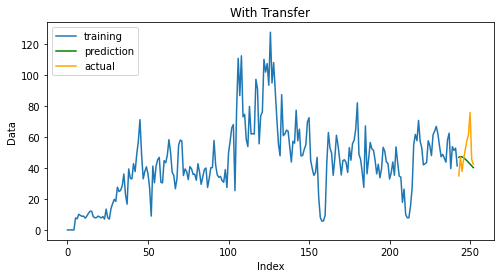

******Training on Repo ID: 138754790 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0215
Epoch 2/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0178
Epoch 3/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0164
Epoch 4/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0159
Epoch 5/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0157
Epoch 6/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0156
Epoch 7/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0154
Epoch 8/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0154
Epoch 9/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0153
Epoch 10/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0152


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [============

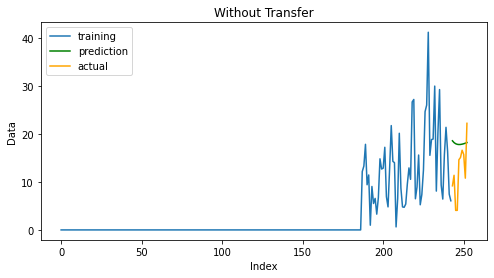

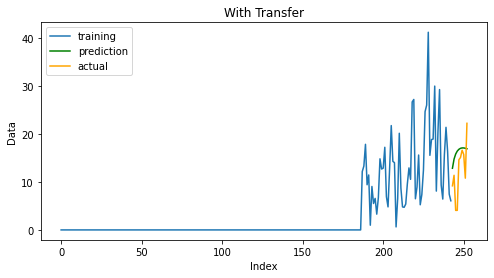

******Training on Repo ID: 33884891 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0137
Epoch 2/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0108
Epoch 3/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0109
Epoch 4/10
173/173 [==============================] - 6s 33ms/step - loss: 0.0109
Epoch 5/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0109
Epoch 6/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0109
Epoch 7/10
173/173 [==============================] - 6s 34ms/step - loss: 0.0109
Epoch 8/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0109
Epoch 9/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0108
Epoch 10/10
173/173 [==============================] - 6s 34ms/step - loss: 0.0108


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [=============

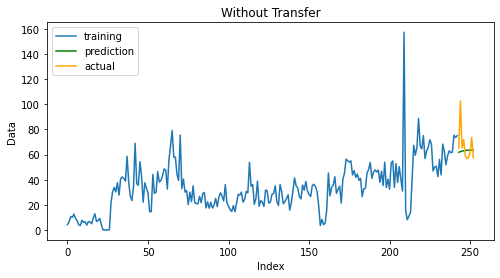

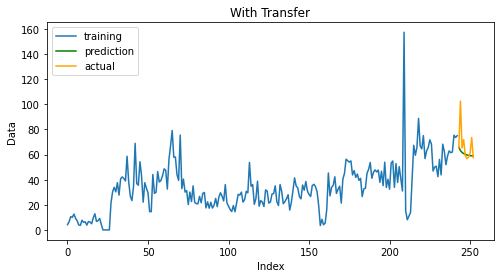

******Training on Repo ID: 86057409 ********
*** Fitting a model without knowledge transfer ***
Epoch 1/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0296
Epoch 2/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0252
Epoch 3/10
173/173 [==============================] - 5s 32ms/step - loss: 0.0243
Epoch 4/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0238
Epoch 5/10
173/173 [==============================] - 5s 31ms/step - loss: 0.0233
Epoch 6/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0229
Epoch 7/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0226
Epoch 8/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0223
Epoch 9/10
173/173 [==============================] - 5s 30ms/step - loss: 0.0221
Epoch 10/10
173/173 [==============================] - 6s 32ms/step - loss: 0.0219


*** Fitting a model with knowledge transfer ***
Epoch 1/10
173/173 [=============

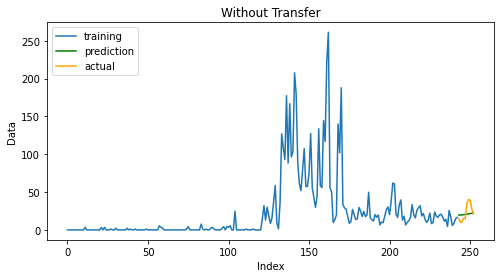

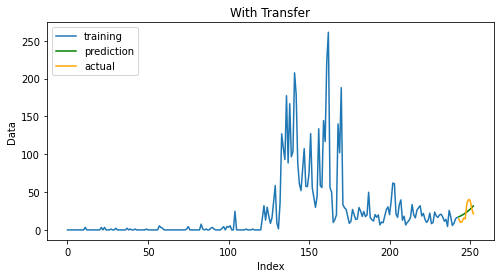

In [124]:
# repo_ids.remove(156630873)


for r in range(0,len(repo_ids)):
        print('******Training on Repo ID: {} ********'.format(repo_ids[r]))

        Sub_WeeklyTS = WeeklyTS[WeeklyTS['repoID']==repo_ids[r]].sort_values(by=['Date'])
        Sub_WeeklyTS.index=Sub_WeeklyTS['Date']
        Sub_WeeklyTS.drop('Date',axis=1,inplace=True)
        idx = pd.date_range('2015-01-01', today, freq='W-SUN')
        Sub_WeeklyTS.index = pd.DatetimeIndex(Sub_WeeklyTS.index)
        Sub_WeeklyTS = Sub_WeeklyTS.reindex(idx, fill_value=0)
        Sub_WeeklyTS.drop(['repoID'], axis=1, inplace=True)
        Risk_Score = Sub_WeeklyTS.Risk_Score.to_numpy()


        model_ = TransferLearning(Risk_Score,params,model=model_)

In [130]:
# serialize model to JSON
model_json =model_.to_json()

with open("Transfer_learning_model.json", "w") as json_file:
    json_file.write(model_json)

# serialize weights to HDF5
model_.save('Transfer_learning_model.h5')

model_.save_weights("Transfer_learning_model_weights.h5")

# Testing model

In [19]:
from tensorflow import keras

model_ = keras.models.load_model('Transfer_learning_model')

In [31]:
Sub_WeeklyTS = WeeklyTS[WeeklyTS['repoID']==20873044].sort_values(by=['Date'])
Sub_WeeklyTS.index=Sub_WeeklyTS['Date']
Sub_WeeklyTS.drop('Date',axis=1,inplace=True)
idx = pd.date_range('2015-01-01', today, freq='W-SUN')
Sub_WeeklyTS.index = pd.DatetimeIndex(Sub_WeeklyTS.index)
Sub_WeeklyTS = Sub_WeeklyTS.reindex(idx, fill_value=0)
Sub_WeeklyTS.drop(['repoID'], axis=1, inplace=True)
Risk_Score = Sub_WeeklyTS.Risk_Score

In [49]:
input_size=70
n_ahead=10
scaled_series, scaler = preprocessing(Risk_Score)
series, y_test, n_test = getSeries(scaled_series,0.8)
X_train,y_train,X_test = getInputOutput(series,input_size)

In [55]:
prediction = model_.predict(X_test, batch_size=1)

In [ ]:
prediction.

In [ ]:
# show only n_ahead number of actual values
y_test = y_test[np.arange(n_ahead)]

# rescaling
series = inverse_transform(series, scaler)
y_test = inverse_transform(y_test, scaler)

predictions = predict_ahead(model_,X_test,n_ahead)
predictions = np.zeros(n_ahead)
predictions[0] = model.predict(X_test,batch_size = 1)

predictions_withTransfer = inverse_transform(predictions, scaler)
mse_withTransfer = mean_squared_error(y_true=y_test,y_pred=predictions_withTransfer)
  
print('The RMSE is {}'.format(round(np.sqrt(mse_withTransfer),4)))
    
view_predictions(series,predictions_withTransfer,y_test,title='With Transfer')




In [120]:
hist = model_.history
ViewLoss(hist)
view_predictions(Risk_Score,best_prediction,yt,'Actual vs Forecast')
print('mean-squared-error: {}'.format(mse))
